In [2]:
batch_size = 4
num_epochs = 25
image_size = 256


# Import Libaries

In [3]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm
import pandas as pd
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
import torch
import torch.optim as optim
import itertools
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [4]:
text_data = pd.read_csv("/kaggle/input/flickr8k/captions.txt", sep="|")
text_data["number_of_words"] = text_data["caption_text"].apply(lambda text: len(text.split()))
text_data

,image_name,caption_number,caption_text,number_of_words
0,1000268201_693b08cb0e.jpg,0,A child in a pink dress is climbing up a set o...,18
1,1000268201_693b08cb0e.jpg,1,A girl going into a wooden building .,8
2,1000268201_693b08cb0e.jpg,2,A little girl climbing into a wooden playhouse .,9
3,1000268201_693b08cb0e.jpg,3,A little girl climbing the stairs to her playh...,10
4,1000268201_693b08cb0e.jpg,4,A little girl in a pink dress going into a woo...,13
...,...,...,...,...
40450,997722733_0cb5439472.jpg,0,A man in a pink shirt climbs a rock face,10
40451,997722733_0cb5439472.jpg,1,A man is rock climbing high in the air .,10
40452,997722733_0cb5439472.jpg,2,A person in a red shirt climbing up a rock fac...,16
40453,997722733_0cb5439472.jpg,3,A rock climber in a red shirt .,8


In [5]:
image_folder = '/kaggle/input/flickr8k/images'
image_filenames = os.listdir(image_folder)
image_filenames = [filename for filename in image_filenames if filename.endswith(('.jpg', '.png'))]

# image_filenames = image_filenames[0:100]

train_captions = []
test_captions = []
for image_filename in tqdm(image_filenames):
    caption = text_data[text_data['image_name']==image_filename].sort_values(by="number_of_words",ascending=False).reset_index(drop=True)['caption_text']
    train_caption = caption[0]
    test_caption = caption[1]
    train_captions.append( train_caption )
    test_captions.append( test_caption )

100%|██████████| 8091/8091 [01:02<00:00, 128.70it/s]


In [6]:
import os
# Get the number of available processors
num_processors = os.cpu_count()

# Example dataset class
class ImageTextDataset(Dataset):
    def __init__(self, image_filenames, captions, image_size=224):
        self.image_filenames = image_filenames
        self.captions = captions
        self.transform = transforms.Compose([
                                                transforms.Resize((image_size, image_size)),  # Resize images to a consistent size
                                                transforms.ToTensor(),          # Convert images to tensors
                                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize images
                                            ])
    
    def __len__(self):
        return len(self.image_filenames)
    
    def __getitem__(self, index):
        image = Image.open("/kaggle/input/flickr8k/images/"+image_filenames[index])
        image = self.transform(image) # .permute(2,1,0)
        text = self.captions[index]
        
        return image, text

# Create an instance of the dataset
train_dataset = ImageTextDataset(image_filenames, train_captions, image_size)
test_dataset = ImageTextDataset(image_filenames, test_captions, image_size)

# Create a DataLoader
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True ) # , prefetch_factor=num_processors, num_workers=1, pin_memory=True, drop_last=True
test_dataloader = DataLoader(test_dataset, batch_size=batch_size*16, shuffle=False ) # , prefetch_factor=num_processors, num_workers=1, pin_memory=True, drop_last=False

In [7]:
i=0
train_dataset.__getitem__(i)[0].shape, train_dataset.__getitem__(i)[1]

(torch.Size([3, 256, 256]),
 'A white and brown spotted dog runs along the snow to catch a ball .')

# Display Few Image with Caption

In [8]:
# Fetch a batch from the dataloader
batch_images, batch_texts = next(iter(train_dataloader))



In [9]:
batch_images.shape


torch.Size([4, 3, 256, 256])

In [10]:
batch_texts

('A group of people sit on an outdoor patio with lots of potted plants .',
 'A black and white dog wearing a red collar is digging in the dirt .',
 'Three large dogs , one brown and the others black , tussle over a red toy in the grass outside a building .',
 'A woman works hard to maintain a fingerhold as she climbs a rock face .')

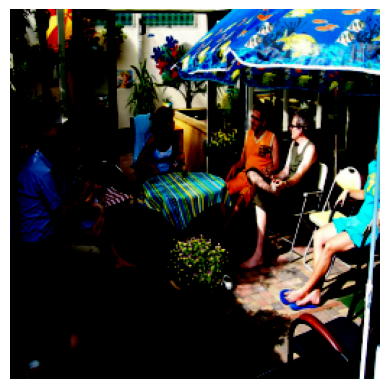

Caption: A group of people sit on an outdoor patio with lots of potted plants . 





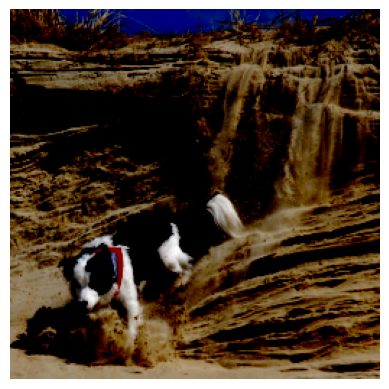

Caption: A black and white dog wearing a red collar is digging in the dirt . 





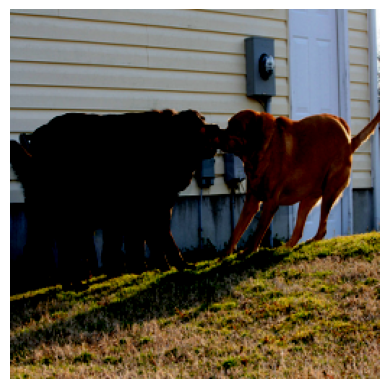

Caption: Three large dogs , one brown and the others black , tussle over a red toy in the grass outside a building . 





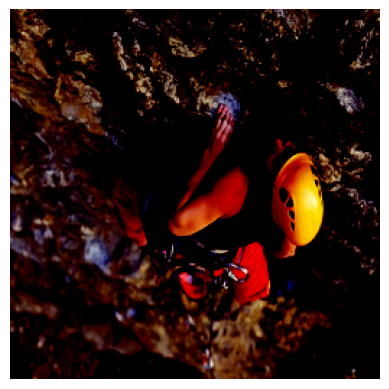

Caption: A woman works hard to maintain a fingerhold as she climbs a rock face . 





In [11]:
for index in range(batch_images.shape[0]):
    # Fetch the image and text for the chosen index
    image_to_display = batch_images[index]
    text_to_display = batch_texts[index]

    # Convert the image tensor to a NumPy array
    image_to_display_np = image_to_display.permute(1, 2, 0).numpy()

    # Display the image using matplotlib
    plt.imshow(image_to_display_np)
    plt.axis('off')  # Turn off axis labels
    plt.show()

    # Display the corresponding text
    print("Caption:", text_to_display, "\n\n\n")
    if index>=5:
        break

In [16]:
import torch
from transformers import DistilBertTokenizer, DistilBertModel, AutoTokenizer

# Load pre-trained DistilBERT model and tokenizer
model_name = 'distilbert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name) # DistilBertTokenizer.from_pretrained(model_name) 
model = DistilBertModel.from_pretrained(model_name)

def generate_text_embeddings(texts):
    # Tokenize input texts
    inputs = tokenizer(texts, return_tensors='pt', padding=True, truncation=True)

    # Generate embeddings
    with torch.no_grad():
        outputs = model(**inputs)

    # Get the embeddings from the last hidden layer
    embeddings = outputs.last_hidden_state[:, 0, :] # <---CLS # outputs.last_hidden_state.mean(dim=1)  # You can use other aggregation methods

    return embeddings

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/483 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [17]:
# List of input texts
texts = [ "yo yo CLIP Model", "DistilBERT is a great model for text embedding.", "Vision Transformers for image.", "Contrative Learning" ]

# Generate embeddings
embeddings = generate_text_embeddings(texts)
print("Shape of embeddings:", embeddings.shape)  # Should print (num_texts, embedding_size)

Shape of embeddings: torch.Size([4, 768])


# Model Implementation

In [18]:
import torch
import torch.nn as nn
dropout = 0.1
class ImageProjection(nn.Module):
    def __init__(self, image_embedding_size, shared_embedding_size):
        super(ImageProjection, self).__init__()
        self.image_projection = nn.Linear(image_embedding_size, shared_embedding_size)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(shared_embedding_size, shared_embedding_size)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(shared_embedding_size)
        
    def forward(self, image_embeddings):
        projected_embeddings = self.image_projection(image_embeddings)
        
        x = self.gelu(projected_embeddings)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected_embeddings
        x = self.layer_norm(x)
        
        return x # projected_embeddings

class TextProjection(nn.Module):
    def __init__(self, text_embedding_size, shared_embedding_size):
        super(TextProjection, self).__init__()
        self.text_projection = nn.Linear(text_embedding_size, shared_embedding_size)
        self.gelu = nn.GELU()
        self.fc = nn.Linear(shared_embedding_size, shared_embedding_size)
        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(shared_embedding_size)
        
    def forward(self, text_embeddings):
        projected_embeddings = self.text_projection(text_embeddings)
        
        x = self.gelu(projected_embeddings)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected_embeddings
        x = self.layer_norm(x)
        
        return x # projected_embeddings
        


batch_idx:  0  Image Shape:  torch.Size([4, 3, 256, 256]) Text Count:  4


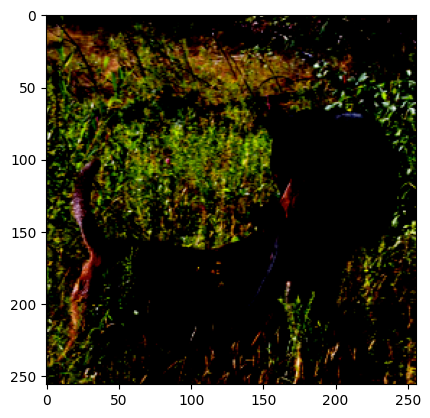

A brown dog and a black dog are standing against each other in some grass


In [19]:
import os

# Set the environment variable
os.environ["TOKENIZERS_PARALLELISM"] = "true" 

# Checking Data Setup
for batch_idx, (images, texts) in enumerate(train_dataloader):
    print( "batch_idx: ", batch_idx, " Image Shape: ", images.shape, "Text Count: ", len(texts) )
    plt.imshow( torch.moveaxis( images[0], 0, 2 ).numpy() )
    plt.show()
    print(texts[0])
    break

In [20]:
dropout = 0.1

def cross_entropy(preds, targets, reduction='none'):
    log_softmax = nn.LogSoftmax(dim=-1)
    loss = (-targets * log_softmax(preds)).sum(1)
    if reduction == "none":
        return loss
    elif reduction == "mean":
        return loss.mean()

temperature_value = 1

def contrastive_clip_loss_function( text_projection,  image_projection, mode="eval" ):
    logits = (text_projection @ image_projection.T) / temperature_value
    if mode=="train":
        images_similarity = image_projection @ image_projection.T
        texts_similarity = text_projection @ text_projection.T
        targets = F.softmax( (images_similarity + texts_similarity) / 2 * temperature_value, dim=-1 )
        texts_loss = cross_entropy(logits, targets, reduction='none')
        images_loss = cross_entropy(logits.T, targets.T, reduction='none')
        loss =  (images_loss + texts_loss) / 2.0 # shape: (batch_size)
        return loss.mean()
    elif mode=="eval":
        return logits
    else:
        print("Mention mode")
        return None

In [21]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import time

# Training Model - ResNet50 + Distil BERT

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [23]:

shared_embedding_size = 512  
learning_rate = 5e-4

image_embedding_size=1024*2
resnet_model = models.resnet50(pretrained=True)
resnet_model = nn.Sequential( *list(resnet_model.children())[:-1] )
resnet_model.to(device)

max_length = 32
text_embedding_size = 768 
model_name = 'distilbert-base-uncased'
text_tokenizer = DistilBertTokenizer.from_pretrained(model_name) # .to(device)
text_model = DistilBertModel.from_pretrained(model_name ).to(device)

image_projector = ImageProjection(image_embedding_size, shared_embedding_size).to(device)
text_projector = TextProjection(text_embedding_size, shared_embedding_size).to(device)

params = [{"params":resnet_model.parameters(), "lr":1e-4 }, {"params":text_model.parameters(), "lr":1e-5}, 
          # {"params":image_projector.parameters(), "lr": }, {"params":text_projector.parameters(), "lr":}
          {"params": itertools.chain( image_projector.parameters(), text_projector.parameters() ), "lr":1e-3 , "weight_decay":1e-3 }
         ]
optimizer = optim.AdamW( params,  weight_decay=0. )
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau( optimizer, mode="min", patience=2 , factor=0.8 )


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 54.7MB/s]


In [24]:
import torch

# Load the saved model checkpoint
checkpoint_path = "/kaggle/input/rensetbertflickr308/model_from_Scratch_ResNet_DistilBERT_30_25_8_20.h5"
checkpoint = torch.load(checkpoint_path)


# Load the state dictionaries into the models and optimizer
resnet_model.load_state_dict(checkpoint['resnet_model_dict'])
text_model.load_state_dict(checkpoint['text_model_dict'])
image_projector.load_state_dict(checkpoint['image_projector_dict'])
text_projector.load_state_dict(checkpoint['text_projector_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# Set the models to evaluation mode

image_projector.eval()




ImageProjection(
  (image_projection): Linear(in_features=2048, out_features=512, bias=True)
  (gelu): GELU(approximate='none')
  (fc): Linear(in_features=512, out_features=512, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
)

In [25]:
resnet_model.eval()


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [26]:
text_model.eval()

DistilBertModel(
  (embeddings): Embeddings(
    (word_embeddings): Embedding(30522, 768, padding_idx=0)
    (position_embeddings): Embedding(512, 768)
    (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
    (dropout): Dropout(p=0.1, inplace=False)
  )
  (transformer): Transformer(
    (layer): ModuleList(
      (0-5): 6 x TransformerBlock(
        (attention): MultiHeadSelfAttention(
          (dropout): Dropout(p=0.1, inplace=False)
          (q_lin): Linear(in_features=768, out_features=768, bias=True)
          (k_lin): Linear(in_features=768, out_features=768, bias=True)
          (v_lin): Linear(in_features=768, out_features=768, bias=True)
          (out_lin): Linear(in_features=768, out_features=768, bias=True)
        )
        (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
        (ffn): FFN(
          (dropout): Dropout(p=0.1, inplace=False)
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Li

In [27]:
text_projector.eval()

TextProjection(
  (text_projection): Linear(in_features=768, out_features=512, bias=True)
  (gelu): GELU(approximate='none')
  (fc): Linear(in_features=512, out_features=512, bias=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (layer_norm): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
)

In [29]:
import matplotlib.pyplot as plt

# List to store the training losses
train_losses = []
num_epochs=1
# - - - - - - - - -  Training loop  - - - - - - - - -
for epoch in range(num_epochs):
    # Record the start time
    start_time = time.time()
    print( " - - - - - - - - - - - Epoch:", epoch+1, " - - - - - - - - - - - - "  )
    resnet_model.train()
    text_model.train()
    image_projector.train()
    text_projector.train()
    total_loss = 0.0
    total_images_processed = 0
    for batch_idx, (images, texts) in enumerate(train_dataloader):
        # - - - - - - - - -  Forward pass  - - - - - - - - -
        optimizer.zero_grad()
        
        # - - - -  Text  - - - - 
        inputs = tokenizer(texts, return_tensors='pt', padding="max_length", max_length=max_length, truncation=True)
        inputs = inputs.to(device)
        outputs = text_model(**inputs)
        text_embeddings = outputs.last_hidden_state[:, 0, :] # outputs.last_hidden_state.mean(dim=1)
        text_projection = text_projector(text_embeddings)
        
        # - - - -  Image  - - - - 
        images = images.to(device)
        # images = preprocess_images(images)
        image_embeddings = resnet_model(images)
        image_projection = image_projector(image_embeddings[:,:,0,0])
        
        # - - - -  Compute Loss  - - - -
        # loss = sym_loss_fn(image_projection, text_projection)
        # loss = contrastive_loss(image_projection, text_projection)
        loss = contrastive_clip_loss_function( text_projection,  image_projection, mode="train")
        
        # - - - -  Backpropagation  - - - -
        loss.backward()
        optimizer.step()

        # - - - - Loss print - - - -
        total_loss += loss.item()
        if batch_idx % 200 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}], Batch [{batch_idx}/{len(train_dataloader)}], Loss: {total_loss/((batch_idx+1)*batch_size):.4f}")
    
    
    lr_scheduler.step(total_loss)
    
    # Record the end time
    end_time = time.time()
    elapsed_time = end_time - start_time
    # - - - - Loss each epoch
    avg_loss = total_loss / len(train_dataloader)
    train_losses.append(avg_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}", "  Time Taken: ", elapsed_time, " seconds" )

 - - - - - - - - - - - Epoch: 1  - - - - - - - - - - - - 
Epoch [1/1], Batch [0/2023], Loss: 0.0009
Epoch [1/1], Batch [200/2023], Loss: 0.0140
Epoch [1/1], Batch [400/2023], Loss: 0.0121
Epoch [1/1], Batch [800/2023], Loss: 0.0127
Epoch [1/1], Batch [1000/2023], Loss: 0.0133
Epoch [1/1], Batch [1200/2023], Loss: 0.0124
Epoch [1/1], Batch [1600/2023], Loss: 0.0124
Epoch [1/1], Batch [1800/2023], Loss: 0.0125
Epoch [1/1], Batch [2000/2023], Loss: 0.0127
Epoch [1/1], Average Loss: 0.0508   Time Taken:  243.77478766441345  seconds


In [ ]:
# # Calculate elapsed time
# end_time = time.time()
# elapsed_time = end_time - start_time

# # Calculate images processed per second
# images_per_second = total_images_processed / elapsed_time

# # Plot the training loss graph
# plt.plot(losses)
# plt.title('Training Loss')
# plt.xlabel('Batch Iteration')
# plt.ylabel('Loss')
# plt.show()

# lr_scheduler.step(total_loss)

# # - - - - Loss each epoch
# avg_loss = total_loss / len(train_dataloader)
# print(f"Epoch [{epoch+1}/{num_epochs}], Average Loss: {avg_loss:.4f}, Images per Second: {images_per_second:.2f}")
# print("  Time Taken: ", elapsed_time, " seconds" )

In [ ]:
# Plot the training loss graph
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.show()

In [ ]:
# Plot the training loss graph
plt.plot(range(1, num_epochs+1), train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.savefig('training_loss_graph.png')  # Save the graph as a PNG image
plt.show()


In [ ]:
resnet_model.eval()
image_projector.eval()

def create_image_embeddings(images):
    with torch.no_grad():
        image_embeddings = resnet_model(images)
        image_projection = image_projector(image_embeddings[:,:,0,0])
    return image_projection

image_embeddings_list_train = []

for index in tqdm(range(len( train_dataset ))):
    images = train_dataset[index][0]
    images = images.to(device)
    image_projection = create_image_embeddings(images.unsqueeze(0))
    image_embeddings_list_train.append( image_projection[0] )
    
    
def image_retrieval_function( input_query, n , display=False): # n --> number of images
    with torch.no_grad():
        inputs = tokenizer(input_query, return_tensors='pt', padding="max_length", max_length=max_length, truncation=True)
        inputs = inputs.to(device)
        outputs = text_model(**inputs)
        text_embeddings = outputs.last_hidden_state.mean(dim=1)
        text_projection = text_projector(text_embeddings)
    
    similarity_scores_list = []
    for index in tqdm(range(len(image_embeddings_list_train))):
        score = torch.dot( text_projection[0], image_embeddings_list_train[index] )
        similarity_scores_list.append( score.cpu().numpy() )
    
    max_indexes = np.array(similarity_scores_list).argsort()[-n:][::-1]
    if display:
        for index in max_indexes:
            image_tensor = train_dataset[index][0]
            plt.imshow( torch.moveaxis(image_tensor, 0,2) )
            plt.show()
        return None
    else:
        return max_indexes

In [ ]:
input_query = "fire"
image_retrieval_function( input_query, n=3, display=True )

# Evaluation | Testing

accuracy too low

Take a video extract its audio, get it transripted the audio using whisper etc .. put subitile for every second , 
Store the transcription along with the corresponding timestamps. Ensure that each phrase in the transcription is associated with its respective timestamp in the video.
When a user submits a query like "When does it say curl?", process the query to identify the specific keywords or phrases (e.g., "curl") for which the user is seeking timestamps.

In [30]:
!pip install pytube

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.8 MB/s eta 0:00:00


In [31]:
import cv2




In [32]:
# # changed client from default ANDROID_MUSIC
from pytube.innertube import _default_clients
_default_clients["ANDROID"] = _default_clients["WEB"]


In [33]:
!pip install datasets

In [34]:
from pytube import YouTube
# from pytubefix.cli import on_progress


In [35]:
from datasets import load_dataset

dataset = load_dataset("AlexZigma/msr-vtt")

Generating train split:   0%|          | 0/6513 [00:00<?, ? examples/s]

Generating val split:   0%|          | 0/497 [00:00<?, ? examples/s]

In [36]:
first_row = dataset['val'][12]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']

In [37]:
video_url

'https://www.youtube.com/watch?v=8qZk2OMuaeg'

In [38]:
dataset['val'][0]

{'video_id': 'video6513',
 'caption': 'a family is having coversation',
 'sen_id': 83560,
 'category': 14,
 'url': 'https://www.youtube.com/watch?v=A9pM9iOuAzM',
 'start time': 116.03,
 'end time': 126.21,
 'split': 'validate',
 'id': 6513,
 '__index_level_0__': 6128}

In [39]:
from pytube import YouTube

def download_video(video_url, output_filename):
    try:
        # Choose a video stream with resolution of 360p
        streams = YouTube(url=video_url).streams.filter(adaptive=True, subtype="mp4", resolution="360p", only_video=True)

        # Check if there is a valid stream
        if len(streams) == 0:
            raise Exception("No suitable stream found for this YouTube video!")

        # Download the video
        print("Downloading...")
        streams[0].download(filename=output_filename)
        print("Download completed.")
        return True
    except Exception as e:
        print(f"Error downloading video: {e}")
        return False

# output_filename = "video.mp4"
output_filename = "video.mp4"
download_video(video_url, output_filename)
#     # Video downloaded successfully
#     print('hehe')
#     # Proceed with further processing
#     pass
# else:
#     # Error occurred while downloading video
    
#     # Skip this row or handle the error as needed
#     pass


Downloading...
Download completed.


True

In [40]:
from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)


In [41]:
import cv2
import os

def extract_frames_with_timestamp(video_file):
    # Open the video file
    cap = cv2.VideoCapture(video_file)
    
    # Initialize lists to store frame data and timestamps
    frames_list = []
    timestamps_list = []
    
    # Initialize variables for frame extraction
    fps = cap.get(cv2.CAP_PROP_FPS)
    interval = int(fps)  # Extract one frame per second
    
    # Initialize frame counter
    frame_count = 0
    
    # Read frames until the end of the video
    while True:
        # Read a frame from the video
        ret, frame = cap.read()
        
        # Break the loop if no frame is read
        if not ret:
            break
        
        # Get the current timestamp (in milliseconds)
        timestamp_ms = cap.get(cv2.CAP_PROP_POS_MSEC)
        
        # Convert timestamp to seconds
        timestamp_sec = timestamp_ms / 1000.0
        
        # Check if it's time to extract a frame
        if frame_count % interval == 0:
            # Append frame and timestamp to the lists
            frames_list.append(frame)
            timestamps_list.append(timestamp_sec)
        
        # Increment frame counter
        frame_count += 1
    
    # Close the video file
    cap.release()
    print("Frames extracted:", len(frames_list))
    return frames_list, timestamps_list

# Example usage:
video_file = "video.mp4"  # Replace with your video file
frames_list, timestamps_list = extract_frames_with_timestamp(video_file)

# Get the last timestamp (in seconds)
last_timestamp_sec = timestamps_list[-1]
print("Last Timestamp (in seconds):", last_timestamp_sec)


Frames extracted: 351
Last Timestamp (in seconds): 338.6716666666667


In [42]:

# Print the first few frames and their timestamps
for frame, timestamp in zip(frames_list[:5], timestamps_list[:5]):
    print(f"Timestamp: {timestamp}, Frame shape: {frame.shape}")

Timestamp: 0.0, Frame shape: (360, 640, 3)
Timestamp: 0.9676333333333333, Frame shape: (360, 640, 3)
Timestamp: 1.9352666666666667, Frame shape: (360, 640, 3)
Timestamp: 2.9029000000000003, Frame shape: (360, 640, 3)
Timestamp: 3.8705333333333334, Frame shape: (360, 640, 3)


In [43]:
last_timestamp = timestamps_list[-1]

In [44]:
last_timestamp

338.6716666666667

In [45]:
frame[0]

array([[12, 12, 19],
       [12, 12, 19],
       [10, 10, 17],
       ...,
       [12, 14, 16],
       [ 8, 10, 12],
       [ 7,  9, 11]], dtype=uint8)

In [46]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image

class FrameDataset(Dataset):
    def __init__(self, frame_list, image_size=224):
        self.frame_list = frame_list
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),  # Resize images to a consistent size
            transforms.ToTensor(),  # Convert images to tensors
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize images
        ])

    def __len__(self):
        return len(self.frame_list)

    def __getitem__(self, index):
        frame = self.frame_list[index]
        
        # Convert NumPy array to PIL Image
        frame_pil = Image.fromarray(frame)
        
        # Apply transformations
        frame_tensor = self.transform(frame_pil)
        
        return frame_tensor


In [47]:
# Assuming frame_list is your list of frames
frame_dataset = FrameDataset(frames_list)


In [48]:
frame_dataset

In [49]:
train_dataset

In [50]:
frame_dataset[0]

tensor([[[0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         ...,
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000],
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000],
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000]],

        [[0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         ...,
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000],
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000],
         [0.1922, 0.1922, 0.1922,  ..., 0.2000, 0.2000, 0.2000]],

        [[0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.4588],
         [0.4588, 0.4588, 0.4588,  ..., 0.4588, 0.4588, 0.

In [51]:
train_dataset[0]

(tensor([[[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          ...,
          [-0.7569, -0.8667, -0.9373,  ..., -0.1216, -0.0980, -0.0902],
          [-0.8510, -0.9686, -0.9922,  ..., -0.1608, -0.1451, -0.1059],
          [-0.9451, -0.9765, -0.8745,  ..., -0.1451, -0.1451, -0.1373]],
 
         [[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          [-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          ...,
          [-0.7569, -0.8667, -0.9373,  ..., -0.1216, -0.0980, -0.0902],
          [-0.8510, -0.9686, -0.9922,  ..., -0.1608, -0.1451, -0.1059],
          [-0.9451, -0.9765, -0.8745,  ..., -0.1451, -0.1451, -0.1373]],
 
         [[-1.0000, -1.0000, -1.0000,  ..., -1.0000, -1.0000, -1.0000],
          [-1.0000, -1.0000,

In [105]:
resnet_model.eval()
image_projector.eval()
def new_create_image_embeddings(images):
    with torch.no_grad():
        image_embeddings = resnet_model(images)
        image_projection = image_projector(image_embeddings[:,:,0,0])
    return image_projection


def retrieve_frame(frame_dataset, input_query, n ):
    new_image_embeddings_list_train = []

    for index in tqdm(range(len( frame_dataset ))):
        images = frame_dataset[index]
        images = images.to(device)
        image_projection = new_create_image_embeddings(images.unsqueeze(0))
        new_image_embeddings_list_train.append( image_projection[0] )
        
    with torch.no_grad():
        inputs = tokenizer(input_query, return_tensors='pt', padding="max_length", max_length=max_length, truncation=True)
        inputs = inputs.to(device)
        outputs = text_model(**inputs)
        text_embeddings = outputs.last_hidden_state.mean(dim=1)
        text_projection = text_projector(text_embeddings)
    
    similarity_scores_list = []
    for index in tqdm(range(len(new_image_embeddings_list_train))):
        score = torch.dot( text_projection[0], new_image_embeddings_list_train[index] )
        similarity_scores_list.append( score.cpu().numpy() )
    
    max_indexes = np.array(similarity_scores_list).argsort()[-n:][::-1]
    
    return max_indexes
        
        
        

    
# def new_image_retrieval_function( frame_dataset, input_query, n , display=False): # n --> number of images
#     with torch.no_grad():
#         inputs = tokenizer(input_query, return_tensors='pt', padding="max_length", max_length=max_length, truncation=True)
#         inputs = inputs.to(device)
#         outputs = text_model(**inputs)
#         text_embeddings = outputs.last_hidden_state.mean(dim=1)
#         text_projection = text_projector(text_embeddings)
    
#     similarity_scores_list = []
#     for index in tqdm(range(len(new_image_embeddings_list_train))):
#         score = torch.dot( text_projection[0], new_image_embeddings_list_train[index] )
#         similarity_scores_list.append( score.cpu().numpy() )
    
#     max_indexes = np.array(similarity_scores_list).argsort()[-n:][::-1]
#     if display:
#         for index in max_indexes:
#             frame_name = image_dataset.image_filenames[index]
#             frame_index = extract_frame_index(frame_name)
#             frame_timestamp = calculate_frame_timestamp(frame_index, fps)
#             image_tensor = image_dataset[index]
#             # Desired width and height
#             desired_width = 2000
#             desired_height =1200

#             # Resize the image tensor
#             resized_image = torch.nn.functional.interpolate(image_tensor.unsqueeze(0), size=(desired_height, desired_width), mode='bilinear', align_corners=False)

#             # Plot the resized image
#             plt.imshow(torch.moveaxis(resized_image.squeeze(0), 0, 2))
#             plt.title(f"Frame {frame_index} (Timestamp: {frame_timestamp:.2f} seconds)")
#             plt.show()
#         return None
#     else:
#         return max_indexes

In [53]:
len(dataset['val'])

497

In [54]:
import ast

# Initialize an empty dictionary to store the subset of elements
subset_dict = {}

# Iterate over the first 20 elements of dataset['val']
for idx, row_str in enumerate(dataset['val']):
    # Parse the string into a dictionary
    
    # Add the row to the subset dictionary with its index as key
    subset_dict[idx] = dataset['val'][idx]
    if idx == 20:
        break

# Print the length of the subset dictionary
print(len(subset_dict))


21


In [55]:
dataset['val'][20]

{'video_id': 'video6533',
 'caption': 'a man in a black suit enters a room and shakes hands with a man in black glasses',
 'sen_id': 112160,
 'category': 4,
 'url': 'https://www.youtube.com/watch?v=Wc6ZL557ATI',
 'start time': 0.0,
 'end time': 11.33,
 'split': 'validate',
 'id': 6533,
 '__index_level_0__': 6150}

In [56]:
subset_dict[0]

{'video_id': 'video6513',
 'caption': 'a family is having coversation',
 'sen_id': 83560,
 'category': 14,
 'url': 'https://www.youtube.com/watch?v=A9pM9iOuAzM',
 'start time': 116.03,
 'end time': 126.21,
 'split': 'validate',
 'id': 6513,
 '__index_level_0__': 6128}

In [57]:
import shutil

In [58]:
import shutil

# Define the directory path
directory_path = "/kaggle/working/video_frames"

# Check if the directory exists
if os.path.exists(directory_path):
    # If it exists, delete the directory and all its contents
    shutil.rmtree(directory_path)
    print(f"Deleted existing directory: {directory_path}")




In [59]:
# Define the file path

file_path = "/kaggle/working/video.mp4"

# Check if the file exists
if os.path.exists(file_path):
    # If it exists, delete the file
    os.remove(file_path)
    print(f"Deleted existing file: {file_path}")

Deleted existing file: /kaggle/working/video.mp4


In [60]:
# Initialize accuracy counter
accuracy_counter = 0
count =0
# Loop through each row in the validation dataset (first 20 rows)
for row in tqdm(dataset['val']):
    if count == 200:
#     print("write correct")
        break
   
    accuracy = 0
    video_url = row['url']
    start_time = row['start time']
    end_time = row['end time']
    query = row['caption']

#     # Remove previous frames directory
#     if os.path.exists('video_frames'):
#         shutil.rmtree('video_frames')

#     # Create a new directory for frames
#     os.makedirs('video_frames')

    # Download frames from YouTube video
    output_filename = "video.mp4"
       # Check if the file exists
    if os.path.exists(file_path):
        # If it exists, delete the file
        os.remove(file_path)
        print(f"Deleted existing file: {file_path}")
    if not download_video(video_url, output_filename):
        # Skip to the next row if video download fails
        continue
  
    file_path = "/kaggle/working/video.mp4"

 
    # Extract frames from downloaded video
    video_file = "video.mp4"  # Replace with your video file
    frames_list, timestamps_list = extract_frames_with_timestamp(video_file)
    
    frame_dataset = FrameDataset(frames_list)
    indexes = retrieve_frame(frame_dataset, query, n=1)
    selected_frames = [frames_list[i] for i in indexes]
    selected_timestamps = [timestamps_list[i] for i in indexes]

    # Print one frame and its timestamp for each test row
    print(f"Query: {query}")
    print("Selected frames:")
#     for frame, timestamp in zip(selected_frames, selected_timestamps):
#         print(f"Timestamp: {timestamp}")
        # Display the frame here (you can choose how to display it based on your setup)
    
    # Calculate accuracy
    for frame_timestamp in selected_timestamps:
        if start_time <= frame_timestamp <= end_time:
            accuracy = 1
            break
        
 
    accuracy_counter += accuracy
    print(f"Accuracy: {accuracy}")
    count +=1;



  0%|          | 0/497 [00:00<?, ?it/s]

Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 91.43it/s]

  0%|          | 1/497 [00:08<1:06:42,  8.07s/it]

Query: a family is having coversation
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 637



100%|██████████| 637/637 [00:07<00:00, 89.94it/s]

  0%|          | 2/497 [00:28<2:07:30, 15.46s/it]

Query: a girl is surfing and a guy is riding a bike on mountains
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 440



100%|██████████| 440/440 [00:04<00:00, 92.09it/s]

  1%|          | 4/497 [00:43<1:14:50,  9.11s/it]

Query: a man cuts a bell pepper and describes how to easily cut it and he crushes garlic and describes how to crush it
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BFLLzIhKLBs is unavailable
Downloading...
Download completed.
Frames extracted: 219



100%|██████████| 219/219 [00:02<00:00, 94.18it/s]

  1%|          | 5/497 [00:50<1:08:53,  8.40s/it]

Query: a girl and man look at the sky in amazement
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:03<00:00, 95.39it/s]

  1%|▏         | 7/497 [01:07<1:01:59,  7.59s/it]

Query: 2 men are in a wrestling match
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BqCH73FdxTg is unavailable


  2%|▏         | 9/497 [01:08<30:55,  3.80s/it]  

Error downloading video: tP-TF-feFDM is age restricted, and can't be accessed without logging in.
Error downloading video: j7oIlncxZOM is unavailable


  2%|▏         | 10/497 [01:08<21:46,  2.68s/it]

Error downloading video: TyiYdofkCCk is unavailable
Downloading...
Download completed.
Frames extracted: 359



100%|██████████| 359/359 [00:03<00:00, 95.61it/s]

  2%|▏         | 11/497 [01:20<44:39,  5.51s/it]

Query: a man wearing a hoody dress removes the headset from his head
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  2%|▏         | 12/497 [01:20<31:34,  3.91s/it]

Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 94.48it/s]

  3%|▎         | 13/497 [01:31<48:14,  5.98s/it]

Query: a man discusses space dust
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  3%|▎         | 14/497 [01:31<34:09,  4.24s/it]

Error downloading video: zkLoFZb4G-E is unavailable
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:07<00:00, 94.16it/s]

  3%|▎         | 15/497 [02:14<2:07:50, 15.91s/it]

Query: a black woman does her hair
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 508



100%|██████████| 508/508 [00:05<00:00, 93.76it/s]

  3%|▎         | 16/497 [02:35<2:19:32, 17.41s/it]

Query: a man in a white shirt and dark suuit jacket is talking about merging living and reatil space
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  3%|▎         | 17/497 [02:35<1:37:52, 12.23s/it]

Error downloading video: Twmb7IwmdaM is a private video


  4%|▍         | 19/497 [02:36<48:51,  6.13s/it]  

Error downloading video: 1UBzXRpHi2E is age restricted, and can't be accessed without logging in.
Error downloading video: 9zirDYPVTmg is unavailable


  4%|▍         | 20/497 [02:36<34:34,  4.35s/it]

Error downloading video: 6GT4tKfVQQ4 is unavailable
Downloading...
Download completed.
Frames extracted: 94



100%|██████████| 94/94 [00:01<00:00, 92.99it/s]

  4%|▍         | 22/497 [02:44<30:23,  3.84s/it]

Query: a man in a black suit enters a room and shakes hands with a man in black glasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zr4rkxL6jHw is a private video


  5%|▍         | 24/497 [02:45<16:58,  2.15s/it]

Error downloading video: 9J8uw4oE0Bg is age restricted, and can't be accessed without logging in.
Error downloading video: hZuksd_FBS8 is unavailable


  5%|▌         | 25/497 [02:45<12:19,  1.57s/it]

Error downloading video: slpMhNEyEF4 is a private video


  5%|▌         | 26/497 [02:46<10:48,  1.38s/it]

Error downloading video: cJ5WN3yyEHc is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 88.41it/s]

  6%|▌         | 28/497 [02:52<14:49,  1.90s/it]

Query: a cartoon about scary bunny
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tffnWvaFkI is a private video


  6%|▌         | 29/497 [02:52<10:46,  1.38s/it]

Error downloading video: -IZwkZpR86s is unavailable


  6%|▌         | 30/497 [02:53<09:36,  1.24s/it]

Error downloading video: XtIkC5y538g is age restricted, and can't be accessed without logging in.


  6%|▌         | 31/497 [02:53<07:12,  1.08it/s]

Error downloading video: aLLyQByhtAs is unavailable
Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:27<00:00, 93.23it/s]

  7%|▋         | 33/497 [04:29<2:39:16, 20.60s/it]

Query: a drama on the stage show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t43016b7ldI is unavailable


  7%|▋         | 34/497 [04:30<1:53:43, 14.74s/it]

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 144



100%|██████████| 144/144 [00:01<00:00, 85.66it/s]

  7%|▋         | 35/497 [04:36<1:32:33, 12.02s/it]

Query: a cooking demonstration on how to make fried cheese puffs
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 297



100%|██████████| 297/297 [00:03<00:00, 94.44it/s]

  7%|▋         | 37/497 [04:45<1:00:42,  7.92s/it]

Query: a 9 year old girl talking to the judges from the television show the voice
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: LM8TUFo6RP0 is unavailable
Downloading...
Download completed.
Frames extracted: 658



100%|██████████| 658/658 [00:06<00:00, 94.80it/s]

  8%|▊         | 38/497 [05:05<1:27:32, 11.44s/it]

Query: a car on a race track
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 96.36it/s]

  8%|▊         | 39/497 [05:16<1:27:07, 11.41s/it]

Query: a clip is shown from a talent show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 94.09it/s]

  8%|▊         | 40/497 [05:35<1:43:44, 13.62s/it]

Query: a man is explaining stoichiometry using examples to the need of balancing equations
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  8%|▊         | 41/497 [05:37<1:17:22, 10.18s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 92.31it/s]

  9%|▊         | 43/497 [05:50<57:37,  7.62s/it]  

Query: a bunch of different people cock their guns
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: AISfpp-FLqA is unavailable
Downloading...
Download completed.
Frames extracted: 204



100%|██████████| 204/204 [00:02<00:00, 96.83it/s]

  9%|▉         | 44/497 [06:03<1:10:30,  9.34s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 98.75it/s]

  9%|▉         | 45/497 [06:17<1:19:57, 10.61s/it]

Query: a chief discussing the ingredients he is adding to a dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 470



100%|██████████| 470/470 [00:04<00:00, 94.81it/s]

  9%|▉         | 46/497 [06:42<1:52:43, 15.00s/it]

Query: a boy manipulates a very large rubicks cube
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  9%|▉         | 47/497 [06:43<1:20:31, 10.74s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 504



100%|██████████| 504/504 [00:05<00:00, 95.02it/s]

 10%|▉         | 48/497 [07:10<1:57:39, 15.72s/it]

Query: a lady is tasting natural edible foods from the wilderness
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 92.05it/s]

 10%|▉         | 49/497 [07:53<2:58:46, 23.94s/it]

Query: a guy adds cumin seeds to a pan
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:04<00:00, 96.63it/s]

 10%|█         | 50/497 [08:06<2:33:36, 20.62s/it]

Query:  a boy and girl are standing at under shade talking the rain then stops
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 85.05it/s]

 10%|█         | 51/497 [08:17<2:11:23, 17.68s/it]

Query: a band is performing their hit song
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 11%|█         | 53/497 [08:17<1:04:49,  8.76s/it]

Error downloading video: t0e6HnOfCkU is a private video
Error downloading video: isrKOZ5Rgc4 is unavailable
Downloading...
Download completed.
Frames extracted: 228



100%|██████████| 228/228 [00:02<00:00, 95.14it/s]

 11%|█         | 55/497 [08:27<47:28,  6.44s/it]  

Query: a dinosaur toy is walking slowly and creepy
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9dAlUUo66fo is a private video


 11%|█▏        | 56/497 [08:29<35:41,  4.85s/it]

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 620



100%|██████████| 620/620 [00:06<00:00, 92.82it/s]

 11%|█▏        | 57/497 [08:50<1:12:21,  9.87s/it]

Query: a commentary of the jungle book it shows the characters from the movie
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 93.44it/s]

 12%|█▏        | 59/497 [09:02<53:28,  7.32s/it]  

Query: a woman trying to feed a vegetable to a hamster
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 399



100%|██████████| 399/399 [00:04<00:00, 87.20it/s]

 12%|█▏        | 61/497 [09:21<54:56,  7.56s/it]  

Query: this is a pckidswizcom video clip where the boy speaking shows some test results including an everest test result
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cjd0ItY2paQ is unavailable


 12%|█▏        | 62/497 [09:21<38:46,  5.35s/it]

Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 263



100%|██████████| 263/263 [00:02<00:00, 93.90it/s]

 13%|█▎        | 63/497 [09:44<1:17:16, 10.68s/it]

Query: medical technicians look at chemicals in bottles and into a microscope
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 92.39it/s]

 13%|█▎        | 64/497 [09:55<1:17:58, 10.80s/it]

Query: there is a black suit man talking about someone
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 13%|█▎        | 65/497 [09:56<56:37,  7.87s/it]  

Error downloading video: cq58bWOxgwQ is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 93.84it/s]

 13%|█▎        | 66/497 [10:15<1:20:32, 11.21s/it]

Query: a women is adjusting the view of a scope in a science lab
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 93.78it/s]

 14%|█▎        | 68/497 [10:27<56:36,  7.92s/it]  

Query: a girl stares at another girl with no sound
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CgISxAg2RI8 is unavailable
Downloading...
Download completed.
Frames extracted: 494



100%|██████████| 494/494 [00:05<00:00, 95.34it/s]

 14%|█▍        | 69/497 [10:43<1:15:25, 10.57s/it]

Query: two people in a room one sitting in a chair and one standing behind him
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 91.38it/s]

 14%|█▍        | 70/497 [10:53<1:13:46, 10.37s/it]

Query: a man adds ingredients to a mixer and mixes the ingredients
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 95.11it/s]

 14%|█▍        | 72/497 [11:41<1:46:41, 15.06s/it]

Query: a doubles game of tennis is being played during a competition
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: tU5pYbvU_zY is unavailable


 15%|█▍        | 73/497 [11:42<1:16:15, 10.79s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 76



100%|██████████| 76/76 [00:00<00:00, 96.13it/s]

 15%|█▍        | 74/497 [11:50<1:11:00, 10.07s/it]

Query: a advertisement about a baby  strolley
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 75/497 [11:51<51:57,  7.39s/it]  

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 78.62it/s]

 15%|█▌        | 76/497 [11:57<47:35,  6.78s/it]

Query: a scene from an indian movie showing a guy in a uniform and sunglasses
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 77/497 [11:58<35:25,  5.06s/it]

Error downloading video: 5O2KyXnHLu8 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 93.61it/s]

 16%|█▌        | 78/497 [12:28<1:27:37, 12.55s/it]

Query: a coach receiving and holding up a trophy
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1755



100%|██████████| 1755/1755 [00:18<00:00, 93.57it/s]

 16%|█▌        | 79/497 [13:13<2:35:52, 22.37s/it]

Query: 2 people discussing seriously
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 16%|█▋        | 81/497 [13:14<1:17:47, 11.22s/it]

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Error downloading video: 9HbstxqpkaM is unavailable
Downloading...
Download completed.
Frames extracted: 358



100%|██████████| 358/358 [00:03<00:00, 89.71it/s]

 16%|█▋        | 82/497 [13:33<1:33:38, 13.54s/it]

Query: in a snowy mountain trees are covered with snow and a flag is hoisted at a corner
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 17%|█▋        | 83/497 [13:34<1:07:37,  9.80s/it]

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.


 17%|█▋        | 85/497 [13:34<33:42,  4.91s/it]  

Error downloading video: -vttt8y7hMg is a private video
Error downloading video: 2J-gppqVtv0 is a private video


 18%|█▊        | 87/497 [13:35<17:05,  2.50s/it]

Error downloading video: UtBne1nUJ1M is unavailable
Error downloading video: cvzoU0yy73s is unavailable


 18%|█▊        | 88/497 [13:35<12:24,  1.82s/it]

Error downloading video: -qkf0fLU2Ao is a private video
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:11<00:00, 95.42it/s]

 18%|█▊        | 89/497 [14:01<1:02:15,  9.16s/it]

Query: a man narrates a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 444



100%|██████████| 444/444 [00:04<00:00, 96.27it/s]

 18%|█▊        | 91/497 [14:21<58:14,  8.61s/it]  

Query: a man is seasoning potatoes
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: j7oIlncxZOM is unavailable
Downloading...
Download completed.
Frames extracted: 53



100%|██████████| 53/53 [00:00<00:00, 95.74it/s]

 19%|█▊        | 92/497 [14:26<51:58,  7.70s/it]

Query: a man in a tan suit speaks emphatically to a crowd
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 275



100%|██████████| 275/275 [00:02<00:00, 93.87it/s]

 19%|█▊        | 93/497 [14:39<1:00:52,  9.04s/it]

Query: a boy with black t-shirt sharing his views in front of the camera
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 19%|█▉        | 95/497 [14:40<31:33,  4.71s/it]  

Error downloading video: aLFSuCZpPno is age restricted, and can't be accessed without logging in.
Error downloading video: W8yjP35v1EU is unavailable


 19%|█▉        | 96/497 [14:40<22:27,  3.36s/it]

Error downloading video: BUAU52x0ngg is a private video
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 101.52it/s]

 20%|█▉        | 97/497 [14:50<35:10,  5.28s/it]

Query: a clip from the family feud
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 93.78it/s]

 20%|█▉        | 99/497 [14:59<29:46,  4.49s/it]

Query: a cnn news clip about terror threats
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3SIwVAvwxLc is a private video
Downloading...
Download completed.
Frames extracted: 713



100%|██████████| 713/713 [00:07<00:00, 97.67it/s]

 20%|██        | 101/497 [15:23<48:04,  7.28s/it]  

Query: an animated white station wagon rolls down a hill and runs into a frozen banana stand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: SlN8T29InIc is unavailable


 21%|██        | 102/497 [15:23<33:54,  5.15s/it]

Error downloading video: uCz5KCQynlI is unavailable


 21%|██        | 103/497 [15:25<27:36,  4.20s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 379



100%|██████████| 379/379 [00:04<00:00, 92.21it/s]

 21%|██        | 104/497 [15:57<1:21:39, 12.47s/it]

Query: a game is being played
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 532



100%|██████████| 532/532 [00:05<00:00, 95.69it/s]

 21%|██        | 105/497 [16:29<2:00:38, 18.46s/it]

Query: a pair of people are admiring an interface
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 21%|██▏       | 106/497 [16:30<1:24:39, 12.99s/it]

Error downloading video: xLXdww26bEo is a private video
Downloading...
Download completed.
Frames extracted: 186



100%|██████████| 186/186 [00:02<00:00, 90.33it/s]

 22%|██▏       | 107/497 [16:39<1:18:12, 12.03s/it]

Query:  and a man dancing at a home
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 22%|██▏       | 108/497 [16:40<55:06,  8.50s/it]  

Error downloading video: vm2zdUTbIa0 is unavailable
Downloading...
Download completed.
Frames extracted: 799



100%|██████████| 799/799 [00:08<00:00, 94.14it/s]

 22%|██▏       | 109/497 [17:09<1:35:49, 14.82s/it]

Query: a man talking about what to do if you run low on fuel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 95.38it/s]

 22%|██▏       | 111/497 [17:19<1:00:00,  9.33s/it]

Query: a animation about the secret life of pets
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: UtBne1nUJ1M is unavailable


 23%|██▎       | 112/497 [17:19<42:18,  6.59s/it]  

Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 96.36it/s]

 23%|██▎       | 113/497 [17:33<55:11,  8.62s/it]

Query: a man is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 557



100%|██████████| 557/557 [00:05<00:00, 94.50it/s]

 23%|██▎       | 114/497 [17:52<1:15:13, 11.78s/it]

Query: a group of military men cheering
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 23%|██▎       | 115/497 [17:52<53:55,  8.47s/it]  

Error downloading video: tkOsgXHUGs0 is unavailable
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 95.49it/s]

 24%|██▎       | 117/497 [18:01<37:19,  5.89s/it]

Query: a lady shows off her baby carriage features
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 158



100%|██████████| 158/158 [00:01<00:00, 96.15it/s]

 24%|██▎       | 118/497 [18:06<36:40,  5.81s/it]

Query: a boy is singing a song in front of his mic
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 24%|██▍       | 119/497 [18:06<26:00,  4.13s/it]

Error downloading video: Qq0AFwRPd-0 is a private video


 24%|██▍       | 120/497 [18:09<22:01,  3.51s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 87.33it/s]

 24%|██▍       | 121/497 [18:14<25:38,  4.09s/it]

Query: a clip of the video game minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 96.09it/s]

 25%|██▍       | 123/497 [18:25<26:28,  4.25s/it]

Query: man reviewing the incredible hulk movie
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: c3dYoI69YbA is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 97.90it/s]

 25%|██▌       | 125/497 [18:37<29:26,  4.75s/it]

Query: a man is looking at a rubik s cube
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Xm7f120Qqw4 is a private video


 25%|██▌       | 126/497 [18:37<20:53,  3.38s/it]

Error downloading video: JevbpLrtsVM is unavailable


 26%|██▌       | 127/497 [18:38<15:01,  2.44s/it]

Error downloading video: axSnW-ygU5g is unavailable
Downloading...
Download completed.
Frames extracted: 169



100%|██████████| 169/169 [00:01<00:00, 89.25it/s]

 26%|██▌       | 129/497 [18:47<19:17,  3.15s/it]

Query: a cat is laying on the floor
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 95.28it/s]

 26%|██▋       | 131/497 [19:07<35:40,  5.85s/it]

Query: a tennis player hugs her supporters while a creepy cameraman takes photos of her butt
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 8y0OkYa8v04 is unavailable
Downloading...
Download completed.
Frames extracted: 295



100%|██████████| 295/295 [00:03<00:00, 94.54it/s]

 27%|██▋       | 132/497 [19:21<49:40,  8.17s/it]

Query: a boy is singing a song in a stage in front of others
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 743



100%|██████████| 743/743 [00:07<00:00, 95.85it/s]

 27%|██▋       | 133/497 [19:52<1:31:06, 15.02s/it]

Query: a demonstration of a flying drone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 120



100%|██████████| 120/120 [00:01<00:00, 94.94it/s]

 27%|██▋       | 134/497 [19:57<1:13:07, 12.09s/it]

Query: a man kissing a wommen and hugging sometimes its a part of a movie
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 27%|██▋       | 135/497 [19:57<51:25,  8.52s/it]  

Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 1619



100%|██████████| 1619/1619 [00:17<00:00, 91.48it/s]

 27%|██▋       | 136/497 [20:47<2:06:19, 20.99s/it]

Query: there is a woman in red is walking out of the ramp
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 93.17it/s]

 28%|██▊       | 138/497 [20:58<1:15:10, 12.56s/it]

Query: a man is quoting t
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Bx4pN-aiofw is unavailable
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 90.21it/s]

 28%|██▊       | 140/497 [21:03<43:16,  7.27s/it]  

Query: a cartoon is breeaking into a buiding
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cP9hpTD0-ws is unavailable


 29%|██▊       | 142/497 [21:04<21:40,  3.66s/it]

Error downloading video: AntDgILVzPI is a private video
Error downloading video: Yl4qujRmmL8 is unavailable


 29%|██▉       | 143/497 [21:06<18:43,  3.17s/it]

Error downloading video: No suitable stream found for this YouTube video!


 29%|██▉       | 144/497 [21:07<14:44,  2.50s/it]

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 417



100%|██████████| 417/417 [00:04<00:00, 89.86it/s]

 29%|██▉       | 146/497 [21:24<28:09,  4.81s/it]

Query: a man gives instructional advice on using a website
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: mFrhWpu9mD0 is unavailable
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 92.95it/s]

 30%|██▉       | 148/497 [21:28<19:15,  3.31s/it]

Query: a cartoon character is talking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TGNFynNqJ2A is unavailable
Downloading...
Download completed.
Frames extracted: 534



100%|██████████| 534/534 [00:05<00:00, 94.16it/s]

 30%|██▉       | 149/497 [21:46<44:57,  7.75s/it]

Query: a chef in a white coat adds american cheese to a hamburger
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1191



100%|██████████| 1191/1191 [00:12<00:00, 93.33it/s]

 30%|███       | 150/497 [22:31<1:48:14, 18.72s/it]

Query: a group of people playing a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 94.43it/s]

 30%|███       | 151/497 [22:39<1:30:45, 15.74s/it]

Query: a block man looks concerned
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 395



100%|██████████| 395/395 [00:04<00:00, 91.80it/s]

 31%|███       | 152/497 [22:55<1:30:39, 15.77s/it]

Query: a man is going to eat food some thing like noodles
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 31%|███       | 154/497 [22:56<45:15,  7.92s/it]  

Error downloading video: rVR0xmvnA78 is a private video
Error downloading video: 2nmN38E5kCk is unavailable
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:03<00:00, 95.03it/s]

 31%|███       | 155/497 [23:10<56:11,  9.86s/it]

Query: a guy is a wrestling in a competition
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 93.66it/s]

 32%|███▏      | 157/497 [23:22<41:14,  7.28s/it]

Query: a few children talk about technology
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable


 32%|███▏      | 159/497 [23:23<21:19,  3.78s/it]

Error downloading video: TLJQdFirTPI is unavailable
Error downloading video: 49Sf4T8Xl1s is unavailable
Downloading...
Download completed.
Frames extracted: 315



100%|██████████| 315/315 [00:03<00:00, 95.99it/s]

 32%|███▏      | 161/497 [23:36<26:01,  4.65s/it]

Query: a man freezing something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: c2P5_7y1ubc is unavailable


 33%|███▎      | 162/497 [23:37<19:43,  3.53s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.


 33%|███▎      | 163/497 [23:37<14:17,  2.57s/it]

Error downloading video: 'streamingData'
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 93.75it/s]

 33%|███▎      | 164/497 [23:45<22:39,  4.08s/it]

Query: a couple walking through double doors
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 280



100%|██████████| 280/280 [00:02<00:00, 93.49it/s]

 33%|███▎      | 165/497 [23:58<37:54,  6.85s/it]

Query: a man explains different signs
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 93.44it/s]

 33%|███▎      | 166/497 [24:08<41:46,  7.57s/it]

Query: a commercial of different pets in a store
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 449



100%|██████████| 449/449 [00:04<00:00, 91.44it/s]

 34%|███▍      | 168/497 [24:22<37:09,  6.78s/it]

Query: a computer programming is displaying
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Yh-Qg8hsNQE is unavailable


 34%|███▍      | 169/497 [24:22<26:13,  4.80s/it]

Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 1581



100%|██████████| 1581/1581 [00:17<00:00, 92.36it/s]

 34%|███▍      | 170/497 [25:16<1:46:39, 19.57s/it]

Query: a few people are talking while playing minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: SQso2J5DoKw is unavailable


 34%|███▍      | 171/497 [25:17<1:14:45, 13.76s/it]

Downloading...
Download completed.
Frames extracted: 756



100%|██████████| 756/756 [00:08<00:00, 91.42it/s]

 35%|███▍      | 172/497 [25:43<1:35:05, 17.56s/it]

Query: a band is performing eye of the tiger and then olivia newton-john is performing let s get physical while a man narrates
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 93.50it/s]

 35%|███▍      | 173/497 [25:54<1:24:30, 15.65s/it]

Query: a clip of a man giving instructions on how to make a potato dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 72



100%|██████████| 72/72 [00:00<00:00, 95.82it/s]

 35%|███▌      | 175/497 [26:01<48:54,  9.11s/it]  

Query: a woman with short blonde hair stands with law enforcement officials and speaks into a microphone about a flood
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 8vIzjd9ceDY is a private video


 35%|███▌      | 176/497 [26:01<34:35,  6.47s/it]

Error downloading video: C8cNgJizBuI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 255



100%|██████████| 255/255 [00:02<00:00, 95.52it/s]

 36%|███▌      | 177/497 [26:20<53:18,  9.99s/it]

Query: a animated character is falling to thee ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1478



100%|██████████| 1478/1478 [00:15<00:00, 96.56it/s]

 36%|███▌      | 178/497 [27:01<1:43:42, 19.51s/it]

Query: its a buttonhole sewing  for stiching a cloth
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:03<00:00, 93.63it/s]

 36%|███▌      | 179/497 [27:14<1:33:09, 17.58s/it]

Query: a lady adding some oil to the vessel and busy in making some dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 87.69it/s]

 36%|███▌      | 180/497 [27:22<1:16:32, 14.49s/it]

Query: a clip of robert downy jr in one of his more recent movies
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 37%|███▋      | 182/497 [27:22<38:19,  7.30s/it]  

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Error downloading video: jr3Itxn-w7E is unavailable


 37%|███▋      | 184/497 [27:24<20:06,  3.86s/it]

Error downloading video: 1PhtcyAeX30 is age restricted, and can't be accessed without logging in.
Error downloading video: 77XfI-kgY3c is unavailable
Downloading...
Download completed.
Frames extracted: 304



100%|██████████| 304/304 [00:03<00:00, 95.28it/s]

 37%|███▋      | 185/497 [27:38<35:42,  6.87s/it]

Query: a tennis match between two men with upbeat music in the background
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 188



100%|██████████| 188/188 [00:01<00:00, 98.15it/s]

 37%|███▋      | 186/497 [27:45<36:49,  7.10s/it]

Query:  sings the song we will rock you by the band queen in a greek colloseum setting
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 92.31it/s]

 38%|███▊      | 187/497 [27:54<38:29,  7.45s/it]

Query: a girl in various scenes singing the song cool kids
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 952



100%|██████████| 952/952 [00:10<00:00, 93.56it/s]

 38%|███▊      | 188/497 [28:17<1:03:46, 12.38s/it]

Query: a child is smiling
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 95.28it/s]

 38%|███▊      | 189/497 [28:38<1:16:07, 14.83s/it]

Query: a clip from a wrestling video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 96



100%|██████████| 96/96 [00:01<00:00, 95.58it/s]

 38%|███▊      | 190/497 [28:50<1:11:54, 14.06s/it]

Query: a person explaining a concept in a show news channel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 94.32it/s]

 38%|███▊      | 191/497 [28:59<1:03:34, 12.46s/it]

Query: a man shows some food for bird kept in the cage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 94.06it/s]

 39%|███▊      | 192/497 [29:44<1:52:26, 22.12s/it]

Query: the small boy wearing the blue colour super man dress and playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 39%|███▉      | 193/497 [29:45<1:20:05, 15.81s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 127



100%|██████████| 127/127 [00:01<00:00, 92.10it/s]

 39%|███▉      | 195/497 [29:51<45:46,  9.09s/it]  

Query: a man is taking something out of a garbage bin
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 110



100%|██████████| 110/110 [00:01<00:00, 90.60it/s]

 40%|███▉      | 197/497 [30:00<31:33,  6.31s/it]

Query: a girl is singing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:11<00:00, 93.76it/s]

 40%|███▉      | 198/497 [30:26<1:00:47, 12.20s/it]

Query: a animated kids books on vice news
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 94.49it/s]

 40%|████      | 199/497 [30:41<1:05:41, 13.23s/it]

Query: a couple sitting on a bed and a woman speaking directly to the camera discuss meeting people online
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 40%|████      | 201/497 [30:42<33:11,  6.73s/it]  

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Error downloading video: vGakGgd-pDs is unavailable


 41%|████      | 202/497 [30:43<23:26,  4.77s/it]

Error downloading video: CVVa-a12L0s is a private video


 41%|████      | 203/497 [30:44<17:52,  3.65s/it]

Error downloading video: YMZn8z0xqeE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 558



100%|██████████| 558/558 [00:05<00:00, 95.33it/s]

 41%|████      | 204/497 [31:19<1:04:10, 13.14s/it]

Query: a red car is moving on the road with control
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 95.38it/s]

 41%|████      | 205/497 [32:00<1:44:30, 21.47s/it]

Query: the woman put some product in the water and it get bubbling
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 97.81it/s]

 42%|████▏     | 207/497 [32:08<58:49, 12.17s/it]  

Query: a character in minecraft sits at a table
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t0_AWQAdkRE is unavailable


 42%|████▏     | 209/497 [32:08<29:04,  6.06s/it]

Error downloading video: 0B-59Ok_r1Y is unavailable
Error downloading video: TA2s8PW9I9s is unavailable


 42%|████▏     | 210/497 [32:08<20:43,  4.33s/it]

Error downloading video: 'streamingData'
Error downloading video: XIJd5mtHu1Q is unavailable


 42%|████▏     | 211/497 [32:09<14:44,  3.09s/it]

Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 95.77it/s]

 43%|████▎     | 212/497 [32:13<17:18,  3.64s/it]

Query: a cartoon clip shows one character trying to sneak into a building
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 96.21it/s]

 43%|████▎     | 213/497 [32:18<19:12,  4.06s/it]

Query: a child watches a dog in a cage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 43%|████▎     | 214/497 [32:19<13:42,  2.91s/it]

Error downloading video: YYpRTEcyqGw is a private video
Downloading...
Download completed.
Frames extracted: 841



100%|██████████| 841/841 [00:08<00:00, 94.65it/s]

 43%|████▎     | 215/497 [32:45<46:08,  9.82s/it]

Query: a man conducts an interview
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 43%|████▎     | 216/497 [32:45<33:19,  7.12s/it]

Error downloading video: -VqCmtkQPhE is a members-only video
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:29<00:00, 93.89it/s]

 44%|████▎     | 217/497 [34:31<2:50:29, 36.54s/it]

Query: a barrated walkthrough of a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 44%|████▍     | 218/497 [34:31<1:59:14, 25.64s/it]

Error downloading video: wVbtRCSkji0 is a private video
Downloading...
Download completed.
Frames extracted: 691



100%|██████████| 691/691 [00:07<00:00, 90.52it/s]

 44%|████▍     | 219/497 [35:05<2:11:08, 28.30s/it]

Query: a animated man playing golf
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 85



100%|██████████| 85/85 [00:00<00:00, 94.43it/s]

 44%|████▍     | 220/497 [35:14<1:43:10, 22.35s/it]

Query: a block person points a gun at another block person
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:05<00:00, 96.01it/s]

 44%|████▍     | 221/497 [35:33<1:38:17, 21.37s/it]

Query: there is a woman is introducing a product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 97.11it/s]

 45%|████▍     | 222/497 [35:48<1:29:07, 19.45s/it]

Query: a game is being played
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 45%|████▍     | 223/497 [35:48<1:02:29, 13.69s/it]

Error downloading video: NHW9zlY5mxo is unavailable
Downloading...
Download completed.
Frames extracted: 509



100%|██████████| 509/509 [00:05<00:00, 89.68it/s]

 45%|████▌     | 224/497 [36:08<1:10:30, 15.50s/it]

Query: a bmw car is shown first and then two other different brand cars are shown
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 218



100%|██████████| 218/218 [00:02<00:00, 94.97it/s]

 45%|████▌     | 226/497 [36:16<41:55,  9.28s/it]  

Query: a computerized description of a robotic technology
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: vm2zdUTbIa0 is unavailable


 46%|████▌     | 227/497 [36:17<30:38,  6.81s/it]

Error downloading video: LAq_T0RZikA is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 352



100%|██████████| 352/352 [00:03<00:00, 94.61it/s]

 46%|████▌     | 228/497 [36:33<42:53,  9.57s/it]

Query: a man in a talk show covered in white goo about to open a bottle of vodka
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 130



100%|██████████| 130/130 [00:01<00:00, 92.71it/s]

 46%|████▌     | 229/497 [36:42<41:58,  9.40s/it]

Query: a girl is confronting her boyfriend and her boyfriend goes off to sing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 240



100%|██████████| 240/240 [00:02<00:00, 98.21it/s]

 46%|████▋     | 230/497 [36:49<38:10,  8.58s/it]

Query: a kid with blonde hair in a black shirt
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 46%|████▋     | 231/497 [36:51<29:22,  6.63s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:27<00:00, 93.80it/s]

 47%|████▋     | 232/497 [38:16<2:13:29, 30.23s/it]

Query: a man is on a gameshow
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 47%|████▋     | 233/497 [38:17<1:34:22, 21.45s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 94.77it/s]

 47%|████▋     | 234/497 [38:24<1:15:42, 17.27s/it]

Query: a beautiful display model of baby s vehicle
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:30<00:00, 90.97it/s]

 47%|████▋     | 235/497 [39:43<2:35:56, 35.71s/it]

Query: a 16bit game with people in a field near a fence
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 571



100%|██████████| 571/571 [00:05<00:00, 95.78it/s]

 47%|████▋     | 236/497 [40:46<3:10:10, 43.72s/it]

Query: a female is having a coffee cup in her hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 545



100%|██████████| 545/545 [00:05<00:00, 96.36it/s]

 48%|████▊     | 237/497 [41:05<2:38:03, 36.47s/it]

Query: a person showing how to do makeup of nails with multicolor nail paints
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 99.13it/s]

 48%|████▊     | 238/497 [41:21<2:11:15, 30.41s/it]

Query: a girl is explaining how to save up for japan
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 189



100%|██████████| 189/189 [00:01<00:00, 99.14it/s]

 48%|████▊     | 240/497 [41:31<1:12:29, 16.93s/it]

Query: usa president barack obama talking standing on the dias
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 100.51it/s]

 49%|████▊     | 242/497 [41:37<41:03,  9.66s/it]  

Query: a ancient stone of two people who are holding what looks like a labtop
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: isrKOZ5Rgc4 is unavailable


 49%|████▉     | 244/497 [41:38<20:21,  4.83s/it]

Error downloading video: bMBoicEhQSw is unavailable
Error downloading video: slpMhNEyEF4 is a private video
Downloading...
Download completed.
Frames extracted: 330



100%|██████████| 330/330 [00:03<00:00, 97.47it/s]

 49%|████▉     | 245/497 [41:51<30:45,  7.32s/it]

Query: a female in a kitchen giving a cooking demonstration
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 111



100%|██████████| 111/111 [00:01<00:00, 97.28it/s]

 49%|████▉     | 246/497 [41:59<32:03,  7.66s/it]

Query: a boy holding a guitar
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 50%|████▉     | 247/497 [42:00<22:36,  5.43s/it]

Error downloading video: z9GrIt4pkHk is a private video
Downloading...
Download completed.
Frames extracted: 795



100%|██████████| 795/795 [00:08<00:00, 96.36it/s]

 50%|████▉     | 248/497 [42:22<44:15, 10.67s/it]

Query: a boy is commentating over a minecraft cat
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 50%|█████     | 249/497 [42:23<32:06,  7.77s/it]

Error downloading video: MP8LNINMyvo is age restricted, and can't be accessed without logging in.


 50%|█████     | 250/497 [42:24<22:40,  5.51s/it]

Error downloading video: 2BagaJFimzk is a private video
Downloading...
Download completed.
Frames extracted: 535



100%|██████████| 535/535 [00:05<00:00, 101.29it/s]

 51%|█████     | 251/497 [42:40<36:02,  8.79s/it]

Query: the two young people discussing something on the dining table
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 619



100%|██████████| 619/619 [00:06<00:00, 99.23it/s] 

 51%|█████     | 252/497 [43:09<1:00:57, 14.93s/it]

Query: a car driving down a rocky hill
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 51%|█████     | 253/497 [43:10<42:45, 10.51s/it]  

Error downloading video: 0ZL_q7oUVrQ is unavailable
Downloading...
Download completed.
Frames extracted: 173



100%|██████████| 173/173 [00:01<00:00, 96.97it/s]

 51%|█████     | 254/497 [43:22<44:59, 11.11s/it]

Query: black children dance to a song
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 94.82it/s] 

 51%|█████▏    | 255/497 [43:27<37:38,  9.33s/it]

Query: a buzzfeed video of people playing brain games
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 95.88it/s]

 52%|█████▏    | 257/497 [43:34<23:44,  5.94s/it]

Query: a man walks down some stairs and talks sarcastically to someone
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TiVVGrS--nQ is unavailable
Downloading...
Download completed.
Frames extracted: 1219



100%|██████████| 1219/1219 [00:12<00:00, 94.46it/s]

 52%|█████▏    | 258/497 [44:01<48:45, 12.24s/it]

Query: a man is giving a speech
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tffnWvaFkI is a private video


 52%|█████▏    | 260/497 [44:02<25:06,  6.36s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 181



100%|██████████| 181/181 [00:01<00:00, 97.95it/s]

 53%|█████▎    | 261/497 [44:11<28:16,  7.19s/it]

Query: a large vehicle driving through snow and rocky land
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 765



100%|██████████| 765/765 [00:07<00:00, 96.16it/s]

 53%|█████▎    | 262/497 [44:31<43:15, 11.04s/it]

Query: a bunch of men are eating steamed buns
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 107



100%|██████████| 107/107 [00:01<00:00, 94.81it/s]

 53%|█████▎    | 264/497 [44:37<25:34,  6.59s/it]

Query: a animated video about cats and meowing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3aqKXlz5OVU is unavailable
Downloading...
Download completed.
Frames extracted: 162



100%|██████████| 162/162 [00:01<00:00, 95.62it/s]

 53%|█████▎    | 265/497 [44:46<28:28,  7.36s/it]

Query: a person is cooking food
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 54%|█████▎    | 266/497 [44:47<21:08,  5.49s/it]

Error downloading video: 2jXcTmXWk_0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 149



100%|██████████| 149/149 [00:01<00:00, 91.38it/s]

 54%|█████▎    | 267/497 [44:53<21:40,  5.65s/it]

Query: a hand is smashing food
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 314



100%|██████████| 314/314 [00:03<00:00, 89.98it/s]

 54%|█████▍    | 268/497 [45:03<26:20,  6.90s/it]

Query: a man is doing the finishing touches to a paper plane
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 94.00it/s]

 54%|█████▍    | 270/497 [45:10<18:23,  4.86s/it]

Query: a bird is flying around
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable
Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 97.24it/s] 

 55%|█████▍    | 271/497 [46:26<1:39:26, 26.40s/it]

Query: a man cooking food
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 55%|█████▍    | 272/497 [46:27<1:10:29, 18.80s/it]

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.


 55%|█████▍    | 273/497 [46:30<51:30, 13.80s/it]  

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 390



100%|██████████| 390/390 [00:03<00:00, 98.92it/s]

 55%|█████▌    | 274/497 [46:46<53:46, 14.47s/it]

Query: the new iphone will have a much smaller footpring
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 56%|█████▌    | 276/497 [46:47<27:01,  7.34s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 32



100%|██████████| 32/32 [00:00<00:00, 96.88it/s]

 56%|█████▌    | 277/497 [46:53<25:43,  7.02s/it]

Query: a ad about an avengers video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 98.00it/s]

 56%|█████▌    | 278/497 [47:45<1:14:57, 20.54s/it]

Query: a cartoon dinosaur is walking in the ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 98.15it/s]

 56%|█████▌    | 279/497 [47:55<1:03:29, 17.47s/it]

Query: a scene from a tv show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 164



100%|██████████| 164/164 [00:01<00:00, 103.05it/s]

 56%|█████▋    | 280/497 [48:07<57:00, 15.76s/it]  

Query: a football play preceded by celebrating players
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 99.00it/s]

 57%|█████▋    | 282/497 [48:16<34:04,  9.51s/it]

Query: a girl is singing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: W8yjP35v1EU is unavailable
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 97.52it/s] 

 57%|█████▋    | 283/497 [48:29<37:42, 10.57s/it]

Query: a female providing detailed commentary on how to travel to japan
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 191



100%|██████████| 191/191 [00:01<00:00, 99.03it/s] 

 57%|█████▋    | 284/497 [48:39<36:51, 10.38s/it]

Query: large crowd gathered in a car workshop with any cars around
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 58%|█████▊    | 286/497 [48:41<19:31,  5.55s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: a3VPr50M9HM is a private video


 58%|█████▊    | 287/497 [48:41<13:46,  3.94s/it]

Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:06<00:00, 93.89it/s]

 58%|█████▊    | 288/497 [49:00<29:44,  8.54s/it]

Query: there is a woman is talking about a product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 58%|█████▊    | 289/497 [49:00<20:56,  6.04s/it]

Error downloading video: uiySRkEJcyU is a private video
Downloading...
Download completed.
Frames extracted: 472



100%|██████████| 472/472 [00:05<00:00, 87.77it/s]

 58%|█████▊    | 290/497 [49:19<33:36,  9.74s/it]

Query: a few kids on stage with a woman
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1053



100%|██████████| 1053/1053 [00:10<00:00, 96.84it/s]

 59%|█████▊    | 291/497 [49:58<1:04:19, 18.73s/it]

Query: a woman holds up a gwen stefani make up pallet and discusses its gold and white packaging
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2152



100%|██████████| 2152/2152 [00:22<00:00, 97.53it/s]

 59%|█████▉    | 292/497 [50:57<1:44:52, 30.69s/it]

Query: a blonde woman puts her hand on a mans hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 59%|█████▉    | 294/497 [50:57<51:13, 15.14s/it]  

Error downloading video: 1bz-uKlZiQo is a private video
Error downloading video: c_fd0nqrTmg is unavailable
Downloading...
Download completed.
Frames extracted: 458



100%|██████████| 458/458 [00:04<00:00, 96.61it/s]

 59%|█████▉    | 295/497 [51:21<59:59, 17.82s/it]

Query: a clip showing a man working on his eyebrows
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0B-59Ok_r1Y is unavailable


 60%|█████▉    | 297/497 [51:22<29:26,  8.83s/it]

Error downloading video: 1vZ8Kt9v9rg is a private video


 60%|██████    | 299/497 [51:22<14:37,  4.43s/it]

Error downloading video: SQso2J5DoKw is unavailable
Error downloading video: 1HXBCgN24is is unavailable


 60%|██████    | 300/497 [51:23<10:23,  3.16s/it]

Error downloading video: zr4rkxL6jHw is a private video
Downloading...
Download completed.
Frames extracted: 806



100%|██████████| 806/806 [00:08<00:00, 98.86it/s] 

 61%|██████    | 301/497 [51:40<24:40,  7.55s/it]

Query: there is a suit man flying in to the sky
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 238



100%|██████████| 238/238 [00:02<00:00, 99.57it/s]

 61%|██████    | 302/497 [51:51<27:17,  8.40s/it]

Query: a girl walking into a garden
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 132



100%|██████████| 132/132 [00:01<00:00, 97.85it/s]

 61%|██████    | 303/497 [51:59<27:03,  8.37s/it]

Query: a dog is looking at her owner
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 61%|██████▏   | 305/497 [52:00<13:57,  4.36s/it]

Error downloading video: -CTP_2mQklU is age restricted, and can't be accessed without logging in.
Error downloading video: SVYDolQcA4s is unavailable


 62%|██████▏   | 306/497 [52:00<09:53,  3.11s/it]

Error downloading video: qfPpbcMSnks is unavailable
Downloading...
Download completed.
Frames extracted: 1187



100%|██████████| 1187/1187 [00:12<00:00, 95.18it/s]

 62%|██████▏   | 307/497 [52:51<55:11, 17.43s/it]

Query: people playing a video game as they add commentary
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:03<00:00, 93.27it/s]

 62%|██████▏   | 308/497 [53:03<49:59, 15.87s/it]

Query: one lady in colourful dress is giving tips on cooking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 49



100%|██████████| 49/49 [00:00<00:00, 102.75it/s]

 62%|██████▏   | 310/497 [53:10<28:18,  9.08s/it]

Query: man with: white shirt brown skin and black hair smiling and then waving hello at the end
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: kzRy3saTypk is a private video
Downloading...
Download completed.
Frames extracted: 157



100%|██████████| 157/157 [00:01<00:00, 98.57it/s]

 63%|██████▎   | 311/497 [53:33<41:41, 13.45s/it]

Query: a girls shows off her bag and sunglasses
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 223



100%|██████████| 223/223 [00:02<00:00, 95.58it/s] 

 63%|██████▎   | 312/497 [53:43<38:28, 12.48s/it]

Query: a cord is being plugged into the wall
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 56



100%|██████████| 56/56 [00:00<00:00, 94.95it/s]

 63%|██████▎   | 314/497 [53:50<22:57,  7.53s/it]

Query: a cartoon of a murder
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 599_LaU4wfk is unavailable
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:04<00:00, 94.54it/s]

 63%|██████▎   | 315/497 [54:00<25:18,  8.34s/it]

Query: a boy and girl discuss a hail storm while standing outside
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 244



100%|██████████| 244/244 [00:02<00:00, 97.51it/s]

 64%|██████▎   | 316/497 [54:08<24:17,  8.05s/it]

Query: rihanna wears a black dress and sings while looking at herself in a mirror
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 64



100%|██████████| 64/64 [00:00<00:00, 91.83it/s]

 64%|██████▍   | 317/497 [54:12<20:40,  6.89s/it]

Query: a woman and a girl are swimming in a swimming pool together
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 99.81it/s] 

 64%|██████▍   | 318/497 [54:21<22:55,  7.69s/it]

Query: a clip taken from the show family feud
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 64%|██████▍   | 320/497 [54:22<11:23,  3.86s/it]

Error downloading video: ZE4FzoJOFCE is a private video
Error downloading video: bVuvpYOI_gY is unavailable


 65%|██████▍   | 322/497 [54:22<05:48,  1.99s/it]

Error downloading video: NlhUkRKaAb0 is a private video
Error downloading video: 4tqyHggcKvg is unavailable
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:13<00:00, 100.00it/s]

 65%|██████▌   | 324/497 [54:58<24:32,  8.51s/it]

Query: a blonde-haired cartoon is getting hit by something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -oaBnQ1e61Y is unavailable
Downloading...
Download completed.
Frames extracted: 380



100%|██████████| 380/380 [00:03<00:00, 95.67it/s]

 66%|██████▌   | 326/497 [55:13<20:41,  7.26s/it]

Query: a 3d animated movie trailer featuring a cartoonish dog and cat
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 114



100%|██████████| 114/114 [00:01<00:00, 98.04it/s]

 66%|██████▌   | 327/497 [55:19<19:54,  7.03s/it]

Query: a man puts a baby to bed in a crib and when the lights are turned off the baby begins to scream and cry
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1511



100%|██████████| 1511/1511 [00:15<00:00, 97.18it/s]

 66%|██████▌   | 328/497 [56:02<49:44, 17.66s/it]

Query: a woman in pink tries to make the most out of a nature trail
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 628



100%|██████████| 628/628 [00:06<00:00, 96.79it/s]

 66%|██████▌   | 329/497 [56:25<54:16, 19.39s/it]

Query: a game character is carrying a weapon
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 67%|██████▋   | 331/497 [56:25<26:32,  9.60s/it]

Error downloading video: Xvt_wL8RZ4k is a private video
Error downloading video: 2nmN38E5kCk is unavailable


 67%|██████▋   | 332/497 [56:26<18:37,  6.77s/it]

Error downloading video: NlhUkRKaAb0 is a private video
Downloading...
Download completed.
Frames extracted: 667



100%|██████████| 667/667 [00:07<00:00, 92.36it/s]

 67%|██████▋   | 333/497 [56:43<26:53,  9.84s/it]

Query: a man explains how to throw a paper airplane
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 67%|██████▋   | 335/497 [56:43<13:16,  4.92s/it]

Error downloading video: ZGtUBwC5ZlQ is unavailable
Error downloading video: Cr7ePrCAqzo is a private video
Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 98.26it/s]

 68%|██████▊   | 336/497 [58:03<1:14:05, 27.61s/it]

Query: a man explaining about a car
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 298



100%|██████████| 298/298 [00:03<00:00, 92.27it/s]

 68%|██████▊   | 337/497 [58:12<58:00, 21.75s/it]  

Query:  the first patent was done in the united states patent office
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 96.26it/s]

 68%|██████▊   | 338/497 [58:22<48:37, 18.35s/it]

Query: a group of judges watching a performance on stage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 97.64it/s]

 68%|██████▊   | 339/497 [58:39<47:16, 17.95s/it]

Query: a middle aged man in blue suit is saying something here
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 90.16it/s]

 68%|██████▊   | 340/497 [58:44<37:11, 14.21s/it]

Query: a girl is anchoring a show who is dump
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 409



100%|██████████| 409/409 [00:04<00:00, 97.83it/s] 

 69%|██████▉   | 342/497 [59:01<27:02, 10.47s/it]

Query: a bedroom in the game minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: uCz5KCQynlI is unavailable


 69%|██████▉   | 343/497 [59:01<18:56,  7.38s/it]

Error downloading video: vGakGgd-pDs is unavailable
Downloading...
Download completed.
Frames extracted: 341



100%|██████████| 341/341 [00:03<00:00, 98.03it/s]

 69%|██████▉   | 344/497 [59:24<30:45, 12.06s/it]

Query: a 16 bit video game character crossing a river and swinging a sword
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 100.00it/s][A

 70%|██████▉   | 346/497 [59:35<20:42,  8.23s/it]

Query: a boy plays with a toy figure while swiveling its head
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 95.57it/s]

 70%|██████▉   | 347/497 [59:40<18:11,  7.27s/it]

Query: a lady is explaining about a dollar
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 96.71it/s]

 70%|███████   | 348/497 [59:48<18:39,  7.52s/it]

Query: a girl is covering a song
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2692



100%|██████████| 2692/2692 [00:27<00:00, 97.12it/s]

 70%|███████   | 349/497 [1:00:53<1:00:39, 24.59s/it]

Query: a man in a suit talking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 71%|███████   | 351/497 [1:00:53<29:34, 12.16s/it]  

Error downloading video: xLXdww26bEo is a private video
Error downloading video: qqImRm7cPXY is unavailable
Downloading...
Download completed.
Frames extracted: 62



100%|██████████| 62/62 [00:00<00:00, 96.95it/s]

 71%|███████   | 353/497 [1:00:59<17:29,  7.29s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zkLoFZb4G-E is unavailable
Downloading...
Download completed.
Frames extracted: 77



100%|██████████| 77/77 [00:00<00:00, 96.14it/s]

 71%|███████   | 354/497 [1:01:09<19:09,  8.04s/it]

Query: a cowboy jumps off a horse a ties the legs of a calf
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 92.96it/s]

 72%|███████▏  | 356/497 [1:01:26<17:38,  7.51s/it]

Query: a long blonde hair girl is on a tennis court in one shot she pulls up her skirt and shows her panties
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CVIv7Kmh0h0 is unavailable
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 99.60it/s] 

 72%|███████▏  | 357/497 [1:01:34<17:29,  7.50s/it]

Query: a boy and girl fall in love
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 72%|███████▏  | 358/497 [1:01:35<12:46,  5.52s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 96.00it/s]

 72%|███████▏  | 359/497 [1:01:53<21:35,  9.39s/it]

Query: a man here is explaining something by watching a laptop
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 174



100%|██████████| 174/174 [00:01<00:00, 97.86it/s]

 73%|███████▎  | 361/497 [1:02:00<13:42,  6.04s/it]

Query: a military man with face coverings is talking about the islam state
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cN4Iy-tPbTY is unavailable
Downloading...
Download completed.
Frames extracted: 1232



100%|██████████| 1232/1232 [00:12<00:00, 97.32it/s]

 73%|███████▎  | 362/497 [1:02:42<38:20, 17.04s/it]

Query: dna models and other plastic models are displayed with the words dna origami
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 97.48it/s]

 73%|███████▎  | 363/497 [1:02:48<30:14, 13.54s/it]

Query: a 2-seat stroller is demonstrated on a sound stage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1684



100%|██████████| 1684/1684 [00:17<00:00, 98.73it/s] 

 73%|███████▎  | 364/497 [1:03:57<1:07:13, 30.33s/it]

Query: a boy and girl standing on a deck
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 73%|███████▎  | 365/497 [1:03:58<46:51, 21.30s/it]  

Error downloading video: 2jKx4_07SsM is unavailable


 74%|███████▍  | 367/497 [1:03:59<23:12, 10.71s/it]

Error downloading video: Cs9CVegalWY is age restricted, and can't be accessed without logging in.
Error downloading video: 1IvC3J4jgag is unavailable
Downloading...
Download completed.
Frames extracted: 1071



100%|██████████| 1071/1071 [00:11<00:00, 96.46it/s]

 74%|███████▍  | 368/497 [1:04:25<32:47, 15.25s/it]

Query: a bearded man giving a ted talk
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:13<00:00, 99.57it/s]

 74%|███████▍  | 370/497 [1:04:55<29:25, 13.90s/it]

Query: a cartoon about the revolutionary war
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9dAlUUo66fo is a private video


 75%|███████▍  | 372/497 [1:04:57<15:13,  7.31s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: SlN8T29InIc is unavailable
Downloading...
Download completed.
Frames extracted: 224



100%|██████████| 224/224 [00:02<00:00, 95.79it/s]

 75%|███████▌  | 373/497 [1:05:09<18:03,  8.73s/it]

Query: two men in colorful hard hats discover a leak in a concrete wall
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:07<00:00, 94.41it/s]

 75%|███████▌  | 374/497 [1:05:44<34:00, 16.59s/it]

Query: a man is being interviewed on the street
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 75%|███████▌  | 375/497 [1:05:46<24:16, 11.94s/it]

Error downloading video: 7osCc6IiONk is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 94.64it/s]

 76%|███████▌  | 376/497 [1:05:54<21:50, 10.83s/it]

Query: a boy is speaking about her fashion
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 76%|███████▌  | 377/497 [1:05:54<15:36,  7.80s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1207



100%|██████████| 1207/1207 [00:12<00:00, 95.15it/s]

 76%|███████▌  | 378/497 [1:06:34<20:57, 10.57s/it]

Query: a box filled with tools
Selected frames:
Accuracy: 0


In [4]:
# Calculate overall accuracy
final_accuracy_1 = accuracy_counter / count
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_1*100:.4f}")

Accuracy (Percentage of Correct Matching): 52.8657


In [69]:
# Initialize accuracy counter
accuracy_counter = 0
count =0
# Loop through each row in the validation dataset (first 20 rows)
for row in tqdm(dataset['val']):
#     if count == 200:
# #     print("write correct")
#         break
   
    accuracy = 0
    video_url = row['url']
    start_time = row['start time']
    end_time = row['end time']
    query = row['caption']

#     # Remove previous frames directory
#     if os.path.exists('video_frames'):
#         shutil.rmtree('video_frames')

#     # Create a new directory for frames
#     os.makedirs('video_frames')

    # Download frames from YouTube video
    output_filename = "video.mp4"
       # Check if the file exists
    if os.path.exists(file_path):
        # If it exists, delete the file
        os.remove(file_path)
        print(f"Deleted existing file: {file_path}")
    if not download_video(video_url, output_filename):
        # Skip to the next row if video download fails
        continue
  
    file_path = "/kaggle/working/video.mp4"

 
    # Extract frames from downloaded video
    video_file = "video.mp4"  # Replace with your video file
    frames_list, timestamps_list = extract_frames_with_timestamp(video_file)
    
    frame_dataset = FrameDataset(frames_list)
    indexes = retrieve_frame(frame_dataset, query, n=5)
    selected_frames = [frames_list[i] for i in indexes]
    selected_timestamps = [timestamps_list[i] for i in indexes]

    # Print one frame and its timestamp for each test row
    print(f"Query: {query}")
    print("Selected frames:")
#     for frame, timestamp in zip(selected_frames, selected_timestamps):
#         print(f"Timestamp: {timestamp}")
        # Display the frame here (you can choose how to display it based on your setup)
    
    # Calculate accuracy
    for frame_timestamp in selected_timestamps:
        if start_time <= frame_timestamp <= end_time:
            accuracy = 1
            break
        
 
    accuracy_counter += accuracy
    print(f"Accuracy: {accuracy}")
    count +=1;



  0%|          | 0/497 [00:00<?, ?it/s]

Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 92.78it/s]

  0%|          | 1/497 [00:07<1:05:31,  7.93s/it]

Query: a family is having coversation
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 637



100%|██████████| 637/637 [00:06<00:00, 93.37it/s]

  0%|          | 2/497 [00:27<2:01:46, 14.76s/it]

Query: a girl is surfing and a guy is riding a bike on mountains
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 440



100%|██████████| 440/440 [00:04<00:00, 97.77it/s]

  1%|          | 4/497 [00:41<1:10:49,  8.62s/it]

Query: a man cuts a bell pepper and describes how to easily cut it and he crushes garlic and describes how to crush it
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BFLLzIhKLBs is unavailable
Downloading...
Download completed.
Frames extracted: 219



100%|██████████| 219/219 [00:02<00:00, 96.03it/s]

  1%|          | 5/497 [00:47<1:05:45,  8.02s/it]

Query: a girl and man look at the sky in amazement
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:03<00:00, 94.25it/s]

  1%|▏         | 7/497 [01:00<52:38,  6.45s/it]  

Query: 2 men are in a wrestling match
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BqCH73FdxTg is unavailable


  2%|▏         | 9/497 [01:01<26:46,  3.29s/it]

Error downloading video: tP-TF-feFDM is age restricted, and can't be accessed without logging in.
Error downloading video: j7oIlncxZOM is unavailable


  2%|▏         | 10/497 [01:01<18:56,  2.33s/it]

Error downloading video: TyiYdofkCCk is unavailable
Downloading...
Download completed.
Frames extracted: 359



100%|██████████| 359/359 [00:03<00:00, 98.55it/s]

  2%|▏         | 11/497 [01:12<39:41,  4.90s/it]

Query: a man wearing a hoody dress removes the headset from his head
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  2%|▏         | 12/497 [01:12<28:08,  3.48s/it]

Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 96.02it/s]

  3%|▎         | 14/497 [01:23<31:14,  3.88s/it]

Query: a man discusses space dust
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zkLoFZb4G-E is unavailable
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:06<00:00, 97.34it/s]

  3%|▎         | 15/497 [01:53<1:34:50, 11.81s/it]

Query: a black woman does her hair
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 508



100%|██████████| 508/508 [00:05<00:00, 96.56it/s] 

  3%|▎         | 16/497 [02:10<1:47:56, 13.46s/it]

Query: a man in a white shirt and dark suuit jacket is talking about merging living and reatil space
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  3%|▎         | 17/497 [02:10<1:15:50,  9.48s/it]

Error downloading video: Twmb7IwmdaM is a private video


  4%|▍         | 19/497 [02:11<39:10,  4.92s/it]  

Error downloading video: 1UBzXRpHi2E is age restricted, and can't be accessed without logging in.
Error downloading video: 9zirDYPVTmg is unavailable


  4%|▍         | 20/497 [02:12<27:50,  3.50s/it]

Error downloading video: 6GT4tKfVQQ4 is unavailable
Downloading...
Download completed.
Frames extracted: 94



100%|██████████| 94/94 [00:00<00:00, 97.66it/s]

  4%|▍         | 21/497 [02:19<36:41,  4.62s/it]

Query: a man in a black suit enters a room and shakes hands with a man in black glasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  4%|▍         | 22/497 [02:19<26:10,  3.31s/it]

Error downloading video: zr4rkxL6jHw is a private video


  5%|▍         | 24/497 [02:20<14:58,  1.90s/it]

Error downloading video: 9J8uw4oE0Bg is age restricted, and can't be accessed without logging in.
Error downloading video: hZuksd_FBS8 is unavailable


  5%|▌         | 25/497 [02:21<10:55,  1.39s/it]

Error downloading video: slpMhNEyEF4 is a private video


  5%|▌         | 26/497 [02:22<09:58,  1.27s/it]

Error downloading video: cJ5WN3yyEHc is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 95.70it/s]

  6%|▌         | 28/497 [02:27<13:32,  1.73s/it]

Query: a cartoon about scary bunny
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tffnWvaFkI is a private video


  6%|▌         | 29/497 [02:27<09:53,  1.27s/it]

Error downloading video: -IZwkZpR86s is unavailable


  6%|▌         | 30/497 [02:28<09:07,  1.17s/it]

Error downloading video: XtIkC5y538g is age restricted, and can't be accessed without logging in.
Error downloading video: aLLyQByhtAs is unavailable


  6%|▌         | 31/497 [02:28<06:50,  1.13it/s]

Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:27<00:00, 92.87it/s]

  6%|▋         | 32/497 [03:53<3:21:07, 25.95s/it]

Query: a drama on the stage show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  7%|▋         | 33/497 [03:53<2:21:05, 18.25s/it]

Error downloading video: t43016b7ldI is unavailable


  7%|▋         | 34/497 [03:54<1:41:18, 13.13s/it]

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 144



100%|██████████| 144/144 [00:01<00:00, 93.40it/s]

  7%|▋         | 35/497 [04:00<1:23:46, 10.88s/it]

Query: a cooking demonstration on how to make fried cheese puffs
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 297



100%|██████████| 297/297 [00:03<00:00, 89.76it/s]

  7%|▋         | 37/497 [04:10<57:11,  7.46s/it]  

Query: a 9 year old girl talking to the judges from the television show the voice
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: LM8TUFo6RP0 is unavailable
Downloading...
Download completed.
Frames extracted: 658



100%|██████████| 658/658 [00:07<00:00, 93.87it/s]

  8%|▊         | 38/497 [04:27<1:19:06, 10.34s/it]

Query: a car on a race track
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 93.77it/s]

  8%|▊         | 39/497 [04:38<1:20:19, 10.52s/it]

Query: a clip is shown from a talent show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 95.27it/s]

  8%|▊         | 40/497 [04:56<1:37:35, 12.81s/it]

Query: a man is explaining stoichiometry using examples to the need of balancing equations
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  8%|▊         | 41/497 [04:58<1:12:58,  9.60s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 91.14it/s]

  9%|▊         | 43/497 [05:13<59:57,  7.92s/it]  

Query: a bunch of different people cock their guns
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: AISfpp-FLqA is unavailable
Downloading...
Download completed.
Frames extracted: 204



100%|██████████| 204/204 [00:02<00:00, 96.91it/s]

  9%|▉         | 44/497 [05:25<1:07:34,  8.95s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 94.30it/s]

  9%|▉         | 45/497 [05:34<1:08:21,  9.07s/it]

Query: a chief discussing the ingredients he is adding to a dish
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 470



100%|██████████| 470/470 [00:04<00:00, 98.43it/s]

  9%|▉         | 46/497 [05:53<1:30:26, 12.03s/it]

Query: a boy manipulates a very large rubicks cube
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  9%|▉         | 47/497 [05:54<1:04:56,  8.66s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 504



100%|██████████| 504/504 [00:05<00:00, 93.52it/s]

 10%|▉         | 48/497 [06:14<1:29:58, 12.02s/it]

Query: a lady is tasting natural edible foods from the wilderness
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 96.37it/s]

 10%|▉         | 49/497 [06:42<2:06:27, 16.94s/it]

Query: a guy adds cumin seeds to a pan
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:04<00:00, 96.57it/s]

 10%|█         | 50/497 [06:55<1:56:40, 15.66s/it]

Query:  a boy and girl are standing at under shade talking the rain then stops
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 96.95it/s]

 10%|█         | 51/497 [07:04<1:43:29, 13.92s/it]

Query: a band is performing their hit song
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 11%|█         | 53/497 [07:05<51:14,  6.92s/it]  

Error downloading video: t0e6HnOfCkU is a private video
Error downloading video: isrKOZ5Rgc4 is unavailable
Downloading...
Download completed.
Frames extracted: 228



100%|██████████| 228/228 [00:02<00:00, 95.57it/s]

 11%|█         | 54/497 [07:13<52:56,  7.17s/it]

Query: a dinosaur toy is walking slowly and creepy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 11%|█         | 55/497 [07:13<37:25,  5.08s/it]

Error downloading video: 9dAlUUo66fo is a private video


 11%|█▏        | 56/497 [07:14<28:07,  3.83s/it]

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 620



100%|██████████| 620/620 [00:06<00:00, 99.38it/s]

 11%|█▏        | 57/497 [07:32<1:00:44,  8.28s/it]

Query: a commentary of the jungle book it shows the characters from the movie
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 99.06it/s] 

 12%|█▏        | 59/497 [07:41<42:59,  5.89s/it]  

Query: a woman trying to feed a vegetable to a hamster
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 399



100%|██████████| 399/399 [00:04<00:00, 98.12it/s]

 12%|█▏        | 60/497 [07:56<1:01:58,  8.51s/it]

Query: this is a pckidswizcom video clip where the boy speaking shows some test results including an everest test result
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cjd0ItY2paQ is unavailable


 12%|█▏        | 62/497 [07:56<31:06,  4.29s/it]  

Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 263



100%|██████████| 263/263 [00:02<00:00, 95.12it/s]

 13%|█▎        | 63/497 [08:05<40:25,  5.59s/it]

Query: medical technicians look at chemicals in bottles and into a microscope
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 94.37it/s]

 13%|█▎        | 64/497 [08:13<45:58,  6.37s/it]

Query: there is a black suit man talking about someone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 13%|█▎        | 65/497 [08:14<34:23,  4.78s/it]

Error downloading video: cq58bWOxgwQ is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 97.63it/s]

 13%|█▎        | 66/497 [08:27<52:24,  7.30s/it]

Query: a women is adjusting the view of a scope in a science lab
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 98.91it/s] 

 14%|█▎        | 68/497 [08:38<41:30,  5.81s/it]

Query: a girl stares at another girl with no sound
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CgISxAg2RI8 is unavailable
Downloading...
Download completed.
Frames extracted: 494



100%|██████████| 494/494 [00:05<00:00, 95.10it/s]

 14%|█▍        | 69/497 [08:52<59:04,  8.28s/it]

Query: two people in a room one sitting in a chair and one standing behind him
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 98.64it/s]

 14%|█▍        | 70/497 [09:01<1:00:32,  8.51s/it]

Query: a man adds ingredients to a mixer and mixes the ingredients
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 96.20it/s]

 14%|█▍        | 72/497 [09:34<1:18:35, 11.09s/it]

Query: a doubles game of tennis is being played during a competition
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: tU5pYbvU_zY is unavailable


 15%|█▍        | 73/497 [09:34<56:26,  7.99s/it]  

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 76



100%|██████████| 76/76 [00:00<00:00, 97.94it/s]

 15%|█▍        | 74/497 [09:41<52:45,  7.48s/it]

Query: a advertisement about a baby  strolley
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 75/497 [09:42<39:15,  5.58s/it]

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 102.34it/s]

 15%|█▌        | 76/497 [09:47<37:37,  5.36s/it]

Query: a scene from an indian movie showing a guy in a uniform and sunglasses
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 77/497 [09:48<28:21,  4.05s/it]

Error downloading video: 5O2KyXnHLu8 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 98.33it/s]

 16%|█▌        | 78/497 [10:13<1:12:38, 10.40s/it]

Query: a coach receiving and holding up a trophy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1755



100%|██████████| 1755/1755 [00:18<00:00, 92.87it/s]

 16%|█▌        | 79/497 [10:53<2:14:16, 19.27s/it]

Query: 2 people discussing seriously
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 16%|█▋        | 81/497 [10:54<1:07:21,  9.72s/it]

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Error downloading video: 9HbstxqpkaM is unavailable
Downloading...
Download completed.
Frames extracted: 358



100%|██████████| 358/358 [00:03<00:00, 95.85it/s]

 16%|█▋        | 82/497 [11:11<1:21:53, 11.84s/it]

Query: in a snowy mountain trees are covered with snow and a flag is hoisted at a corner
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 17%|█▋        | 84/497 [11:12<41:55,  6.09s/it]  

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.
Error downloading video: -vttt8y7hMg is a private video


 17%|█▋        | 86/497 [11:15<24:08,  3.52s/it]

Error downloading video: 2J-gppqVtv0 is a private video
Error downloading video: UtBne1nUJ1M is unavailable


 18%|█▊        | 88/497 [11:15<12:26,  1.83s/it]

Error downloading video: cvzoU0yy73s is unavailable
Error downloading video: -qkf0fLU2Ao is a private video
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:11<00:00, 94.74it/s]

 18%|█▊        | 89/497 [11:42<1:03:11,  9.29s/it]

Query: a man narrates a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 444



100%|██████████| 444/444 [00:04<00:00, 94.33it/s]

 18%|█▊        | 91/497 [11:56<51:39,  7.64s/it]  

Query: a man is seasoning potatoes
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: j7oIlncxZOM is unavailable
Downloading...
Download completed.
Frames extracted: 53



100%|██████████| 53/53 [00:00<00:00, 93.81it/s]

 19%|█▊        | 92/497 [12:00<43:25,  6.43s/it]

Query: a man in a tan suit speaks emphatically to a crowd
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 275



100%|██████████| 275/275 [00:02<00:00, 95.91it/s]

 19%|█▊        | 93/497 [12:11<53:10,  7.90s/it]

Query: a boy with black t-shirt sharing his views in front of the camera
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 19%|█▉        | 95/497 [12:13<27:46,  4.15s/it]

Error downloading video: aLFSuCZpPno is age restricted, and can't be accessed without logging in.
Error downloading video: W8yjP35v1EU is unavailable


 19%|█▉        | 96/497 [12:13<19:46,  2.96s/it]

Error downloading video: BUAU52x0ngg is a private video
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 96.38it/s]

 20%|█▉        | 97/497 [12:23<33:16,  4.99s/it]

Query: a clip from the family feud
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 97.82it/s]

 20%|█▉        | 99/497 [12:29<24:55,  3.76s/it]

Query: a cnn news clip about terror threats
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3SIwVAvwxLc is a private video
Downloading...
Download completed.
Frames extracted: 713



100%|██████████| 713/713 [00:07<00:00, 96.10it/s]

 20%|██        | 101/497 [12:49<40:28,  6.13s/it]

Query: an animated white station wagon rolls down a hill and runs into a frozen banana stand
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: SlN8T29InIc is unavailable


 21%|██        | 102/497 [12:49<28:36,  4.34s/it]

Error downloading video: uCz5KCQynlI is unavailable


 21%|██        | 103/497 [12:51<24:04,  3.67s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 379



100%|██████████| 379/379 [00:04<00:00, 93.53it/s]

 21%|██        | 104/497 [13:06<45:09,  6.89s/it]

Query: a game is being played
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 532



100%|██████████| 532/532 [00:05<00:00, 95.05it/s]

 21%|██        | 105/497 [13:26<1:11:17, 10.91s/it]

Query: a pair of people are admiring an interface
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 21%|██▏       | 106/497 [13:26<50:11,  7.70s/it]  

Error downloading video: xLXdww26bEo is a private video
Downloading...
Download completed.
Frames extracted: 186



100%|██████████| 186/186 [00:02<00:00, 89.68it/s]

 22%|██▏       | 107/497 [13:33<48:18,  7.43s/it]

Query:  and a man dancing at a home
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 22%|██▏       | 108/497 [13:33<34:08,  5.27s/it]

Error downloading video: vm2zdUTbIa0 is unavailable
Downloading...
Download completed.
Frames extracted: 799



100%|██████████| 799/799 [00:08<00:00, 96.33it/s]

 22%|██▏       | 109/497 [14:00<1:16:17, 11.80s/it]

Query: a man talking about what to do if you run low on fuel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 89.37it/s]

 22%|██▏       | 110/497 [14:07<1:06:36, 10.33s/it]

Query: a animation about the secret life of pets
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: UtBne1nUJ1M is unavailable


 23%|██▎       | 112/497 [14:08<33:05,  5.16s/it]  

Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:04<00:00, 98.70it/s] 

 23%|██▎       | 113/497 [14:24<54:25,  8.50s/it]

Query: a man is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 557



100%|██████████| 557/557 [00:05<00:00, 93.00it/s]

 23%|██▎       | 114/497 [14:40<1:07:53, 10.64s/it]

Query: a group of military men cheering
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 23%|██▎       | 115/497 [14:40<48:55,  7.68s/it]  

Error downloading video: tkOsgXHUGs0 is unavailable
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 100.17it/s]

 24%|██▎       | 117/497 [14:49<34:56,  5.52s/it]

Query: a lady shows off her baby carriage features
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 158



100%|██████████| 158/158 [00:01<00:00, 96.18it/s]

 24%|██▍       | 119/497 [14:55<25:02,  3.98s/it]

Query: a boy is singing a song in front of his mic
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Qq0AFwRPd-0 is a private video


 24%|██▍       | 120/497 [14:57<21:11,  3.37s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 96.36it/s]

 24%|██▍       | 121/497 [15:01<23:59,  3.83s/it]

Query: a clip of the video game minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:03<00:00, 83.44it/s]

 25%|██▍       | 122/497 [15:10<31:59,  5.12s/it]

Query: man reviewing the incredible hulk movie
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 25%|██▍       | 123/497 [15:10<22:44,  3.65s/it]

Error downloading video: c3dYoI69YbA is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 97.68it/s]

 25%|██▍       | 124/497 [15:22<39:08,  6.30s/it]

Query: a man is looking at a rubik s cube
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 25%|██▌       | 126/497 [15:23<19:40,  3.18s/it]

Error downloading video: Xm7f120Qqw4 is a private video
Error downloading video: JevbpLrtsVM is unavailable


 26%|██▌       | 127/497 [15:23<14:05,  2.29s/it]

Error downloading video: axSnW-ygU5g is unavailable
Downloading...
Download completed.
Frames extracted: 169



100%|██████████| 169/169 [00:01<00:00, 95.36it/s]

 26%|██▌       | 128/497 [15:29<20:29,  3.33s/it]

Query: a cat is laying on the floor
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 26%|██▌       | 129/497 [15:29<14:41,  2.40s/it]

Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 94.72it/s]

 26%|██▋       | 131/497 [15:44<27:08,  4.45s/it]

Query: a tennis player hugs her supporters while a creepy cameraman takes photos of her butt
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 8y0OkYa8v04 is unavailable
Downloading...
Download completed.
Frames extracted: 295



100%|██████████| 295/295 [00:03<00:00, 95.15it/s]

 27%|██▋       | 132/497 [15:54<37:19,  6.13s/it]

Query: a boy is singing a song in a stage in front of others
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 743



100%|██████████| 743/743 [00:07<00:00, 96.25it/s] 

 27%|██▋       | 133/497 [16:19<1:10:14, 11.58s/it]

Query: a demonstration of a flying drone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 120



100%|██████████| 120/120 [00:01<00:00, 95.05it/s]

 27%|██▋       | 134/497 [16:23<57:48,  9.56s/it]  

Query: a man kissing a wommen and hugging sometimes its a part of a movie
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 27%|██▋       | 135/497 [16:24<40:44,  6.75s/it]

Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 1619



100%|██████████| 1619/1619 [00:17<00:00, 95.21it/s]

 27%|██▋       | 136/497 [17:11<1:53:56, 18.94s/it]

Query: there is a woman in red is walking out of the ramp
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 92.89it/s]

 28%|██▊       | 138/497 [17:22<1:08:55, 11.52s/it]

Query: a man is quoting t
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Bx4pN-aiofw is unavailable
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 96.97it/s]

 28%|██▊       | 140/497 [17:27<40:24,  6.79s/it]  

Query: a cartoon is breeaking into a buiding
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cP9hpTD0-ws is unavailable


 29%|██▊       | 142/497 [17:27<20:16,  3.43s/it]

Error downloading video: AntDgILVzPI is a private video
Error downloading video: Yl4qujRmmL8 is unavailable


 29%|██▉       | 143/497 [17:29<17:48,  3.02s/it]

Error downloading video: No suitable stream found for this YouTube video!


 29%|██▉       | 144/497 [17:31<14:13,  2.42s/it]

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 417



100%|██████████| 417/417 [00:04<00:00, 98.42it/s]

 29%|██▉       | 146/497 [17:42<21:18,  3.64s/it]

Query: a man gives instructional advice on using a website
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: mFrhWpu9mD0 is unavailable
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 85.90it/s]

 30%|██▉       | 147/497 [17:47<23:49,  4.09s/it]

Query: a cartoon character is talking
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 30%|██▉       | 148/497 [17:47<17:00,  2.92s/it]

Error downloading video: TGNFynNqJ2A is unavailable
Downloading...
Download completed.
Frames extracted: 534



100%|██████████| 534/534 [00:05<00:00, 96.07it/s]

 30%|██▉       | 149/497 [18:06<43:18,  7.47s/it]

Query: a chef in a white coat adds american cheese to a hamburger
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1191



100%|██████████| 1191/1191 [00:12<00:00, 97.50it/s]

 30%|███       | 150/497 [18:43<1:34:48, 16.39s/it]

Query: a group of people playing a video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 86.67it/s]

 30%|███       | 151/497 [18:49<1:17:44, 13.48s/it]

Query: a block man looks concerned
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 395



100%|██████████| 395/395 [00:04<00:00, 96.30it/s]

 31%|███       | 152/497 [19:05<1:20:33, 14.01s/it]

Query: a man is going to eat food some thing like noodles
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 31%|███       | 154/497 [19:05<39:50,  6.97s/it]  

Error downloading video: rVR0xmvnA78 is a private video
Error downloading video: 2nmN38E5kCk is unavailable
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:03<00:00, 96.06it/s]

 31%|███       | 155/497 [19:16<46:02,  8.08s/it]

Query: a guy is a wrestling in a competition
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 98.09it/s]

 32%|███▏      | 157/497 [19:27<35:58,  6.35s/it]

Query: a few children talk about technology
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable


 32%|███▏      | 159/497 [19:28<18:53,  3.35s/it]

Error downloading video: TLJQdFirTPI is unavailable
Error downloading video: 49Sf4T8Xl1s is unavailable
Downloading...
Download completed.
Frames extracted: 315



100%|██████████| 315/315 [00:03<00:00, 98.92it/s]

 32%|███▏      | 161/497 [19:40<23:43,  4.24s/it]

Query: a man freezing something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: c2P5_7y1ubc is unavailable


 33%|███▎      | 162/497 [19:41<18:05,  3.24s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.


 33%|███▎      | 163/497 [19:42<13:06,  2.36s/it]

Error downloading video: 'streamingData'
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 97.02it/s]

 33%|███▎      | 164/497 [19:47<17:24,  3.14s/it]

Query: a couple walking through double doors
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 280



100%|██████████| 280/280 [00:02<00:00, 97.98it/s]

 33%|███▎      | 165/497 [20:00<34:16,  6.19s/it]

Query: a man explains different signs
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 94.73it/s]

 33%|███▎      | 166/497 [20:08<37:19,  6.77s/it]

Query: a commercial of different pets in a store
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 449



100%|██████████| 449/449 [00:04<00:00, 98.28it/s]

 34%|███▍      | 168/497 [20:21<33:44,  6.15s/it]

Query: a computer programming is displaying
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Yh-Qg8hsNQE is unavailable


 34%|███▍      | 169/497 [20:22<23:53,  4.37s/it]

Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 1581



100%|██████████| 1581/1581 [00:16<00:00, 94.16it/s]

 34%|███▍      | 170/497 [21:11<1:36:41, 17.74s/it]

Query: a few people are talking while playing minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 34%|███▍      | 171/497 [21:11<1:07:49, 12.48s/it]

Error downloading video: SQso2J5DoKw is unavailable
Downloading...
Download completed.
Frames extracted: 756



100%|██████████| 756/756 [00:07<00:00, 94.52it/s]

 35%|███▍      | 172/497 [21:39<1:33:35, 17.28s/it]

Query: a band is performing eye of the tiger and then olivia newton-john is performing let s get physical while a man narrates
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 97.17it/s]

 35%|███▍      | 173/497 [21:49<1:20:38, 14.93s/it]

Query: a clip of a man giving instructions on how to make a potato dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 72



100%|██████████| 72/72 [00:00<00:00, 95.55it/s]

 35%|███▌      | 174/497 [21:56<1:07:50, 12.60s/it]

Query: a woman with short blonde hair stands with law enforcement officials and speaks into a microphone about a flood
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 35%|███▌      | 175/497 [21:56<47:40,  8.88s/it]  

Error downloading video: 8vIzjd9ceDY is a private video


 35%|███▌      | 176/497 [21:57<34:48,  6.51s/it]

Error downloading video: C8cNgJizBuI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 255



100%|██████████| 255/255 [00:02<00:00, 96.54it/s]

 36%|███▌      | 177/497 [22:06<38:47,  7.27s/it]

Query: a animated character is falling to thee ground
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1478



100%|██████████| 1478/1478 [00:15<00:00, 98.29it/s]

 36%|███▌      | 178/497 [22:44<1:27:55, 16.54s/it]

Query: its a buttonhole sewing  for stiching a cloth
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:02<00:00, 94.87it/s]

 36%|███▌      | 179/497 [22:53<1:15:48, 14.30s/it]

Query: a lady adding some oil to the vessel and busy in making some dish
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 95.19it/s]

 36%|███▌      | 180/497 [22:57<59:21, 11.24s/it]  

Query: a clip of robert downy jr in one of his more recent movies
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 37%|███▋      | 182/497 [22:58<30:06,  5.74s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Error downloading video: jr3Itxn-w7E is unavailable


 37%|███▋      | 183/497 [23:00<22:51,  4.37s/it]

Error downloading video: 1PhtcyAeX30 is age restricted, and can't be accessed without logging in.


 37%|███▋      | 184/497 [23:00<16:17,  3.12s/it]

Error downloading video: 77XfI-kgY3c is unavailable
Downloading...
Download completed.
Frames extracted: 304



100%|██████████| 304/304 [00:03<00:00, 98.24it/s]

 37%|███▋      | 185/497 [23:09<26:19,  5.06s/it]

Query: a tennis match between two men with upbeat music in the background
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 188



100%|██████████| 188/188 [00:01<00:00, 97.80it/s]

 37%|███▋      | 186/497 [23:17<29:42,  5.73s/it]

Query:  sings the song we will rock you by the band queen in a greek colloseum setting
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 97.59it/s]

 38%|███▊      | 187/497 [23:25<33:05,  6.41s/it]

Query: a girl in various scenes singing the song cool kids
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 952



100%|██████████| 952/952 [00:09<00:00, 96.96it/s]

 38%|███▊      | 188/497 [23:46<55:36, 10.80s/it]

Query: a child is smiling
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 97.52it/s]

 38%|███▊      | 189/497 [23:58<57:20, 11.17s/it]

Query: a clip from a wrestling video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 96



100%|██████████| 96/96 [00:01<00:00, 91.26it/s]

 38%|███▊      | 190/497 [24:05<51:48, 10.12s/it]

Query: a person explaining a concept in a show news channel
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 92.78it/s]

 38%|███▊      | 191/497 [24:14<49:31,  9.71s/it]

Query: a man shows some food for bird kept in the cage
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 95.67it/s]

 39%|███▊      | 192/497 [24:57<1:40:25, 19.76s/it]

Query: the small boy wearing the blue colour super man dress and playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 39%|███▉      | 193/497 [24:58<1:11:38, 14.14s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 127



100%|██████████| 127/127 [00:01<00:00, 97.52it/s]

 39%|███▉      | 195/497 [25:04<40:53,  8.12s/it]  

Query: a man is taking something out of a garbage bin
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 110



100%|██████████| 110/110 [00:01<00:00, 95.48it/s]

 40%|███▉      | 197/497 [25:12<28:24,  5.68s/it]

Query: a girl is singing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:12<00:00, 91.99it/s]

 40%|███▉      | 198/497 [25:39<59:44, 11.99s/it]

Query: a animated kids books on vice news
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 95.50it/s]

 40%|████      | 199/497 [25:50<58:31, 11.78s/it]

Query: a couple sitting on a bed and a woman speaking directly to the camera discuss meeting people online
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 40%|████      | 201/497 [25:51<29:49,  6.04s/it]

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Error downloading video: vGakGgd-pDs is unavailable


 41%|████      | 202/497 [25:52<21:06,  4.29s/it]

Error downloading video: CVVa-a12L0s is a private video


 41%|████      | 203/497 [25:53<16:15,  3.32s/it]

Error downloading video: YMZn8z0xqeE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 558



100%|██████████| 558/558 [00:05<00:00, 94.02it/s]

 41%|████      | 204/497 [26:19<49:53, 10.22s/it]

Query: a red car is moving on the road with control
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 94.37it/s]

 41%|████      | 205/497 [27:00<1:35:15, 19.57s/it]

Query: the woman put some product in the water and it get bubbling
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 92.81it/s]

 42%|████▏     | 207/497 [27:08<54:32, 11.28s/it]  

Query: a character in minecraft sits at a table
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t0_AWQAdkRE is unavailable


 42%|████▏     | 209/497 [27:09<27:00,  5.63s/it]

Error downloading video: 0B-59Ok_r1Y is unavailable
Error downloading video: TA2s8PW9I9s is unavailable


 42%|████▏     | 211/497 [27:09<13:40,  2.87s/it]

Error downloading video: 'streamingData'
Error downloading video: XIJd5mtHu1Q is unavailable
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 89.35it/s]

 43%|████▎     | 212/497 [27:14<16:45,  3.53s/it]

Query: a cartoon clip shows one character trying to sneak into a building
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 92.86it/s]

 43%|████▎     | 213/497 [27:19<19:05,  4.03s/it]

Query: a child watches a dog in a cage
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: YYpRTEcyqGw is a private video

 43%|████▎     | 214/497 [27:20<13:36,  2.88s/it]


Downloading...
Download completed.
Frames extracted: 841



100%|██████████| 841/841 [00:08<00:00, 96.70it/s]

 43%|████▎     | 215/497 [27:44<43:34,  9.27s/it]

Query: a man conducts an interview
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 43%|████▎     | 216/497 [27:45<31:36,  6.75s/it]

Error downloading video: -VqCmtkQPhE is a members-only video
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:28<00:00, 95.81it/s]

 44%|████▎     | 217/497 [28:52<1:56:24, 24.94s/it]

Query: a barrated walkthrough of a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: wVbtRCSkji0 is a private video


 44%|████▍     | 218/497 [28:52<1:21:28, 17.52s/it]

Downloading...
Download completed.
Frames extracted: 691



100%|██████████| 691/691 [00:07<00:00, 97.95it/s]

 44%|████▍     | 219/497 [29:32<1:51:28, 24.06s/it]

Query: a animated man playing golf
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 85



100%|██████████| 85/85 [00:00<00:00, 99.50it/s] 

 44%|████▍     | 220/497 [29:39<1:27:47, 19.02s/it]

Query: a block person points a gun at another block person
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:06<00:00, 94.91it/s]

 44%|████▍     | 221/497 [29:55<1:23:07, 18.07s/it]

Query: there is a woman is introducing a product
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 98.27it/s]

 45%|████▍     | 223/497 [30:06<51:52, 11.36s/it]  

Query: a game is being played
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: NHW9zlY5mxo is unavailable
Downloading...
Download completed.
Frames extracted: 509



100%|██████████| 509/509 [00:05<00:00, 96.72it/s]

 45%|████▌     | 224/497 [30:22<57:59, 12.74s/it]

Query: a bmw car is shown first and then two other different brand cars are shown
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 218



100%|██████████| 218/218 [00:02<00:00, 96.12it/s]

 45%|████▌     | 225/497 [30:30<51:05, 11.27s/it]

Query: a computerized description of a robotic technology
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 45%|████▌     | 226/497 [30:31<35:55,  7.96s/it]

Error downloading video: vm2zdUTbIa0 is unavailable


 46%|████▌     | 227/497 [30:32<26:36,  5.91s/it]

Error downloading video: LAq_T0RZikA is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 352



100%|██████████| 352/352 [00:03<00:00, 94.65it/s]

 46%|████▌     | 228/497 [30:44<34:30,  7.70s/it]

Query: a man in a talk show covered in white goo about to open a bottle of vodka
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 130



100%|██████████| 130/130 [00:01<00:00, 96.49it/s]

 46%|████▌     | 229/497 [30:49<30:53,  6.92s/it]

Query: a girl is confronting her boyfriend and her boyfriend goes off to sing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 240



100%|██████████| 240/240 [00:02<00:00, 93.84it/s]

 46%|████▋     | 230/497 [30:56<30:55,  6.95s/it]

Query: a kid with blonde hair in a black shirt
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 46%|████▋     | 231/497 [30:58<24:13,  5.47s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:27<00:00, 93.43it/s]

 47%|████▋     | 232/497 [32:17<2:01:31, 27.52s/it]

Query: a man is on a gameshow
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 47%|████▋     | 233/497 [32:18<1:26:06, 19.57s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 93.13it/s]

 47%|████▋     | 234/497 [32:23<1:06:48, 15.24s/it]

Query: a beautiful display model of baby s vehicle
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:29<00:00, 95.16it/s]

 47%|████▋     | 235/497 [33:51<2:41:49, 37.06s/it]

Query: a 16bit game with people in a field near a fence
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 571



100%|██████████| 571/571 [00:06<00:00, 93.12it/s]

 47%|████▋     | 236/497 [34:38<2:55:04, 40.25s/it]

Query: a female is having a coffee cup in her hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 545



100%|██████████| 545/545 [00:05<00:00, 93.75it/s]

 48%|████▊     | 237/497 [34:55<2:23:00, 33.00s/it]

Query: a person showing how to do makeup of nails with multicolor nail paints
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 94.41it/s]

 48%|████▊     | 238/497 [35:10<2:00:08, 27.83s/it]

Query: a girl is explaining how to save up for japan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 189



100%|██████████| 189/189 [00:01<00:00, 99.49it/s] 

 48%|████▊     | 239/497 [35:19<1:35:35, 22.23s/it]

Query: usa president barack obama talking standing on the dias
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 48%|████▊     | 240/497 [35:20<1:06:55, 15.63s/it]

Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 101.92it/s]

 49%|████▊     | 242/497 [35:24<36:24,  8.57s/it]  

Query: a ancient stone of two people who are holding what looks like a labtop
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: isrKOZ5Rgc4 is unavailable


 49%|████▉     | 243/497 [35:24<25:37,  6.05s/it]

Error downloading video: bMBoicEhQSw is unavailable


 49%|████▉     | 244/497 [35:24<18:08,  4.30s/it]

Error downloading video: slpMhNEyEF4 is a private video
Downloading...
Download completed.
Frames extracted: 330



100%|██████████| 330/330 [00:03<00:00, 93.82it/s]

 49%|████▉     | 245/497 [35:34<25:24,  6.05s/it]

Query: a female in a kitchen giving a cooking demonstration
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 111



100%|██████████| 111/111 [00:01<00:00, 96.45it/s]

 49%|████▉     | 246/497 [35:41<25:33,  6.11s/it]

Query: a boy holding a guitar
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 50%|████▉     | 247/497 [35:41<18:04,  4.34s/it]

Error downloading video: z9GrIt4pkHk is a private video
Downloading...
Download completed.
Frames extracted: 795



100%|██████████| 795/795 [00:08<00:00, 94.70it/s]

 50%|████▉     | 248/497 [36:04<40:54,  9.86s/it]

Query: a boy is commentating over a minecraft cat
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 50%|█████     | 249/497 [36:05<29:45,  7.20s/it]

Error downloading video: MP8LNINMyvo is age restricted, and can't be accessed without logging in.


 50%|█████     | 250/497 [36:05<21:01,  5.11s/it]

Error downloading video: 2BagaJFimzk is a private video
Downloading...
Download completed.
Frames extracted: 535



100%|██████████| 535/535 [00:05<00:00, 96.73it/s]

 51%|█████     | 251/497 [36:22<35:11,  8.58s/it]

Query: the two young people discussing something on the dining table
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 619



100%|██████████| 619/619 [00:06<00:00, 93.52it/s]

 51%|█████     | 253/497 [36:45<37:33,  9.24s/it]

Query: a car driving down a rocky hill
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0ZL_q7oUVrQ is unavailable
Downloading...
Download completed.
Frames extracted: 173



100%|██████████| 173/173 [00:01<00:00, 94.17it/s]

 51%|█████     | 254/497 [36:57<40:39, 10.04s/it]

Query: black children dance to a song
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 87.69it/s]

 51%|█████▏    | 255/497 [37:05<37:59,  9.42s/it]

Query: a buzzfeed video of people playing brain games
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 95.22it/s]

 52%|█████▏    | 257/497 [37:09<22:01,  5.51s/it]

Query: a man walks down some stairs and talks sarcastically to someone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TiVVGrS--nQ is unavailable
Downloading...
Download completed.
Frames extracted: 1219



100%|██████████| 1219/1219 [00:13<00:00, 93.10it/s]

 52%|█████▏    | 259/497 [37:37<33:46,  8.52s/it]

Query: a man is giving a speech
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tffnWvaFkI is a private video


 52%|█████▏    | 260/497 [37:38<24:46,  6.27s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 181



100%|██████████| 181/181 [00:02<00:00, 87.34it/s]

 53%|█████▎    | 261/497 [37:48<29:04,  7.39s/it]

Query: a large vehicle driving through snow and rocky land
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 765



100%|██████████| 765/765 [00:08<00:00, 92.19it/s]

 53%|█████▎    | 262/497 [38:08<43:40, 11.15s/it]

Query: a bunch of men are eating steamed buns
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 107



100%|██████████| 107/107 [00:01<00:00, 94.99it/s]

 53%|█████▎    | 264/497 [38:14<26:04,  6.71s/it]

Query: a animated video about cats and meowing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3aqKXlz5OVU is unavailable
Downloading...
Download completed.
Frames extracted: 162



100%|██████████| 162/162 [00:01<00:00, 91.34it/s]

 53%|█████▎    | 265/497 [38:23<28:13,  7.30s/it]

Query: a person is cooking food
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 54%|█████▎    | 266/497 [38:24<20:52,  5.42s/it]

Error downloading video: 2jXcTmXWk_0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 149



100%|██████████| 149/149 [00:01<00:00, 92.36it/s]

 54%|█████▎    | 267/497 [38:30<21:49,  5.69s/it]

Query: a hand is smashing food
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 314



100%|██████████| 314/314 [00:03<00:00, 88.50it/s]

 54%|█████▍    | 268/497 [38:40<26:24,  6.92s/it]

Query: a man is doing the finishing touches to a paper plane
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 93.97it/s]

 54%|█████▍    | 270/497 [38:47<18:23,  4.86s/it]

Query: a bird is flying around
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable
Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 96.34it/s]

 55%|█████▍    | 271/497 [39:54<1:28:55, 23.61s/it]

Query: a man cooking food
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 55%|█████▍    | 272/497 [39:55<1:03:13, 16.86s/it]

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.


 55%|█████▍    | 273/497 [39:57<46:28, 12.45s/it]  

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 390



100%|██████████| 390/390 [00:04<00:00, 96.04it/s]

 55%|█████▌    | 274/497 [40:10<46:07, 12.41s/it]

Query: the new iphone will have a much smaller footpring
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 56%|█████▌    | 276/497 [40:11<23:24,  6.35s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 32



100%|██████████| 32/32 [00:00<00:00, 98.56it/s]

 56%|█████▌    | 277/497 [40:14<19:44,  5.39s/it]

Query: a ad about an avengers video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 96.21it/s]

 56%|█████▌    | 278/497 [41:01<1:04:57, 17.80s/it]

Query: a cartoon dinosaur is walking in the ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 96.68it/s]

 56%|█████▌    | 279/497 [41:12<57:03, 15.71s/it]  

Query: a scene from a tv show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 164



100%|██████████| 164/164 [00:01<00:00, 99.14it/s] 

 56%|█████▋    | 280/497 [41:18<47:04, 13.02s/it]

Query: a football play preceded by celebrating players
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 91.90it/s]

 57%|█████▋    | 282/497 [41:27<29:08,  8.13s/it]

Query: a girl is singing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: W8yjP35v1EU is unavailable
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 97.45it/s]

 57%|█████▋    | 283/497 [41:39<33:45,  9.47s/it]

Query: a female providing detailed commentary on how to travel to japan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 191



100%|██████████| 191/191 [00:01<00:00, 98.32it/s]

 57%|█████▋    | 284/497 [41:47<31:48,  8.96s/it]

Query: large crowd gathered in a car workshop with any cars around
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 57%|█████▋    | 285/497 [41:49<24:22,  6.90s/it]

Error downloading video: No suitable stream found for this YouTube video!


 58%|█████▊    | 287/497 [41:49<12:13,  3.49s/it]

Error downloading video: a3VPr50M9HM is a private video
Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:05<00:00, 97.37it/s]

 58%|█████▊    | 288/497 [42:05<24:48,  7.12s/it]

Query: there is a woman is talking about a product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 58%|█████▊    | 289/497 [42:05<17:29,  5.05s/it]

Error downloading video: uiySRkEJcyU is a private video
Downloading...
Download completed.
Frames extracted: 472



100%|██████████| 472/472 [00:05<00:00, 90.02it/s]

 58%|█████▊    | 290/497 [42:23<30:46,  8.92s/it]

Query: a few kids on stage with a woman
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1053



100%|██████████| 1053/1053 [00:11<00:00, 88.61it/s]

 59%|█████▊    | 291/497 [42:58<57:01, 16.61s/it]

Query: a woman holds up a gwen stefani make up pallet and discusses its gold and white packaging
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2152



100%|██████████| 2152/2152 [00:24<00:00, 87.80it/s]

 59%|█████▉    | 292/497 [43:55<1:38:26, 28.81s/it]

Query: a blonde woman puts her hand on a mans hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 59%|█████▉    | 294/497 [43:55<48:07, 14.22s/it]  

Error downloading video: 1bz-uKlZiQo is a private video
Error downloading video: c_fd0nqrTmg is unavailable
Downloading...
Download completed.
Frames extracted: 458



100%|██████████| 458/458 [00:05<00:00, 90.17it/s]

 60%|█████▉    | 296/497 [44:28<46:33, 13.90s/it]  

Query: a clip showing a man working on his eyebrows
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0B-59Ok_r1Y is unavailable


 60%|█████▉    | 298/497 [44:29<22:54,  6.90s/it]

Error downloading video: 1vZ8Kt9v9rg is a private video
Error downloading video: SQso2J5DoKw is unavailable


 60%|██████    | 300/497 [44:29<11:24,  3.47s/it]

Error downloading video: 1HXBCgN24is is unavailable
Error downloading video: zr4rkxL6jHw is a private video
Downloading...
Download completed.
Frames extracted: 806



100%|██████████| 806/806 [00:09<00:00, 88.29it/s]

 61%|██████    | 301/497 [44:49<27:06,  8.30s/it]

Query: there is a suit man flying in to the sky
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 238



100%|██████████| 238/238 [00:02<00:00, 93.65it/s]

 61%|██████    | 302/497 [44:57<26:51,  8.26s/it]

Query: a girl walking into a garden
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 132



100%|██████████| 132/132 [00:01<00:00, 87.85it/s]

 61%|██████    | 303/497 [45:05<26:52,  8.31s/it]

Query: a dog is looking at her owner
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 61%|██████▏   | 305/497 [45:07<14:03,  4.39s/it]

Error downloading video: -CTP_2mQklU is age restricted, and can't be accessed without logging in.
Error downloading video: SVYDolQcA4s is unavailable


 62%|██████▏   | 306/497 [45:07<09:59,  3.14s/it]

Error downloading video: qfPpbcMSnks is unavailable
Downloading...
Download completed.
Frames extracted: 1187



100%|██████████| 1187/1187 [00:13<00:00, 87.73it/s]

 62%|██████▏   | 307/497 [45:51<48:36, 15.35s/it]

Query: people playing a video game as they add commentary
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:03<00:00, 86.48it/s]

 62%|██████▏   | 308/497 [46:00<42:47, 13.58s/it]

Query: one lady in colourful dress is giving tips on cooking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 49



100%|██████████| 49/49 [00:00<00:00, 92.22it/s]

 62%|██████▏   | 309/497 [46:06<35:17, 11.26s/it]

Query: man with: white shirt brown skin and black hair smiling and then waving hello at the end
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 62%|██████▏   | 310/497 [46:06<24:46,  7.95s/it]

Error downloading video: kzRy3saTypk is a private video
Downloading...
Download completed.
Frames extracted: 157



100%|██████████| 157/157 [00:01<00:00, 87.39it/s]

 63%|██████▎   | 311/497 [46:18<27:47,  8.97s/it]

Query: a girls shows off her bag and sunglasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 223



100%|██████████| 223/223 [00:02<00:00, 91.86it/s]

 63%|██████▎   | 312/497 [46:28<28:45,  9.33s/it]

Query: a cord is being plugged into the wall
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 56



100%|██████████| 56/56 [00:00<00:00, 90.26it/s]

 63%|██████▎   | 314/497 [46:32<16:39,  5.46s/it]

Query: a cartoon of a murder
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 599_LaU4wfk is unavailable
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:04<00:00, 86.08it/s]

 63%|██████▎   | 315/497 [46:43<21:27,  7.07s/it]

Query: a boy and girl discuss a hail storm while standing outside
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 244



100%|██████████| 244/244 [00:02<00:00, 90.38it/s]

 64%|██████▎   | 316/497 [46:51<22:05,  7.32s/it]

Query: rihanna wears a black dress and sings while looking at herself in a mirror
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 64



100%|██████████| 64/64 [00:00<00:00, 90.86it/s]

 64%|██████▍   | 317/497 [46:58<21:31,  7.17s/it]

Query: a woman and a girl are swimming in a swimming pool together
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 92.11it/s]

 64%|██████▍   | 318/497 [47:08<24:17,  8.14s/it]

Query: a clip taken from the show family feud
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 64%|██████▍   | 320/497 [47:08<12:05,  4.10s/it]

Error downloading video: ZE4FzoJOFCE is a private video
Error downloading video: bVuvpYOI_gY is unavailable


 65%|██████▍   | 321/497 [47:09<08:35,  2.93s/it]

Error downloading video: NlhUkRKaAb0 is a private video


 65%|██████▍   | 322/497 [47:09<06:10,  2.12s/it]

Error downloading video: 4tqyHggcKvg is unavailable
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:14<00:00, 91.62it/s]

 65%|██████▌   | 324/497 [47:41<22:41,  7.87s/it]

Query: a blonde-haired cartoon is getting hit by something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -oaBnQ1e61Y is unavailable
Downloading...
Download completed.
Frames extracted: 380



100%|██████████| 380/380 [00:04<00:00, 87.34it/s]

 66%|██████▌   | 326/497 [47:53<18:11,  6.38s/it]

Query: a 3d animated movie trailer featuring a cartoonish dog and cat
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 114



100%|██████████| 114/114 [00:01<00:00, 89.72it/s]

 66%|██████▌   | 327/497 [47:59<18:00,  6.36s/it]

Query: a man puts a baby to bed in a crib and when the lights are turned off the baby begins to scream and cry
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1511



100%|██████████| 1511/1511 [00:17<00:00, 88.07it/s]

 66%|██████▌   | 328/497 [48:39<45:40, 16.22s/it]

Query: a woman in pink tries to make the most out of a nature trail
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 628



100%|██████████| 628/628 [00:06<00:00, 96.51it/s]

 66%|██████▌   | 329/497 [49:00<49:47, 17.78s/it]

Query: a game character is carrying a weapon
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 67%|██████▋   | 331/497 [49:01<24:24,  8.82s/it]

Error downloading video: Xvt_wL8RZ4k is a private video
Error downloading video: 2nmN38E5kCk is unavailable


 67%|██████▋   | 332/497 [49:01<17:07,  6.23s/it]

Error downloading video: NlhUkRKaAb0 is a private video
Downloading...
Download completed.
Frames extracted: 667



100%|██████████| 667/667 [00:06<00:00, 97.16it/s]

 67%|██████▋   | 333/497 [49:17<24:56,  9.12s/it]

Query: a man explains how to throw a paper airplane
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 67%|██████▋   | 334/497 [49:17<17:32,  6.46s/it]

Error downloading video: ZGtUBwC5ZlQ is unavailable
Error downloading video: Cr7ePrCAqzo is a private video


 67%|██████▋   | 335/497 [49:17<12:22,  4.58s/it]

Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 96.45it/s]

 68%|██████▊   | 336/497 [50:22<1:00:50, 22.68s/it]

Query: a man explaining about a car
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 298



100%|██████████| 298/298 [00:03<00:00, 97.36it/s]

 68%|██████▊   | 337/497 [50:29<48:17, 18.11s/it]  

Query:  the first patent was done in the united states patent office
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 97.98it/s]

 68%|██████▊   | 338/497 [50:40<41:58, 15.84s/it]

Query: a group of judges watching a performance on stage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 96.14it/s]

 68%|██████▊   | 339/497 [50:53<39:11, 14.88s/it]

Query: a middle aged man in blue suit is saying something here
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 95.61it/s]

 68%|██████▊   | 340/497 [50:58<31:22, 11.99s/it]

Query: a girl is anchoring a show who is dump
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 409



100%|██████████| 409/409 [00:04<00:00, 98.48it/s]

 69%|██████▊   | 341/497 [51:13<34:00, 13.08s/it]

Query: a bedroom in the game minecraft
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 69%|██████▉   | 343/497 [51:14<16:42,  6.51s/it]

Error downloading video: uCz5KCQynlI is unavailable
Error downloading video: vGakGgd-pDs is unavailable
Downloading...
Download completed.
Frames extracted: 341



100%|██████████| 341/341 [00:03<00:00, 95.84it/s]

 69%|██████▉   | 344/497 [51:33<25:57, 10.18s/it]

Query: a 16 bit video game character crossing a river and swinging a sword
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 95.21it/s]

 69%|██████▉   | 345/497 [51:45<27:19, 10.79s/it]

Query: a boy plays with a toy figure while swiveling its head
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 70%|██████▉   | 346/497 [51:45<19:10,  7.62s/it]

Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 95.48it/s]

 70%|██████▉   | 347/497 [51:50<17:06,  6.84s/it]

Query: a lady is explaining about a dollar
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 86.13it/s]

 70%|███████   | 348/497 [51:58<17:49,  7.18s/it]

Query: a girl is covering a song
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2692



100%|██████████| 2692/2692 [00:27<00:00, 99.29it/s] 

 70%|███████   | 349/497 [52:59<57:15, 23.22s/it]

Query: a man in a suit talking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 70%|███████   | 350/497 [52:59<39:59, 16.33s/it]

Error downloading video: xLXdww26bEo is a private video
Error downloading video: qqImRm7cPXY is unavailable


 71%|███████   | 351/497 [52:59<27:57, 11.49s/it]

Downloading...
Download completed.
Frames extracted: 62



100%|██████████| 62/62 [00:00<00:00, 92.27it/s]

 71%|███████   | 352/497 [53:03<22:05,  9.14s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zkLoFZb4G-E is unavailable


 71%|███████   | 353/497 [53:03<15:30,  6.46s/it]

Downloading...
Download completed.
Frames extracted: 77



100%|██████████| 77/77 [00:00<00:00, 98.38it/s]

 71%|███████   | 354/497 [53:11<16:16,  6.83s/it]

Query: a cowboy jumps off a horse a ties the legs of a calf
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 96.83it/s]

 71%|███████▏  | 355/497 [53:30<24:47, 10.47s/it]

Query: a long blonde hair girl is on a tennis court in one shot she pulls up her skirt and shows her panties
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 72%|███████▏  | 356/497 [53:30<17:22,  7.39s/it]

Error downloading video: CVIv7Kmh0h0 is unavailable
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 97.69it/s]

 72%|███████▏  | 357/497 [53:35<15:21,  6.58s/it]

Query: a boy and girl fall in love
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 72%|███████▏  | 358/497 [53:35<11:14,  4.85s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 98.21it/s]

 72%|███████▏  | 359/497 [53:53<20:13,  8.79s/it]

Query: a man here is explaining something by watching a laptop
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 174



100%|██████████| 174/174 [00:01<00:00, 96.48it/s]

 73%|███████▎  | 361/497 [54:00<12:47,  5.65s/it]

Query: a military man with face coverings is talking about the islam state
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cN4Iy-tPbTY is unavailable
Downloading...
Download completed.
Frames extracted: 1232



100%|██████████| 1232/1232 [00:12<00:00, 95.86it/s]

 73%|███████▎  | 362/497 [54:34<32:05, 14.27s/it]

Query: dna models and other plastic models are displayed with the words dna origami
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 97.77it/s]

 73%|███████▎  | 363/497 [54:39<25:49, 11.56s/it]

Query: a 2-seat stroller is demonstrated on a sound stage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1684



100%|██████████| 1684/1684 [00:17<00:00, 97.95it/s]

 73%|███████▎  | 364/497 [55:38<56:40, 25.57s/it]

Query: a boy and girl standing on a deck
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2jKx4_07SsM is unavailable


 74%|███████▍  | 367/497 [55:39<19:42,  9.10s/it]

Error downloading video: Cs9CVegalWY is age restricted, and can't be accessed without logging in.
Error downloading video: 1IvC3J4jgag is unavailable
Downloading...
Download completed.
Frames extracted: 1071



100%|██████████| 1071/1071 [00:10<00:00, 98.15it/s]

 74%|███████▍  | 368/497 [56:04<29:32, 13.74s/it]

Query: a bearded man giving a ted talk
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:13<00:00, 99.40it/s]

 74%|███████▍  | 370/497 [56:32<26:46, 12.65s/it]

Query: a cartoon about the revolutionary war
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9dAlUUo66fo is a private video


 75%|███████▍  | 371/497 [56:34<19:56,  9.50s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: SlN8T29InIc is unavailable


 75%|███████▍  | 372/497 [56:34<13:58,  6.71s/it]

Downloading...
Download completed.
Frames extracted: 224



100%|██████████| 224/224 [00:02<00:00, 97.45it/s]

 75%|███████▌  | 373/497 [56:46<17:06,  8.28s/it]

Query: two men in colorful hard hats discover a leak in a concrete wall
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:06<00:00, 96.14it/s]

 75%|███████▌  | 374/497 [57:18<31:24, 15.32s/it]

Query: a man is being interviewed on the street
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 75%|███████▌  | 375/497 [57:19<22:28, 11.06s/it]

Error downloading video: 7osCc6IiONk is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 97.36it/s]

 76%|███████▌  | 376/497 [57:27<20:45, 10.29s/it]

Query: a boy is speaking about her fashion
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 76%|███████▌  | 377/497 [57:28<14:51,  7.43s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1207



100%|██████████| 1207/1207 [00:12<00:00, 97.77it/s]

 76%|███████▋  | 379/497 [58:08<23:33, 11.98s/it]

Query: a box filled with tools
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0B-59Ok_r1Y is unavailable


 76%|███████▋  | 380/497 [58:08<16:28,  8.45s/it]

Error downloading video: 1vZ8Kt9v9rg is a private video
Downloading...
Download completed.
Frames extracted: 131



100%|██████████| 131/131 [00:01<00:00, 98.33it/s]

 77%|███████▋  | 381/497 [58:18<17:14,  8.92s/it]

Query: a elderly man is eating and cooking dinner in the kitchen
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 699



100%|██████████| 699/699 [00:07<00:00, 96.95it/s]

 77%|███████▋  | 382/497 [58:36<22:08, 11.55s/it]

Query: a cartoon cave man tribe stands around a campfire in the snow
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 266



100%|██████████| 266/266 [00:02<00:00, 96.26it/s]

 77%|███████▋  | 383/497 [58:53<25:20, 13.33s/it]

Query: there is a girl talking about surfing on the waves
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 149



100%|██████████| 149/149 [00:01<00:00, 97.93it/s]

 77%|███████▋  | 385/497 [58:59<14:39,  7.86s/it]

Query: a blender mixes up a gross looking dessert
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Hi4UvRgeZ6o is unavailable
Downloading...
Download completed.
Frames extracted: 898



100%|██████████| 898/898 [00:09<00:00, 96.77it/s]

 78%|███████▊  | 386/497 [59:21<22:07, 11.96s/it]

Query: a discussion on the number of galaxies that exist
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 78%|███████▊  | 387/497 [59:22<15:56,  8.70s/it]

Error downloading video: 8KsvRCI32b0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1478



100%|██████████| 1478/1478 [00:14<00:00, 99.74it/s]

 78%|███████▊  | 388/497 [59:58<30:30, 16.79s/it]

Query: a man is operating on machine and setting it properly
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 98.12it/s]

 78%|███████▊  | 389/497 [1:00:18<31:59, 17.77s/it]

Query: a group of men speak to the camera for a video segment
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 186



100%|██████████| 186/186 [00:01<00:00, 98.76it/s]

 78%|███████▊  | 390/497 [1:00:30<28:37, 16.05s/it]

Query: a clip of a music video
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 79%|███████▊  | 391/497 [1:00:31<20:16, 11.48s/it]

Error downloading video: 1Ov5f-B_pqg is unavailable
Downloading...
Download completed.
Frames extracted: 359



100%|██████████| 359/359 [00:03<00:00, 98.03it/s]

 79%|███████▉  | 392/497 [1:00:41<19:39, 11.23s/it]

Query: a movie scene in new york city an ambulance crashed into a car
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 181



100%|██████████| 181/181 [00:01<00:00, 99.24it/s]

 79%|███████▉  | 393/497 [1:00:51<18:26, 10.64s/it]

Query: a gray haired man in a black shirt gestures to a large flat screen display containing an illustration of a book
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 99.51it/s] 

 79%|███████▉  | 394/497 [1:01:11<23:08, 13.48s/it]

Query: a bunch of girls running in a race and the award ceremony afterwards
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 79%|███████▉  | 395/497 [1:01:11<16:08,  9.50s/it]

Error downloading video: Lfoilzidr8M is unavailable


 80%|███████▉  | 396/497 [1:01:11<11:18,  6.72s/it]

Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 420



100%|██████████| 420/420 [00:04<00:00, 100.78it/s]

 80%|███████▉  | 397/497 [1:01:38<21:03, 12.64s/it]

Query: a clip of a young asian woman showcasing makeup
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 80%|████████  | 398/497 [1:01:39<15:05,  9.15s/it]

Error downloading video: 2jXcTmXWk_0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 549



100%|██████████| 549/549 [00:05<00:00, 98.90it/s] 

 80%|████████  | 399/497 [1:01:52<17:03, 10.44s/it]

Query: a girl pours chocolate into a pan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 81%|████████  | 401/497 [1:01:53<08:25,  5.27s/it]

Error downloading video: 1PhtcyAeX30 is age restricted, and can't be accessed without logging in.
Error downloading video: -vttt8y7hMg is a private video


 81%|████████  | 402/497 [1:01:53<05:54,  3.74s/it]

Error downloading video: Lfoilzidr8M is unavailable
Downloading...
Download completed.
Frames extracted: 535



100%|██████████| 535/535 [00:05<00:00, 99.13it/s]

 81%|████████  | 403/497 [1:02:06<10:22,  6.62s/it]

Query: two government agents in black suits talk to a local police officer
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 97.44it/s]

 81%|████████▏ | 404/497 [1:02:25<15:48, 10.20s/it]

Query: a commentary is about a running race
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 81%|████████▏ | 405/497 [1:02:25<11:06,  7.24s/it]

Error downloading video: y9SbtnSL5E8 is unavailable
Downloading...
Download completed.
Frames extracted: 930



100%|██████████| 930/930 [00:09<00:00, 97.29it/s]

 82%|████████▏ | 406/497 [1:02:54<21:02, 13.88s/it]

Query: a young white boy swears and cusses in a quiet voice
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2692



100%|██████████| 2692/2692 [00:27<00:00, 98.95it/s] 

 82%|████████▏ | 407/497 [1:03:54<41:27, 27.64s/it]

Query: a boy is playing a brass instrument
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 771



100%|██████████| 771/771 [00:08<00:00, 93.96it/s]

 82%|████████▏ | 408/497 [1:04:17<38:48, 26.17s/it]

Query: a debate about education and money
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 98.05it/s]

 82%|████████▏ | 410/497 [1:04:22<20:08, 13.89s/it]

Query: a beautiful girl and a boy on the screen
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3ts-8bdzI7E is unavailable


 83%|████████▎ | 411/497 [1:04:22<14:01,  9.78s/it]

Error downloading video: cP9hpTD0-ws is unavailable


 83%|████████▎ | 413/497 [1:04:24<07:23,  5.28s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: UtBne1nUJ1M is unavailable
Downloading...
Download completed.
Frames extracted: 478



100%|██████████| 478/478 [00:04<00:00, 97.84it/s]

 83%|████████▎ | 414/497 [1:04:38<10:54,  7.88s/it]

Query: a man in a brown leather jacket drives down the road in a car that he is reviewing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 84%|████████▎ | 415/497 [1:04:39<07:39,  5.60s/it]

Error downloading video: W_tAhJnItfg is a private video
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 96.67it/s]

 84%|████████▎ | 416/497 [1:04:54<11:44,  8.70s/it]

Query: a female news anchor discussing politics
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 84%|████████▍ | 417/497 [1:04:55<08:31,  6.39s/it]

Error downloading video: TYzxUsc8--M is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 32



100%|██████████| 32/32 [00:00<00:00, 96.22it/s]

 84%|████████▍ | 418/497 [1:05:01<08:08,  6.18s/it]

Query: a clip from the movie batman
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 85%|████████▍ | 420/497 [1:05:04<04:32,  3.54s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: CO0qwl5k9R4 is unavailable
Downloading...
Download completed.
Frames extracted: 2064



100%|██████████| 2064/2064 [00:20<00:00, 100.12it/s][A

 85%|████████▍ | 421/497 [1:06:01<25:02, 19.77s/it]

Query: a black and white scene of children playing in a classroom
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 97.28it/s]

 85%|████████▍ | 422/497 [1:06:15<22:18, 17.85s/it]

Query: a clip from the news talking about bank bashing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 89



100%|██████████| 89/89 [00:00<00:00, 96.57it/s]

 85%|████████▌ | 424/497 [1:06:27<13:50, 11.37s/it]

Query: a woman runner is standing with her hands on her waist next to a man with a red shirt
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1eKXuCED4FA is unavailable
Downloading...
Download completed.
Frames extracted: 1755



100%|██████████| 1755/1755 [00:17<00:00, 98.45it/s] 

 86%|████████▌ | 425/497 [1:07:05<23:16, 19.39s/it]

Query: a girl is talking in phone
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 86%|████████▌ | 426/497 [1:07:06<16:27, 13.90s/it]

Error downloading video: 1UBzXRpHi2E is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1090



100%|██████████| 1090/1090 [00:11<00:00, 97.58it/s]

 86%|████████▌ | 427/497 [1:09:09<54:22, 46.60s/it]

Query: a group of people playing minecraft
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 86%|████████▌ | 428/497 [1:09:09<37:35, 32.69s/it]

Error downloading video: ubuQfss8MnY is unavailable
Downloading...
Download completed.
Frames extracted: 271



100%|██████████| 271/271 [00:02<00:00, 97.43it/s]

 87%|████████▋ | 430/497 [1:09:35<23:53, 21.39s/it]

Query: a man is prepare some food in to the vessel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: uBmQYzj2O5M is unavailable
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 98.18it/s]

 87%|████████▋ | 432/497 [1:09:44<13:26, 12.40s/it]

Query: a blonde haired man in a white shirt poses next to a white wall and runs his fingers through his hair
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tzdjlBcOxg is unavailable


 87%|████████▋ | 433/497 [1:09:44<09:19,  8.74s/it]

Error downloading video: 7pzn2FJUN7Y is unavailable
Error downloading video: 2vBW6jvspF8 is unavailable


 88%|████████▊ | 435/497 [1:09:46<05:06,  4.94s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 153



100%|██████████| 153/153 [00:01<00:00, 94.85it/s]

 88%|████████▊ | 437/497 [1:09:53<03:48,  3.81s/it]

Query: various cars of color and size make loud noises with their engines
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: WMlLcmYazpE is unavailable


 88%|████████▊ | 438/497 [1:09:53<02:40,  2.72s/it]

Error downloading video: t0_AWQAdkRE is unavailable
Downloading...
Download completed.
Frames extracted: 2819



100%|██████████| 2819/2819 [00:29<00:00, 95.80it/s]

 88%|████████▊ | 439/497 [1:11:57<37:45, 39.06s/it]

Query: a foreign clip of two men arguing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 89%|████████▊ | 440/497 [1:11:57<26:02, 27.41s/it]

Error downloading video: ubuQfss8MnY is unavailable
Downloading...
Download completed.
Frames extracted: 249



100%|██████████| 249/249 [00:02<00:00, 99.47it/s]

 89%|████████▊ | 441/497 [1:12:07<20:44, 22.22s/it]

Query: a girl is looking at something she is holding
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 97.53it/s]

 89%|████████▉ | 443/497 [1:12:17<11:38, 12.93s/it]

Query: a band performing live music for a large audience
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TB-SQhg1z9A is unavailable
Downloading...
Download completed.
Frames extracted: 266



100%|██████████| 266/266 [00:02<00:00, 97.49it/s]

 89%|████████▉ | 444/497 [1:12:30<11:26, 12.95s/it]

Query: there is a lady is riding through the sea waves 
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1465



100%|██████████| 1465/1465 [00:14<00:00, 97.70it/s]

 90%|████████▉ | 445/497 [1:13:13<19:04, 22.00s/it]

Query: a baby in a bathtub playing with his brother
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 771



100%|██████████| 771/771 [00:08<00:00, 91.29it/s]

 90%|████████▉ | 446/497 [1:13:33<18:08, 21.34s/it]

Query: a gentle man explaining about something
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1176



100%|██████████| 1176/1176 [00:12<00:00, 96.97it/s]

 90%|████████▉ | 447/497 [1:14:07<21:06, 25.34s/it]

Query: 3 woman talking about a hair care product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: wVbtRCSkji0 is a private video


 90%|█████████ | 449/497 [1:14:08<10:01, 12.53s/it]

Error downloading video: vv8sSaqHDEs is a private video


 91%|█████████ | 451/497 [1:14:09<04:52,  6.35s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Error downloading video: 0ZL_q7oUVrQ is unavailable


 91%|█████████ | 453/497 [1:14:09<02:21,  3.20s/it]

Error downloading video: LM8TUFo6RP0 is unavailable
Error downloading video: cPi4UilBR6M is unavailable
Downloading...
Download completed.
Frames extracted: 549



100%|██████████| 549/549 [00:05<00:00, 98.02it/s]

 91%|█████████▏| 454/497 [1:14:22<04:26,  6.20s/it]

Query: a baker is demonstrating a cooking technique
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 97.45it/s]

 92%|█████████▏| 455/497 [1:14:43<07:17, 10.42s/it]

Query: a group of men are running down a race track
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 92%|█████████▏| 456/497 [1:14:43<05:01,  7.36s/it]

Error downloading video: 3SIwVAvwxLc is a private video
Downloading...
Download completed.
Frames extracted: 395



100%|██████████| 395/395 [00:03<00:00, 98.97it/s] 

 92%|█████████▏| 457/497 [1:14:55<05:47,  8.69s/it]

Query: a woman serves noodles and sauce from a glass case
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 343



100%|██████████| 343/343 [00:03<00:00, 95.56it/s]

 92%|█████████▏| 458/497 [1:15:07<06:25,  9.87s/it]

Query: there is famous hollywood  star talking  in  an  interview 
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:28<00:00, 97.77it/s]

 92%|█████████▏| 459/497 [1:16:14<17:05, 26.99s/it]

Query: a couple of guys commenting on a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 199



100%|██████████| 199/199 [00:02<00:00, 99.11it/s]

 93%|█████████▎| 460/497 [1:16:25<13:41, 22.21s/it]

Query: two men are riding scooters around and singing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 98.98it/s]

 93%|█████████▎| 461/497 [1:16:48<13:24, 22.35s/it]

Query: two men compete in a game of table tennis by vigorously volleying the ping pong ball over the net
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 96.87it/s]

 93%|█████████▎| 462/497 [1:17:05<12:08, 20.82s/it]

Query: a man with a bottle clinks the glass of another and both take a drink
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 93%|█████████▎| 463/497 [1:17:05<08:17, 14.64s/it]

Error downloading video: y8MEE7kJLeQ is a private video


 93%|█████████▎| 464/497 [1:17:07<05:49, 10.60s/it]

Error downloading video: LAq_T0RZikA is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 49



100%|██████████| 49/49 [00:00<00:00, 101.86it/s]

 94%|█████████▎| 465/497 [1:17:10<04:29,  8.42s/it]

Query: in a hill station a water fall is there which is very much interesting to see and enjoyable place by the travellers
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 475



100%|██████████| 475/475 [00:04<00:00, 99.69it/s]

 94%|█████████▍| 466/497 [1:17:27<05:42, 11.06s/it]

Query: a car is driving in the woods
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 96.16it/s]

 94%|█████████▍| 467/497 [1:17:43<06:10, 12.36s/it]

Query: a woman wearing black shorts and a red t-shirt is playing tennis
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1373



100%|██████████| 1373/1373 [00:14<00:00, 97.60it/s]

 94%|█████████▍| 468/497 [1:18:24<10:14, 21.18s/it]

Query: there is a  box is lying on the ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 184



100%|██████████| 184/184 [00:01<00:00, 100.55it/s]

 94%|█████████▍| 469/497 [1:18:36<08:33, 18.34s/it]

Query: a beautiful tree covered mountain surrounds a large clear lake
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1332



100%|██████████| 1332/1332 [00:13<00:00, 99.31it/s] 

 95%|█████████▍| 470/497 [1:19:28<12:43, 28.29s/it]

Query: a big wheeled jeep is being driven by a person and it gets stuck on mud and then pushes itself out of it and he drives it away
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 358



100%|██████████| 358/358 [00:03<00:00, 98.90it/s]

 95%|█████████▍| 471/497 [1:19:40<10:12, 23.57s/it]

Query: two men snowboard down a mountain in slow motion while yelling
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 169



100%|██████████| 169/169 [00:01<00:00, 102.22it/s]

 95%|█████████▌| 473/497 [1:19:46<05:06, 12.75s/it]

Query: a baby squirrel is  snuggling with kittens
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: XycaPM2a4CI is unavailable
Downloading...
Download completed.
Frames extracted: 518



100%|██████████| 518/518 [00:05<00:00, 99.22it/s] 

 95%|█████████▌| 474/497 [1:20:02<05:18, 13.83s/it]

Query: a girl is talking about skin products
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 157



100%|██████████| 157/157 [00:01<00:00, 100.17it/s]

 96%|█████████▌| 475/497 [1:20:09<04:16, 11.65s/it]

Query: a video commercial about short jeans
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 259



100%|██████████| 259/259 [00:02<00:00, 93.06it/s]

 96%|█████████▌| 476/497 [1:20:20<04:05, 11.70s/it]

Query: a black cat is shown while another cat is shown briefly
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 416



100%|██████████| 416/416 [00:04<00:00, 97.00it/s]

 96%|█████████▌| 478/497 [1:20:45<03:28, 10.95s/it]

Query: a boy is talking seated in front of car wheels
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: z9GrIt4pkHk is a private video
Downloading...
Download completed.
Frames extracted: 862



100%|██████████| 862/862 [00:08<00:00, 98.30it/s]

 96%|█████████▋| 479/497 [1:21:14<04:53, 16.32s/it]

Query: a demonstration of cable connections to battery
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 93.35it/s]

 97%|█████████▋| 480/497 [1:21:24<04:05, 14.44s/it]

Query: a band performing on stage for an audience
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 67



100%|██████████| 67/67 [00:00<00:00, 98.01it/s]

 97%|█████████▋| 481/497 [1:21:30<03:09, 11.86s/it]

Query: a cartoon kill the another one
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 315



100%|██████████| 315/315 [00:03<00:00, 99.62it/s]

 97%|█████████▋| 483/497 [1:21:39<01:49,  7.81s/it]

Query: a cook talking about a dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 1207



100%|██████████| 1207/1207 [00:12<00:00, 99.50it/s]

 97%|█████████▋| 484/497 [1:22:16<03:32, 16.33s/it]

Query: a man cleaning a part
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 98%|█████████▊| 486/497 [1:22:16<01:29,  8.10s/it]

Error downloading video: 2J-gppqVtv0 is a private video
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 99.97it/s] 

 98%|█████████▊| 488/497 [1:22:25<00:52,  5.88s/it]

Query: a child is playing with an art toy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2RX6y-ZTiU0 is unavailable
Downloading...
Download completed.
Frames extracted: 691



100%|██████████| 691/691 [00:07<00:00, 98.10it/s]

 98%|█████████▊| 489/497 [1:22:53<01:40, 12.55s/it]

Query: a game of video golfing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 60



100%|██████████| 60/60 [00:00<00:00, 100.34it/s]

 99%|█████████▊| 490/497 [1:23:00<01:16, 10.86s/it]

Query: a man falling down from his motorcycle and tumbles on the road with motorcycle behind and standby people watching
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 100.58it/s]

 99%|█████████▉| 492/497 [1:23:05<00:31,  6.34s/it]

Query: a man approaches a man on a bench
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 6GT4tKfVQQ4 is unavailable


 99%|█████████▉| 494/497 [1:23:05<00:09,  3.20s/it]

Error downloading video: cvzoU0yy73s is unavailable
Error downloading video: 8vIzjd9ceDY is a private video


100%|█████████▉| 495/497 [1:23:06<00:04,  2.46s/it]

Error downloading video: 1Ov5f-B_pqg is unavailable
Downloading...
Download completed.
Frames extracted: 184



100%|██████████| 184/184 [00:01<00:00, 97.55it/s]

100%|█████████▉| 496/497 [1:23:14<00:04,  4.03s/it]

Query: a man is standing in front of a waterfall while boat passing by
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 97.00it/s]

100%|██████████| 497/497 [1:23:18<00:00, 10.06s/it]

Query: a man explains how he is misunderstood
Selected frames:
Accuracy: 1


In [3]:
# Calculate overall accuracy
final_accuracy_5 = accuracy_counter / count
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_5*100:.4f}")

Accuracy (Percentage of Correct Matching): 72.5657


In [71]:
# Initialize accuracy counter
accuracy_counter = 0
count =0
# Loop through each row in the validation dataset (first 20 rows)
for row in tqdm(dataset['val']):
#     if count == 200:
# #     print("write correct")
#         break
   
    accuracy = 0
    video_url = row['url']
    start_time = row['start time']
    end_time = row['end time']
    query = row['caption']

#     # Remove previous frames directory
#     if os.path.exists('video_frames'):
#         shutil.rmtree('video_frames')

#     # Create a new directory for frames
#     os.makedirs('video_frames')

    # Download frames from YouTube video
    output_filename = "video.mp4"
       # Check if the file exists
    if os.path.exists(file_path):
        # If it exists, delete the file
        os.remove(file_path)
        print(f"Deleted existing file: {file_path}")
    if not download_video(video_url, output_filename):
        # Skip to the next row if video download fails
        continue
  
    file_path = "/kaggle/working/video.mp4"

 
    # Extract frames from downloaded video
    video_file = "video.mp4"  # Replace with your video file
    frames_list, timestamps_list = extract_frames_with_timestamp(video_file)
    
    frame_dataset = FrameDataset(frames_list)
    indexes = retrieve_frame(frame_dataset, query, n=10)
    selected_frames = [frames_list[i] for i in indexes]
    selected_timestamps = [timestamps_list[i] for i in indexes]

    # Print one frame and its timestamp for each test row
    print(f"Query: {query}")
    print("Selected frames:")
#     for frame, timestamp in zip(selected_frames, selected_timestamps):
#         print(f"Timestamp: {timestamp}")
        # Display the frame here (you can choose how to display it based on your setup)
    
    # Calculate accuracy
    for frame_timestamp in selected_timestamps:
        if start_time <= frame_timestamp <= end_time:
            accuracy = 1
            break
        
 
    accuracy_counter += accuracy
    print(f"Accuracy: {accuracy}")
    count +=1;



  0%|          | 0/497 [00:00<?, ?it/s]

Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 100.26it/s][A

  0%|          | 1/497 [00:07<1:04:06,  7.76s/it]

Query: a family is having coversation
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 637



100%|██████████| 637/637 [00:06<00:00, 98.10it/s] 

  0%|          | 2/497 [00:26<1:56:56, 14.18s/it]

Query: a girl is surfing and a guy is riding a bike on mountains
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 440



100%|██████████| 440/440 [00:04<00:00, 99.87it/s]

  1%|          | 4/497 [00:40<1:09:41,  8.48s/it]

Query: a man cuts a bell pepper and describes how to easily cut it and he crushes garlic and describes how to crush it
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BFLLzIhKLBs is unavailable
Downloading...
Download completed.
Frames extracted: 219



100%|██████████| 219/219 [00:02<00:00, 98.53it/s]

  1%|          | 5/497 [00:46<1:04:21,  7.85s/it]

Query: a girl and man look at the sky in amazement
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:02<00:00, 100.08it/s]

  1%|▏         | 7/497 [00:58<49:46,  6.09s/it]  

Query: 2 men are in a wrestling match
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: BqCH73FdxTg is unavailable


  2%|▏         | 9/497 [00:59<25:27,  3.13s/it]

Error downloading video: tP-TF-feFDM is age restricted, and can't be accessed without logging in.
Error downloading video: j7oIlncxZOM is unavailable


  2%|▏         | 10/497 [00:59<17:58,  2.22s/it]

Error downloading video: TyiYdofkCCk is unavailable
Downloading...
Download completed.
Frames extracted: 359



100%|██████████| 359/359 [00:03<00:00, 98.17it/s]

  2%|▏         | 11/497 [01:10<39:02,  4.82s/it]

Query: a man wearing a hoody dress removes the headset from his head
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  2%|▏         | 12/497 [01:10<27:38,  3.42s/it]

Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 99.69it/s] 

  3%|▎         | 14/497 [01:20<30:32,  3.79s/it]

Query: a man discusses space dust
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zkLoFZb4G-E is unavailable
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:06<00:00, 100.21it/s]

  3%|▎         | 15/497 [01:42<1:15:05,  9.35s/it]

Query: a black woman does her hair
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 508



100%|██████████| 508/508 [00:05<00:00, 99.09it/s] 

  3%|▎         | 16/497 [01:57<1:28:05, 10.99s/it]

Query: a man in a white shirt and dark suuit jacket is talking about merging living and reatil space
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


  3%|▎         | 17/497 [01:57<1:01:59,  7.75s/it]

Error downloading video: Twmb7IwmdaM is a private video


  4%|▍         | 19/497 [01:58<32:16,  4.05s/it]  

Error downloading video: 1UBzXRpHi2E is age restricted, and can't be accessed without logging in.
Error downloading video: 9zirDYPVTmg is unavailable


  4%|▍         | 20/497 [01:59<22:59,  2.89s/it]

Error downloading video: 6GT4tKfVQQ4 is unavailable
Downloading...
Download completed.
Frames extracted: 94



100%|██████████| 94/94 [00:00<00:00, 97.97it/s]

  4%|▍         | 21/497 [02:03<26:46,  3.37s/it]

Query: a man in a black suit enters a room and shakes hands with a man in black glasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  4%|▍         | 22/497 [02:03<19:14,  2.43s/it]

Error downloading video: zr4rkxL6jHw is a private video


  5%|▍         | 24/497 [02:05<11:34,  1.47s/it]

Error downloading video: 9J8uw4oE0Bg is age restricted, and can't be accessed without logging in.
Error downloading video: hZuksd_FBS8 is unavailable


  5%|▌         | 25/497 [02:05<08:32,  1.08s/it]

Error downloading video: slpMhNEyEF4 is a private video


  5%|▌         | 26/497 [02:06<08:20,  1.06s/it]

Error downloading video: cJ5WN3yyEHc is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 98.96it/s]

  5%|▌         | 27/497 [02:09<14:35,  1.86s/it]

Query: a cartoon about scary bunny
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  6%|▌         | 29/497 [02:10<07:55,  1.02s/it]

Error downloading video: 2tffnWvaFkI is a private video
Error downloading video: -IZwkZpR86s is unavailable


  6%|▌         | 31/497 [02:11<05:55,  1.31it/s]

Error downloading video: XtIkC5y538g is age restricted, and can't be accessed without logging in.
Error downloading video: aLLyQByhtAs is unavailable
Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:26<00:00, 97.85it/s]

  7%|▋         | 33/497 [03:25<2:03:32, 15.97s/it]

Query: a drama on the stage show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t43016b7ldI is unavailable


  7%|▋         | 34/497 [03:26<1:28:54, 11.52s/it]

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 144



100%|██████████| 144/144 [00:01<00:00, 98.43it/s] 

  7%|▋         | 35/497 [03:32<1:14:42,  9.70s/it]

Query: a cooking demonstration on how to make fried cheese puffs
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 297



100%|██████████| 297/297 [00:03<00:00, 95.50it/s] 

  7%|▋         | 37/497 [03:41<52:02,  6.79s/it]  

Query: a 9 year old girl talking to the judges from the television show the voice
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: LM8TUFo6RP0 is unavailable
Downloading...
Download completed.
Frames extracted: 658



100%|██████████| 658/658 [00:07<00:00, 91.52it/s]

  8%|▊         | 38/497 [04:02<1:23:16, 10.89s/it]

Query: a car on a race track
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 99.48it/s]

  8%|▊         | 39/497 [04:12<1:22:12, 10.77s/it]

Query: a clip is shown from a talent show
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 94.99it/s]

  8%|▊         | 40/497 [04:31<1:40:02, 13.13s/it]

Query: a man is explaining stoichiometry using examples to the need of balancing equations
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  8%|▊         | 41/497 [04:33<1:14:36,  9.82s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 97.76it/s]

  8%|▊         | 42/497 [04:43<1:14:13,  9.79s/it]

Query: a bunch of different people cock their guns
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  9%|▊         | 43/497 [04:43<52:19,  6.91s/it]  

Error downloading video: AISfpp-FLqA is unavailable
Downloading...
Download completed.
Frames extracted: 204



100%|██████████| 204/204 [00:01<00:00, 102.15it/s]

  9%|▉         | 44/497 [04:51<53:25,  7.08s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 96.73it/s]

  9%|▉         | 45/497 [05:00<59:18,  7.87s/it]

Query: a chief discussing the ingredients he is adding to a dish
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 470



100%|██████████| 470/470 [00:04<00:00, 95.02it/s]

  9%|▉         | 46/497 [05:10<1:03:39,  8.47s/it]

Query: a boy manipulates a very large rubicks cube
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


  9%|▉         | 47/497 [05:11<46:44,  6.23s/it]  

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 504



100%|██████████| 504/504 [00:05<00:00, 95.36it/s]

 10%|▉         | 48/497 [05:31<1:17:13, 10.32s/it]

Query: a lady is tasting natural edible foods from the wilderness
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 97.84it/s] 

 10%|▉         | 49/497 [05:40<1:14:57, 10.04s/it]

Query: a guy adds cumin seeds to a pan
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:03<00:00, 97.60it/s]

 10%|█         | 50/497 [05:50<1:13:55,  9.92s/it]

Query:  a boy and girl are standing at under shade talking the rain then stops
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 91.13it/s]

 10%|█         | 52/497 [06:00<51:38,  6.96s/it]  

Query: a band is performing their hit song
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t0e6HnOfCkU is a private video


 11%|█         | 53/497 [06:00<36:30,  4.93s/it]

Error downloading video: isrKOZ5Rgc4 is unavailable
Downloading...
Download completed.
Frames extracted: 228



100%|██████████| 228/228 [00:02<00:00, 99.71it/s] 

 11%|█         | 55/497 [06:08<29:28,  4.00s/it]

Query: a dinosaur toy is walking slowly and creepy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9dAlUUo66fo is a private video


 11%|█▏        | 56/497 [06:09<23:01,  3.13s/it]

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 620



100%|██████████| 620/620 [00:06<00:00, 97.36it/s]

 11%|█▏        | 57/497 [06:27<55:35,  7.58s/it]

Query: a commentary of the jungle book it shows the characters from the movie
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 98.71it/s]

 12%|█▏        | 59/497 [06:35<40:39,  5.57s/it]

Query: a woman trying to feed a vegetable to a hamster
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 399



100%|██████████| 399/399 [00:04<00:00, 97.82it/s] 

 12%|█▏        | 61/497 [06:47<37:58,  5.23s/it]

Query: this is a pckidswizcom video clip where the boy speaking shows some test results including an everest test result
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cjd0ItY2paQ is unavailable


 12%|█▏        | 62/497 [06:47<26:54,  3.71s/it]

Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 263



100%|██████████| 263/263 [00:02<00:00, 98.17it/s]

 13%|█▎        | 63/497 [06:53<31:30,  4.36s/it]

Query: medical technicians look at chemicals in bottles and into a microscope
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:03<00:00, 82.61it/s]

 13%|█▎        | 64/497 [07:01<39:40,  5.50s/it]

Query: there is a black suit man talking about someone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 13%|█▎        | 65/497 [07:02<29:47,  4.14s/it]

Error downloading video: cq58bWOxgwQ is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 96.71it/s]

 13%|█▎        | 66/497 [07:14<46:43,  6.51s/it]

Query: a women is adjusting the view of a scope in a science lab
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 97.59it/s]

 14%|█▎        | 68/497 [07:25<38:41,  5.41s/it]

Query: a girl stares at another girl with no sound
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CgISxAg2RI8 is unavailable
Downloading...
Download completed.
Frames extracted: 494



100%|██████████| 494/494 [00:05<00:00, 98.15it/s]

 14%|█▍        | 69/497 [07:42<1:03:32,  8.91s/it]

Query: two people in a room one sitting in a chair and one standing behind him
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 338



100%|██████████| 338/338 [00:03<00:00, 97.82it/s]

 14%|█▍        | 70/497 [07:51<1:04:01,  9.00s/it]

Query: a man adds ingredients to a mixer and mixes the ingredients
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 100.35it/s][A

 14%|█▍        | 72/497 [08:09<57:29,  8.12s/it]  

Query: a doubles game of tennis is being played during a competition
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: tU5pYbvU_zY is unavailable


 15%|█▍        | 73/497 [08:09<40:45,  5.77s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 76



100%|██████████| 76/76 [00:00<00:00, 101.22it/s]

 15%|█▍        | 74/497 [08:13<37:31,  5.32s/it]

Query: a advertisement about a baby  strolley
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 75/497 [08:15<28:35,  4.07s/it]

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 101.26it/s]

 15%|█▌        | 76/497 [08:18<27:27,  3.91s/it]

Query: a scene from an indian movie showing a guy in a uniform and sunglasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 15%|█▌        | 77/497 [08:19<21:14,  3.04s/it]

Error downloading video: 5O2KyXnHLu8 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 95.25it/s]

 16%|█▌        | 78/497 [08:38<54:22,  7.79s/it]

Query: a coach receiving and holding up a trophy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1755



100%|██████████| 1755/1755 [00:18<00:00, 97.27it/s] 

 16%|█▌        | 79/497 [09:17<1:59:13, 17.11s/it]

Query: 2 people discussing seriously
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 16%|█▋        | 81/497 [09:18<59:51,  8.63s/it]  

Error downloading video: 1oBXX5jLBeI is age restricted, and can't be accessed without logging in.
Error downloading video: 9HbstxqpkaM is unavailable
Downloading...
Download completed.
Frames extracted: 358



100%|██████████| 358/358 [00:03<00:00, 97.71it/s]

 16%|█▋        | 82/497 [09:30<1:06:50,  9.66s/it]

Query: in a snowy mountain trees are covered with snow and a flag is hoisted at a corner
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 17%|█▋        | 83/497 [09:31<49:02,  7.11s/it]  

Error downloading video: adJGZXuP33s is age restricted, and can't be accessed without logging in.


 17%|█▋        | 84/497 [09:31<34:40,  5.04s/it]

Error downloading video: -vttt8y7hMg is a private video
Error downloading video: 2J-gppqVtv0 is a private video


 18%|█▊        | 87/497 [09:32<12:37,  1.85s/it]

Error downloading video: UtBne1nUJ1M is unavailable
Error downloading video: cvzoU0yy73s is unavailable


 18%|█▊        | 88/497 [09:32<09:13,  1.35s/it]

Error downloading video: -qkf0fLU2Ao is a private video
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:11<00:00, 99.81it/s] 

 18%|█▊        | 89/497 [09:58<59:04,  8.69s/it]

Query: a man narrates a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 444



100%|██████████| 444/444 [00:04<00:00, 93.71it/s]

 18%|█▊        | 91/497 [10:11<47:42,  7.05s/it]  

Query: a man is seasoning potatoes
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: j7oIlncxZOM is unavailable
Downloading...
Download completed.
Frames extracted: 53



100%|██████████| 53/53 [00:00<00:00, 93.47it/s]

 19%|█▊        | 92/497 [10:14<40:07,  5.94s/it]

Query: a man in a tan suit speaks emphatically to a crowd
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 275



100%|██████████| 275/275 [00:02<00:00, 98.34it/s]

 19%|█▊        | 93/497 [10:23<46:01,  6.84s/it]

Query: a boy with black t-shirt sharing his views in front of the camera
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 19%|█▉        | 95/497 [10:25<24:15,  3.62s/it]

Error downloading video: aLFSuCZpPno is age restricted, and can't be accessed without logging in.
Error downloading video: W8yjP35v1EU is unavailable


 19%|█▉        | 96/497 [10:25<17:19,  2.59s/it]

Error downloading video: BUAU52x0ngg is a private video
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 100.23it/s][A

 20%|█▉        | 97/497 [10:34<30:48,  4.62s/it]

Query: a clip from the family feud
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 98.32it/s]

 20%|█▉        | 99/497 [10:39<22:23,  3.38s/it]

Query: a cnn news clip about terror threats
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3SIwVAvwxLc is a private video
Downloading...
Download completed.
Frames extracted: 713



100%|██████████| 713/713 [00:07<00:00, 99.53it/s] 

 20%|██        | 101/497 [10:57<35:13,  5.34s/it]

Query: an animated white station wagon rolls down a hill and runs into a frozen banana stand
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: SlN8T29InIc is unavailable


 21%|██        | 102/497 [10:57<24:57,  3.79s/it]

Error downloading video: uCz5KCQynlI is unavailable


 21%|██        | 103/497 [10:59<21:20,  3.25s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 379



100%|██████████| 379/379 [00:03<00:00, 98.65it/s]

 21%|██        | 104/497 [11:09<35:04,  5.36s/it]

Query: a game is being played
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 532



100%|██████████| 532/532 [00:05<00:00, 99.39it/s] 

 21%|██        | 105/497 [11:25<55:57,  8.57s/it]

Query: a pair of people are admiring an interface
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 21%|██▏       | 106/497 [11:26<39:28,  6.06s/it]

Error downloading video: xLXdww26bEo is a private video
Downloading...
Download completed.
Frames extracted: 186



100%|██████████| 186/186 [00:01<00:00, 95.50it/s]

 22%|██▏       | 108/497 [11:35<32:05,  4.95s/it]

Query:  and a man dancing at a home
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: vm2zdUTbIa0 is unavailable
Downloading...
Download completed.
Frames extracted: 799



100%|██████████| 799/799 [00:07<00:00, 99.90it/s] 

 22%|██▏       | 109/497 [12:00<1:11:16, 11.02s/it]

Query: a man talking about what to do if you run low on fuel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 98.82it/s]

 22%|██▏       | 111/497 [12:07<43:49,  6.81s/it]  

Query: a animation about the secret life of pets
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: UtBne1nUJ1M is unavailable


 23%|██▎       | 112/497 [12:07<30:58,  4.83s/it]

Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:05<00:00, 98.18it/s] 

 23%|██▎       | 113/497 [12:20<46:08,  7.21s/it]

Query: a man is playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 557



100%|██████████| 557/557 [00:05<00:00, 98.79it/s]

 23%|██▎       | 114/497 [12:34<59:52,  9.38s/it]

Query: a group of military men cheering
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 23%|██▎       | 115/497 [12:35<43:04,  6.76s/it]

Error downloading video: tkOsgXHUGs0 is unavailable
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 99.94it/s] 

 24%|██▎       | 117/497 [12:40<28:16,  4.46s/it]

Query: a lady shows off her baby carriage features
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: -IZwkZpR86s is unavailable
Downloading...
Download completed.
Frames extracted: 158



100%|██████████| 158/158 [00:01<00:00, 97.91it/s]

 24%|██▎       | 118/497 [12:46<30:22,  4.81s/it]

Query: a boy is singing a song in front of his mic
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 24%|██▍       | 119/497 [12:46<21:36,  3.43s/it]

Error downloading video: Qq0AFwRPd-0 is a private video


 24%|██▍       | 120/497 [12:48<18:50,  3.00s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 99.01it/s]

 24%|██▍       | 121/497 [12:53<22:14,  3.55s/it]

Query: a clip of the video game minecraft
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 99.16it/s] 

 25%|██▍       | 123/497 [13:01<21:35,  3.46s/it]

Query: man reviewing the incredible hulk movie
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: c3dYoI69YbA is unavailable
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:04<00:00, 102.12it/s]

 25%|██▍       | 124/497 [13:13<37:36,  6.05s/it]

Query: a man is looking at a rubik s cube
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Xm7f120Qqw4 is a private video


 26%|██▌       | 127/497 [13:14<13:33,  2.20s/it]

Error downloading video: JevbpLrtsVM is unavailable
Error downloading video: axSnW-ygU5g is unavailable
Downloading...
Download completed.
Frames extracted: 169



100%|██████████| 169/169 [00:01<00:00, 99.70it/s]

 26%|██▌       | 128/497 [13:19<19:39,  3.20s/it]

Query: a cat is laying on the floor
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 26%|██▌       | 129/497 [13:19<14:07,  2.30s/it]

Error downloading video: _OBh2g8nslo is a private video
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 98.77it/s]

 26%|██▋       | 131/497 [13:35<26:44,  4.38s/it]

Query: a tennis player hugs her supporters while a creepy cameraman takes photos of her butt
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 8y0OkYa8v04 is unavailable
Downloading...
Download completed.
Frames extracted: 295



100%|██████████| 295/295 [00:03<00:00, 96.56it/s]

 27%|██▋       | 132/497 [13:44<35:46,  5.88s/it]

Query: a boy is singing a song in a stage in front of others
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 743



100%|██████████| 743/743 [00:07<00:00, 103.47it/s]

 27%|██▋       | 133/497 [14:01<55:55,  9.22s/it]

Query: a demonstration of a flying drone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 120



100%|██████████| 120/120 [00:01<00:00, 99.73it/s] 

 27%|██▋       | 135/497 [14:06<33:31,  5.56s/it]

Query: a man kissing a wommen and hugging sometimes its a part of a movie
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 1619



100%|██████████| 1619/1619 [00:16<00:00, 99.02it/s] 

 27%|██▋       | 136/497 [14:51<1:43:46, 17.25s/it]

Query: there is a woman in red is walking out of the ramp
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 351



100%|██████████| 351/351 [00:03<00:00, 100.27it/s]

 28%|██▊       | 138/497 [15:01<1:04:10, 10.73s/it]

Query: a man is quoting t
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Bx4pN-aiofw is unavailable
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 99.48it/s] 

 28%|██▊       | 140/497 [15:06<37:44,  6.34s/it]  

Query: a cartoon is breeaking into a buiding
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cP9hpTD0-ws is unavailable


 29%|██▊       | 142/497 [15:07<19:00,  3.21s/it]

Error downloading video: AntDgILVzPI is a private video
Error downloading video: Yl4qujRmmL8 is unavailable


 29%|██▉       | 143/497 [15:09<16:58,  2.88s/it]

Error downloading video: No suitable stream found for this YouTube video!


 29%|██▉       | 144/497 [15:10<13:31,  2.30s/it]

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 417



100%|██████████| 417/417 [00:04<00:00, 97.41it/s]

 29%|██▉       | 146/497 [15:24<23:47,  4.07s/it]

Query: a man gives instructional advice on using a website
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: mFrhWpu9mD0 is unavailable
Downloading...
Download completed.
Frames extracted: 54



100%|██████████| 54/54 [00:00<00:00, 100.30it/s]

 30%|██▉       | 148/497 [15:28<16:51,  2.90s/it]

Query: a cartoon character is talking
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TGNFynNqJ2A is unavailable
Downloading...
Download completed.
Frames extracted: 534



100%|██████████| 534/534 [00:05<00:00, 98.64it/s] 

 30%|██▉       | 149/497 [15:43<37:46,  6.51s/it]

Query: a chef in a white coat adds american cheese to a hamburger
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1191



100%|██████████| 1191/1191 [00:12<00:00, 98.32it/s]

 30%|███       | 150/497 [16:22<1:33:42, 16.20s/it]

Query: a group of people playing a video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 95.12it/s]

 30%|███       | 151/497 [16:26<1:13:16, 12.71s/it]

Query: a block man looks concerned
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 395



100%|██████████| 395/395 [00:03<00:00, 99.52it/s] 

 31%|███       | 152/497 [16:38<1:11:27, 12.43s/it]

Query: a man is going to eat food some thing like noodles
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 31%|███       | 154/497 [16:39<35:27,  6.20s/it]  

Error downloading video: rVR0xmvnA78 is a private video
Error downloading video: 2nmN38E5kCk is unavailable
Downloading...
Download completed.
Frames extracted: 291



100%|██████████| 291/291 [00:02<00:00, 98.83it/s] 

 31%|███       | 155/497 [16:49<43:01,  7.55s/it]

Query: a guy is a wrestling in a competition
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 95.11it/s]

 32%|███▏      | 157/497 [16:58<31:47,  5.61s/it]

Query: a few children talk about technology
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable


 32%|███▏      | 159/497 [16:59<16:55,  3.01s/it]

Error downloading video: TLJQdFirTPI is unavailable
Error downloading video: 49Sf4T8Xl1s is unavailable
Downloading...
Download completed.
Frames extracted: 315



100%|██████████| 315/315 [00:03<00:00, 101.26it/s]

 32%|███▏      | 161/497 [17:08<18:54,  3.38s/it]

Query: a man freezing something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: c2P5_7y1ubc is unavailable


 33%|███▎      | 162/497 [17:09<14:48,  2.65s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.


 33%|███▎      | 163/497 [17:10<10:48,  1.94s/it]

Error downloading video: 'streamingData'
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 96.84it/s]

 33%|███▎      | 164/497 [17:14<15:35,  2.81s/it]

Query: a couple walking through double doors
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 280



100%|██████████| 280/280 [00:02<00:00, 97.76it/s]

 33%|███▎      | 165/497 [17:24<27:20,  4.94s/it]

Query: a man explains different signs
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 98.03it/s]

 33%|███▎      | 166/497 [17:29<27:21,  4.96s/it]

Query: a commercial of different pets in a store
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 449



100%|██████████| 449/449 [00:04<00:00, 98.85it/s]

 34%|███▍      | 168/497 [17:41<26:54,  4.91s/it]

Query: a computer programming is displaying
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Yh-Qg8hsNQE is unavailable


 34%|███▍      | 169/497 [17:41<19:03,  3.49s/it]

Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 1581



100%|██████████| 1581/1581 [00:16<00:00, 98.30it/s]

 34%|███▍      | 170/497 [18:29<1:30:39, 16.64s/it]

Query: a few people are talking while playing minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: SQso2J5DoKw is unavailable


 34%|███▍      | 171/497 [18:29<1:03:36, 11.71s/it]

Downloading...
Download completed.
Frames extracted: 756



100%|██████████| 756/756 [00:07<00:00, 98.95it/s] 

 35%|███▍      | 172/497 [18:50<1:18:37, 14.52s/it]

Query: a band is performing eye of the tiger and then olivia newton-john is performing let s get physical while a man narrates
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 97.23it/s]

 35%|███▍      | 173/497 [18:59<1:10:17, 13.02s/it]

Query: a clip of a man giving instructions on how to make a potato dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 72



100%|██████████| 72/72 [00:00<00:00, 98.17it/s]

 35%|███▌      | 175/497 [19:04<39:11,  7.30s/it]  

Query: a woman with short blonde hair stands with law enforcement officials and speaks into a microphone about a flood
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 8vIzjd9ceDY is a private video


 35%|███▌      | 176/497 [19:05<28:52,  5.40s/it]

Error downloading video: C8cNgJizBuI is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 255



100%|██████████| 255/255 [00:02<00:00, 99.78it/s] 

 36%|███▌      | 177/497 [19:18<41:06,  7.71s/it]

Query: a animated character is falling to thee ground
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1478



100%|██████████| 1478/1478 [00:14<00:00, 99.28it/s] 

 36%|███▌      | 178/497 [19:51<1:21:01, 15.24s/it]

Query: its a buttonhole sewing  for stiching a cloth
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:02<00:00, 100.11it/s]

 36%|███▌      | 179/497 [19:59<1:09:47, 13.17s/it]

Query: a lady adding some oil to the vessel and busy in making some dish
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 98.00it/s]

 36%|███▌      | 180/497 [20:03<54:42, 10.35s/it]  

Query: a clip of robert downy jr in one of his more recent movies
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 37%|███▋      | 182/497 [20:04<27:48,  5.30s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Error downloading video: jr3Itxn-w7E is unavailable


 37%|███▋      | 184/497 [20:05<15:02,  2.88s/it]

Error downloading video: 1PhtcyAeX30 is age restricted, and can't be accessed without logging in.
Error downloading video: 77XfI-kgY3c is unavailable
Downloading...
Download completed.
Frames extracted: 304



100%|██████████| 304/304 [00:03<00:00, 99.22it/s]

 37%|███▋      | 185/497 [20:17<29:23,  5.65s/it]

Query: a tennis match between two men with upbeat music in the background
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 188



100%|██████████| 188/188 [00:01<00:00, 98.02it/s]

 37%|███▋      | 186/497 [20:24<31:46,  6.13s/it]

Query:  sings the song we will rock you by the band queen in a greek colloseum setting
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 97.14it/s] 

 38%|███▊      | 187/497 [20:32<34:08,  6.61s/it]

Query: a girl in various scenes singing the song cool kids
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 952



100%|██████████| 952/952 [00:09<00:00, 97.88it/s]

 38%|███▊      | 188/497 [20:56<1:00:37, 11.77s/it]

Query: a child is smiling
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 99.52it/s] 

 38%|███▊      | 189/497 [21:11<1:06:17, 12.91s/it]

Query: a clip from a wrestling video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 96



100%|██████████| 96/96 [00:00<00:00, 99.49it/s] 

 38%|███▊      | 190/497 [21:16<53:46, 10.51s/it]  

Query: a person explaining a concept in a show news channel
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 312



100%|██████████| 312/312 [00:03<00:00, 98.35it/s]

 38%|███▊      | 191/497 [21:25<50:22,  9.88s/it]

Query: a man shows some food for bird kept in the cage
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 98.11it/s]

 39%|███▊      | 192/497 [22:05<1:36:46, 19.04s/it]

Query: the small boy wearing the blue colour super man dress and playing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 39%|███▉      | 193/497 [22:06<1:09:08, 13.65s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 127



100%|██████████| 127/127 [00:01<00:00, 100.29it/s]

 39%|███▉      | 195/497 [22:12<39:42,  7.89s/it]  

Query: a man is taking something out of a garbage bin
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CA1knzSKw0A is unavailable
Downloading...
Download completed.
Frames extracted: 110



100%|██████████| 110/110 [00:01<00:00, 95.47it/s]

 40%|███▉      | 197/497 [22:18<25:25,  5.09s/it]

Query: a girl is singing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 1114



100%|██████████| 1114/1114 [00:11<00:00, 98.69it/s]

 40%|███▉      | 198/497 [22:43<55:39, 11.17s/it]

Query: a animated kids books on vice news
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 296



100%|██████████| 296/296 [00:03<00:00, 98.63it/s] 

 40%|████      | 199/497 [22:55<57:20, 11.54s/it]

Query: a couple sitting on a bed and a woman speaking directly to the camera discuss meeting people online
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 40%|████      | 201/497 [22:57<29:13,  5.92s/it]

Error downloading video: 0wV-u6Vnr7o is age restricted, and can't be accessed without logging in.
Error downloading video: vGakGgd-pDs is unavailable


 41%|████      | 202/497 [22:57<20:40,  4.20s/it]

Error downloading video: CVVa-a12L0s is a private video


 41%|████      | 203/497 [22:58<15:56,  3.25s/it]

Error downloading video: YMZn8z0xqeE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 558



100%|██████████| 558/558 [00:05<00:00, 99.78it/s]

 41%|████      | 204/497 [23:19<42:32,  8.71s/it]

Query: a red car is moving on the road with control
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 98.74it/s] 

 41%|████      | 205/497 [23:59<1:27:43, 18.03s/it]

Query: the woman put some product in the water and it get bubbling
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 252



100%|██████████| 252/252 [00:02<00:00, 99.78it/s] 

 42%|████▏     | 207/497 [24:07<50:37, 10.47s/it]  

Query: a character in minecraft sits at a table
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: t0_AWQAdkRE is unavailable


 42%|████▏     | 209/497 [24:07<25:05,  5.23s/it]

Error downloading video: 0B-59Ok_r1Y is unavailable
Error downloading video: TA2s8PW9I9s is unavailable


 42%|████▏     | 211/497 [24:07<12:42,  2.66s/it]

Error downloading video: 'streamingData'
Error downloading video: XIJd5mtHu1Q is unavailable
Downloading...
Download completed.
Frames extracted: 126



100%|██████████| 126/126 [00:01<00:00, 98.82it/s] 

 43%|████▎     | 212/497 [24:12<15:58,  3.36s/it]

Query: a cartoon clip shows one character trying to sneak into a building
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 99.98it/s] 

 43%|████▎     | 213/497 [24:17<18:06,  3.83s/it]

Query: a child watches a dog in a cage
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: YYpRTEcyqGw is a private video


 43%|████▎     | 214/497 [24:18<12:55,  2.74s/it]

Downloading...
Download completed.
Frames extracted: 841



100%|██████████| 841/841 [00:08<00:00, 98.70it/s]

 43%|████▎     | 215/497 [24:39<39:09,  8.33s/it]

Query: a man conducts an interview
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 43%|████▎     | 216/497 [24:40<28:31,  6.09s/it]

Error downloading video: -VqCmtkQPhE is a members-only video
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:28<00:00, 97.58it/s]

 44%|████▎     | 217/497 [25:47<1:53:23, 24.30s/it]

Query: a barrated walkthrough of a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 44%|████▍     | 218/497 [25:47<1:19:24, 17.08s/it]

Error downloading video: wVbtRCSkji0 is a private video
Downloading...
Download completed.
Frames extracted: 691



100%|██████████| 691/691 [00:06<00:00, 100.08it/s][A

 44%|████▍     | 219/497 [26:08<1:25:13, 18.39s/it]

Query: a animated man playing golf
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 85



100%|██████████| 85/85 [00:00<00:00, 93.43it/s]

 44%|████▍     | 220/497 [26:13<1:05:44, 14.24s/it]

Query: a block person points a gun at another block person
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:05<00:00, 98.49it/s]

 44%|████▍     | 221/497 [26:27<1:05:54, 14.33s/it]

Query: there is a woman is introducing a product
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 335



100%|██████████| 335/335 [00:03<00:00, 98.90it/s] 

 45%|████▍     | 223/497 [26:39<43:41,  9.57s/it]  

Query: a game is being played
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: NHW9zlY5mxo is unavailable
Downloading...
Download completed.
Frames extracted: 509



100%|██████████| 509/509 [00:05<00:00, 97.53it/s]

 45%|████▌     | 224/497 [26:58<55:28, 12.19s/it]

Query: a bmw car is shown first and then two other different brand cars are shown
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 218



100%|██████████| 218/218 [00:02<00:00, 97.67it/s] 

 45%|████▌     | 226/497 [27:06<34:39,  7.67s/it]

Query: a computerized description of a robotic technology
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: vm2zdUTbIa0 is unavailable


 46%|████▌     | 227/497 [27:07<25:26,  5.65s/it]

Error downloading video: LAq_T0RZikA is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 352



100%|██████████| 352/352 [00:03<00:00, 95.52it/s]

 46%|████▌     | 228/497 [27:18<32:23,  7.22s/it]

Query: a man in a talk show covered in white goo about to open a bottle of vodka
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 130



100%|██████████| 130/130 [00:01<00:00, 96.15it/s]

 46%|████▌     | 229/497 [27:23<29:15,  6.55s/it]

Query: a girl is confronting her boyfriend and her boyfriend goes off to sing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 240



100%|██████████| 240/240 [00:02<00:00, 98.40it/s]

 46%|████▋     | 230/497 [27:30<29:39,  6.67s/it]

Query: a kid with blonde hair in a black shirt
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 46%|████▋     | 231/497 [27:32<23:22,  5.27s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 2600



100%|██████████| 2600/2600 [00:26<00:00, 96.41it/s]

 47%|████▋     | 232/497 [28:47<1:55:58, 26.26s/it]

Query: a man is on a gameshow
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 47%|████▋     | 233/497 [28:48<1:22:14, 18.69s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 109



100%|██████████| 109/109 [00:01<00:00, 97.12it/s]

 47%|████▋     | 234/497 [28:55<1:07:20, 15.36s/it]

Query: a beautiful display model of baby s vehicle
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:28<00:00, 97.80it/s] 

 47%|████▋     | 235/497 [30:02<2:14:13, 30.74s/it]

Query: a 16bit game with people in a field near a fence
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 571



100%|██████████| 571/571 [00:05<00:00, 100.54it/s]

 47%|████▋     | 236/497 [30:22<2:00:09, 27.62s/it]

Query: a female is having a coffee cup in her hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 545



100%|██████████| 545/545 [00:05<00:00, 98.39it/s]

 48%|████▊     | 237/497 [30:38<1:43:56, 23.98s/it]

Query: a person showing how to do makeup of nails with multicolor nail paints
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 97.92it/s] 

 48%|████▊     | 238/497 [30:51<1:29:25, 20.72s/it]

Query: a girl is explaining how to save up for japan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 189



100%|██████████| 189/189 [00:01<00:00, 97.93it/s]

 48%|████▊     | 240/497 [30:57<49:15, 11.50s/it]  

Query: usa president barack obama talking standing on the dias
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 69



100%|██████████| 69/69 [00:00<00:00, 100.94it/s]

 49%|████▊     | 242/497 [31:03<29:20,  6.90s/it]

Query: a ancient stone of two people who are holding what looks like a labtop
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: isrKOZ5Rgc4 is unavailable


 49%|████▉     | 243/497 [31:03<20:39,  4.88s/it]

Error downloading video: bMBoicEhQSw is unavailable


 49%|████▉     | 244/497 [31:04<14:40,  3.48s/it]

Error downloading video: slpMhNEyEF4 is a private video
Downloading...
Download completed.
Frames extracted: 330



100%|██████████| 330/330 [00:03<00:00, 98.44it/s]

 49%|████▉     | 245/497 [31:13<21:52,  5.21s/it]

Query: a female in a kitchen giving a cooking demonstration
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 111



100%|██████████| 111/111 [00:01<00:00, 95.35it/s]

 50%|████▉     | 247/497 [31:18<15:35,  3.74s/it]

Query: a boy holding a guitar
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: z9GrIt4pkHk is a private video
Downloading...
Download completed.
Frames extracted: 795



100%|██████████| 795/795 [00:08<00:00, 98.60it/s] 

 50%|████▉     | 248/497 [31:40<37:32,  9.04s/it]

Query: a boy is commentating over a minecraft cat
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 50%|█████     | 249/497 [31:41<27:19,  6.61s/it]

Error downloading video: MP8LNINMyvo is age restricted, and can't be accessed without logging in.


 50%|█████     | 250/497 [31:41<19:22,  4.71s/it]

Error downloading video: 2BagaJFimzk is a private video
Downloading...
Download completed.
Frames extracted: 535



100%|██████████| 535/535 [00:05<00:00, 101.23it/s]

 51%|█████     | 251/497 [31:54<29:53,  7.29s/it]

Query: the two young people discussing something on the dining table
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 619



100%|██████████| 619/619 [00:06<00:00, 98.10it/s]

 51%|█████     | 252/497 [32:19<50:58, 12.48s/it]

Query: a car driving down a rocky hill
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0ZL_q7oUVrQ is unavailable


 51%|█████     | 253/497 [32:19<35:47,  8.80s/it]

Downloading...
Download completed.
Frames extracted: 173



100%|██████████| 173/173 [00:01<00:00, 99.15it/s]

 51%|█████     | 254/497 [32:30<37:55,  9.36s/it]

Query: black children dance to a song
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 94.34it/s]

 51%|█████▏    | 255/497 [32:35<32:34,  8.08s/it]

Query: a buzzfeed video of people playing brain games
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 74



100%|██████████| 74/74 [00:00<00:00, 98.37it/s]

 52%|█████▏    | 257/497 [32:39<19:13,  4.81s/it]

Query: a man walks down some stairs and talks sarcastically to someone
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TiVVGrS--nQ is unavailable
Downloading...
Download completed.
Frames extracted: 1219



100%|██████████| 1219/1219 [00:12<00:00, 97.89it/s] 

 52%|█████▏    | 258/497 [33:05<44:32, 11.18s/it]

Query: a man is giving a speech
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 52%|█████▏    | 259/497 [33:05<31:19,  7.90s/it]

Error downloading video: 2tffnWvaFkI is a private video


 52%|█████▏    | 260/497 [33:06<23:02,  5.83s/it]

Error downloading video: t2-V3RChOPE is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 181



100%|██████████| 181/181 [00:01<00:00, 96.94it/s]

 53%|█████▎    | 261/497 [33:13<24:10,  6.15s/it]

Query: a large vehicle driving through snow and rocky land
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 765



100%|██████████| 765/765 [00:07<00:00, 98.47it/s]

 53%|█████▎    | 262/497 [33:33<40:23, 10.31s/it]

Query: a bunch of men are eating steamed buns
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 107



100%|██████████| 107/107 [00:01<00:00, 98.67it/s]

 53%|█████▎    | 263/497 [33:38<33:33,  8.61s/it]

Query: a animated video about cats and meowing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 53%|█████▎    | 264/497 [33:38<23:38,  6.09s/it]

Error downloading video: 3aqKXlz5OVU is unavailable
Downloading...
Download completed.
Frames extracted: 162



100%|██████████| 162/162 [00:01<00:00, 94.31it/s]

 53%|█████▎    | 265/497 [33:44<23:35,  6.10s/it]

Query: a person is cooking food
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 54%|█████▎    | 266/497 [33:45<17:42,  4.60s/it]

Error downloading video: 2jXcTmXWk_0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 149



100%|██████████| 149/149 [00:01<00:00, 98.25it/s]

 54%|█████▎    | 267/497 [33:51<19:06,  4.99s/it]

Query: a hand is smashing food
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 314



100%|██████████| 314/314 [00:03<00:00, 99.24it/s] 

 54%|█████▍    | 268/497 [34:01<24:16,  6.36s/it]

Query: a man is doing the finishing touches to a paper plane
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 236



100%|██████████| 236/236 [00:02<00:00, 98.55it/s]

 54%|█████▍    | 270/497 [34:10<19:07,  5.06s/it]

Query: a bird is flying around
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3IvkH_uKDdo is unavailable
Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 97.56it/s]

 55%|█████▍    | 271/497 [35:11<1:22:24, 21.88s/it]

Query: a man cooking food
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 55%|█████▍    | 272/497 [35:12<58:43, 15.66s/it]  

Error downloading video: sgnREDcc0IY is age restricted, and can't be accessed without logging in.


 55%|█████▍    | 273/497 [35:14<43:19, 11.60s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 390



100%|██████████| 390/390 [00:04<00:00, 95.84it/s]

 55%|█████▌    | 274/497 [35:26<43:07, 11.60s/it]

Query: the new iphone will have a much smaller footpring
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 56%|█████▌    | 276/497 [35:27<21:55,  5.95s/it]

Error downloading video: czK_27Yj46s is age restricted, and can't be accessed without logging in.
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 32



100%|██████████| 32/32 [00:00<00:00, 95.15it/s]

 56%|█████▌    | 277/497 [35:32<20:52,  5.69s/it]

Query: a ad about an avengers video game
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1409



100%|██████████| 1409/1409 [00:14<00:00, 99.46it/s]

 56%|█████▌    | 278/497 [36:17<1:03:44, 17.46s/it]

Query: a cartoon dinosaur is walking in the ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 95.66it/s]

 56%|█████▌    | 279/497 [36:28<56:02, 15.43s/it]  

Query: a scene from a tv show
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 164



100%|██████████| 164/164 [00:01<00:00, 100.70it/s]

 56%|█████▋    | 280/497 [36:36<48:37, 13.44s/it]

Query: a football play preceded by celebrating players
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 97.07it/s]

 57%|█████▋    | 282/497 [36:45<29:54,  8.35s/it]

Query: a girl is singing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: W8yjP35v1EU is unavailable
Downloading...
Download completed.
Frames extracted: 505



100%|██████████| 505/505 [00:05<00:00, 97.58it/s]

 57%|█████▋    | 283/497 [36:57<34:06,  9.56s/it]

Query: a female providing detailed commentary on how to travel to japan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 191



100%|██████████| 191/191 [00:02<00:00, 87.84it/s]

 57%|█████▋    | 284/497 [37:05<31:50,  8.97s/it]

Query: large crowd gathered in a car workshop with any cars around
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 58%|█████▊    | 286/497 [37:07<17:02,  4.85s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: a3VPr50M9HM is a private video


 58%|█████▊    | 287/497 [37:07<12:03,  3.44s/it]

Error downloading video: 8yE9bwesQ8Y is a private video
Downloading...
Download completed.
Frames extracted: 573



100%|██████████| 573/573 [00:05<00:00, 99.28it/s]

 58%|█████▊    | 288/497 [37:21<23:07,  6.64s/it]

Query: there is a woman is talking about a product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 58%|█████▊    | 289/497 [37:21<16:21,  4.72s/it]

Error downloading video: uiySRkEJcyU is a private video
Downloading...
Download completed.
Frames extracted: 472



100%|██████████| 472/472 [00:05<00:00, 92.24it/s]

 58%|█████▊    | 290/497 [37:36<26:48,  7.77s/it]

Query: a few kids on stage with a woman
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1053



100%|██████████| 1053/1053 [00:10<00:00, 98.61it/s]

 59%|█████▊    | 291/497 [38:04<47:03, 13.71s/it]

Query: a woman holds up a gwen stefani make up pallet and discusses its gold and white packaging
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2152



100%|██████████| 2152/2152 [00:22<00:00, 97.44it/s]

 59%|█████▉    | 292/497 [38:55<1:25:34, 25.05s/it]

Query: a blonde woman puts her hand on a mans hand
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 59%|█████▉    | 294/497 [38:56<41:51, 12.37s/it]  

Error downloading video: 1bz-uKlZiQo is a private video
Error downloading video: c_fd0nqrTmg is unavailable
Downloading...
Download completed.
Frames extracted: 458



100%|██████████| 458/458 [00:04<00:00, 97.60it/s]

 60%|█████▉    | 296/497 [39:08<29:11,  8.71s/it]

Query: a clip showing a man working on his eyebrows
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0B-59Ok_r1Y is unavailable


 60%|█████▉    | 297/497 [39:08<20:31,  6.16s/it]

Error downloading video: 1vZ8Kt9v9rg is a private video
Error downloading video: SQso2J5DoKw is unavailable


 60%|██████    | 300/497 [39:09<07:20,  2.24s/it]

Error downloading video: 1HXBCgN24is is unavailable
Error downloading video: zr4rkxL6jHw is a private video
Downloading...
Download completed.
Frames extracted: 806



100%|██████████| 806/806 [00:08<00:00, 97.59it/s]

 61%|██████    | 301/497 [39:27<22:23,  6.85s/it]

Query: there is a suit man flying in to the sky
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 238



100%|██████████| 238/238 [00:02<00:00, 98.47it/s]

 61%|██████    | 302/497 [39:34<22:48,  7.02s/it]

Query: a girl walking into a garden
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 132



100%|██████████| 132/132 [00:01<00:00, 96.97it/s]

 61%|██████    | 303/497 [39:40<21:30,  6.65s/it]

Query: a dog is looking at her owner
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 61%|██████▏   | 305/497 [39:41<11:20,  3.55s/it]

Error downloading video: -CTP_2mQklU is age restricted, and can't be accessed without logging in.
Error downloading video: SVYDolQcA4s is unavailable


 62%|██████▏   | 306/497 [39:41<08:05,  2.54s/it]

Error downloading video: qfPpbcMSnks is unavailable
Downloading...
Download completed.
Frames extracted: 1187



100%|██████████| 1187/1187 [00:12<00:00, 95.99it/s] 

 62%|██████▏   | 307/497 [40:16<38:08, 12.05s/it]

Query: people playing a video game as they add commentary
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 281



100%|██████████| 281/281 [00:02<00:00, 95.03it/s]

 62%|██████▏   | 308/497 [40:24<34:46, 11.04s/it]

Query: one lady in colourful dress is giving tips on cooking
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 49



100%|██████████| 49/49 [00:00<00:00, 97.09it/s]

 62%|██████▏   | 309/497 [40:28<27:18,  8.72s/it]

Query: man with: white shirt brown skin and black hair smiling and then waving hello at the end
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 62%|██████▏   | 310/497 [40:28<19:13,  6.17s/it]

Error downloading video: kzRy3saTypk is a private video
Downloading...
Download completed.
Frames extracted: 157



100%|██████████| 157/157 [00:01<00:00, 95.68it/s]

 63%|██████▎   | 311/497 [40:34<19:38,  6.34s/it]

Query: a girls shows off her bag and sunglasses
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 223



100%|██████████| 223/223 [00:02<00:00, 98.59it/s]

 63%|██████▎   | 312/497 [40:41<20:06,  6.52s/it]

Query: a cord is being plugged into the wall
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 56



100%|██████████| 56/56 [00:00<00:00, 96.12it/s]

 63%|██████▎   | 314/497 [40:48<13:53,  4.55s/it]

Query: a cartoon of a murder
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 599_LaU4wfk is unavailable
Downloading...
Download completed.
Frames extracted: 389



100%|██████████| 389/389 [00:03<00:00, 97.60it/s]

 63%|██████▎   | 315/497 [40:57<18:27,  6.09s/it]

Query: a boy and girl discuss a hail storm while standing outside
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 244



100%|██████████| 244/244 [00:02<00:00, 95.72it/s]

 64%|██████▎   | 316/497 [41:05<19:23,  6.43s/it]

Query: rihanna wears a black dress and sings while looking at herself in a mirror
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 64



100%|██████████| 64/64 [00:00<00:00, 97.56it/s]

 64%|██████▍   | 317/497 [41:08<16:50,  5.62s/it]

Query: a woman and a girl are swimming in a swimming pool together
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 356



100%|██████████| 356/356 [00:03<00:00, 95.34it/s] 

 64%|██████▍   | 319/497 [41:19<14:37,  4.93s/it]

Query: a clip taken from the show family feud
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: ZE4FzoJOFCE is a private video


 64%|██████▍   | 320/497 [41:19<10:20,  3.50s/it]

Error downloading video: bVuvpYOI_gY is unavailable


 65%|██████▍   | 322/497 [41:19<05:18,  1.82s/it]

Error downloading video: NlhUkRKaAb0 is a private video
Error downloading video: 4tqyHggcKvg is unavailable
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:13<00:00, 97.27it/s]

 65%|██████▍   | 323/497 [41:46<27:19,  9.42s/it]

Query: a blonde-haired cartoon is getting hit by something
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 65%|██████▌   | 324/497 [41:47<19:11,  6.66s/it]

Error downloading video: -oaBnQ1e61Y is unavailable
Downloading...
Download completed.
Frames extracted: 380



100%|██████████| 380/380 [00:03<00:00, 96.51it/s]

 66%|██████▌   | 326/497 [41:57<15:28,  5.43s/it]

Query: a 3d animated movie trailer featuring a cartoonish dog and cat
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1cOshmG3mAQ is a private video
Downloading...
Download completed.
Frames extracted: 114



100%|██████████| 114/114 [00:01<00:00, 98.76it/s]

 66%|██████▌   | 327/497 [42:02<14:58,  5.28s/it]

Query: a man puts a baby to bed in a crib and when the lights are turned off the baby begins to scream and cry
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1511



100%|██████████| 1511/1511 [00:15<00:00, 97.17it/s]

 66%|██████▌   | 328/497 [42:36<39:40, 14.09s/it]

Query: a woman in pink tries to make the most out of a nature trail
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 628



100%|██████████| 628/628 [00:06<00:00, 96.30it/s]

 66%|██████▋   | 330/497 [42:55<30:16, 10.88s/it]

Query: a game character is carrying a weapon
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Xvt_wL8RZ4k is a private video


 67%|██████▋   | 332/497 [42:56<14:54,  5.42s/it]

Error downloading video: 2nmN38E5kCk is unavailable
Error downloading video: NlhUkRKaAb0 is a private video
Downloading...
Download completed.
Frames extracted: 667



100%|██████████| 667/667 [00:06<00:00, 97.70it/s]

 67%|██████▋   | 334/497 [43:12<16:20,  6.01s/it]

Query: a man explains how to throw a paper airplane
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: ZGtUBwC5ZlQ is unavailable


 67%|██████▋   | 335/497 [43:12<11:31,  4.27s/it]

Error downloading video: Cr7ePrCAqzo is a private video
Downloading...
Download completed.
Frames extracted: 2186



100%|██████████| 2186/2186 [00:22<00:00, 97.23it/s]

 68%|██████▊   | 336/497 [44:14<57:55, 21.59s/it]

Query: a man explaining about a car
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 298



100%|██████████| 298/298 [00:03<00:00, 96.67it/s]

 68%|██████▊   | 337/497 [44:21<46:21, 17.38s/it]

Query:  the first patent was done in the united states patent office
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 97.67it/s]

 68%|██████▊   | 338/497 [44:32<40:49, 15.40s/it]

Query: a group of judges watching a performance on stage
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 426



100%|██████████| 426/426 [00:04<00:00, 95.37it/s]

 68%|██████▊   | 339/497 [44:44<38:07, 14.48s/it]

Query: a middle aged man in blue suit is saying something here
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 97.26it/s]

 68%|██████▊   | 340/497 [44:50<30:30, 11.66s/it]

Query: a girl is anchoring a show who is dump
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 409



100%|██████████| 409/409 [00:04<00:00, 97.00it/s]

 69%|██████▉   | 342/497 [45:04<22:23,  8.67s/it]

Query: a bedroom in the game minecraft
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: uCz5KCQynlI is unavailable


 69%|██████▉   | 343/497 [45:04<15:43,  6.13s/it]

Error downloading video: vGakGgd-pDs is unavailable
Downloading...
Download completed.
Frames extracted: 341



100%|██████████| 341/341 [00:03<00:00, 97.04it/s]

 69%|██████▉   | 344/497 [45:16<20:23,  7.99s/it]

Query: a 16 bit video game character crossing a river and swinging a sword
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 277



100%|██████████| 277/277 [00:02<00:00, 95.75it/s]

 69%|██████▉   | 345/497 [45:25<20:45,  8.19s/it]

Query: a boy plays with a toy figure while swiveling its head
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 70%|██████▉   | 346/497 [45:25<14:36,  5.81s/it]

Error downloading video: KLm3CUBGNhc is unavailable
Downloading...
Download completed.
Frames extracted: 138



100%|██████████| 138/138 [00:01<00:00, 89.50it/s] 

 70%|██████▉   | 347/497 [45:30<14:04,  5.63s/it]

Query: a lady is explaining about a dollar
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 221



100%|██████████| 221/221 [00:02<00:00, 99.83it/s]

 70%|███████   | 348/497 [45:38<15:27,  6.23s/it]

Query: a girl is covering a song
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2692



100%|██████████| 2692/2692 [00:27<00:00, 99.55it/s]

 70%|███████   | 349/497 [46:43<59:18, 24.04s/it]

Query: a man in a suit talking
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: xLXdww26bEo is a private video


 71%|███████   | 351/497 [46:44<28:54, 11.88s/it]

Error downloading video: qqImRm7cPXY is unavailable
Downloading...
Download completed.
Frames extracted: 62



100%|██████████| 62/62 [00:00<00:00, 96.80it/s]

 71%|███████   | 353/497 [46:47<15:47,  6.58s/it]

Query: a clip from a movie is playing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: zkLoFZb4G-E is unavailable
Downloading...
Download completed.
Frames extracted: 77



100%|██████████| 77/77 [00:00<00:00, 98.18it/s]

 71%|███████   | 354/497 [46:52<14:08,  5.94s/it]

Query: a cowboy jumps off a horse a ties the legs of a calf
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 94.98it/s] 

 72%|███████▏  | 356/497 [47:08<14:46,  6.29s/it]

Query: a long blonde hair girl is on a tennis court in one shot she pulls up her skirt and shows her panties
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: CVIv7Kmh0h0 is unavailable
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 98.00it/s]

 72%|███████▏  | 357/497 [47:13<13:38,  5.85s/it]

Query: a boy and girl fall in love
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 72%|███████▏  | 358/497 [47:14<10:07,  4.37s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 800



100%|██████████| 800/800 [00:08<00:00, 98.74it/s]

 72%|███████▏  | 359/497 [47:31<19:24,  8.44s/it]

Query: a man here is explaining something by watching a laptop
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 174



100%|██████████| 174/174 [00:01<00:00, 98.10it/s]

 73%|███████▎  | 361/497 [47:38<12:28,  5.51s/it]

Query: a military man with face coverings is talking about the islam state
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: cN4Iy-tPbTY is unavailable
Downloading...
Download completed.
Frames extracted: 1232



100%|██████████| 1232/1232 [00:12<00:00, 96.91it/s]

 73%|███████▎  | 362/497 [48:07<28:31, 12.68s/it]

Query: dna models and other plastic models are displayed with the words dna origami
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 147



100%|██████████| 147/147 [00:01<00:00, 98.50it/s]

 73%|███████▎  | 363/497 [48:13<23:23, 10.47s/it]

Query: a 2-seat stroller is demonstrated on a sound stage
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1684



100%|██████████| 1684/1684 [00:16<00:00, 99.47it/s] 

 73%|███████▎  | 365/497 [49:00<32:58, 14.99s/it]

Query: a boy and girl standing on a deck
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2jKx4_07SsM is unavailable


 74%|███████▍  | 367/497 [49:01<16:31,  7.63s/it]

Error downloading video: Cs9CVegalWY is age restricted, and can't be accessed without logging in.
Error downloading video: 1IvC3J4jgag is unavailable
Downloading...
Download completed.
Frames extracted: 1071



100%|██████████| 1071/1071 [00:11<00:00, 97.15it/s]

 74%|███████▍  | 368/497 [49:26<27:58, 13.01s/it]

Query: a bearded man giving a ted talk
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1340



100%|██████████| 1340/1340 [00:13<00:00, 99.36it/s] 

 74%|███████▍  | 369/497 [49:53<36:31, 17.12s/it]

Query: a cartoon about the revolutionary war
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 74%|███████▍  | 370/497 [49:53<25:29, 12.05s/it]

Error downloading video: 9dAlUUo66fo is a private video


 75%|███████▍  | 372/497 [49:55<13:16,  6.37s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: SlN8T29InIc is unavailable
Downloading...
Download completed.
Frames extracted: 224



100%|██████████| 224/224 [00:02<00:00, 98.04it/s]

 75%|███████▌  | 373/497 [50:04<14:19,  6.93s/it]

Query: two men in colorful hard hats discover a leak in a concrete wall
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 670



100%|██████████| 670/670 [00:06<00:00, 98.48it/s]

 75%|███████▌  | 374/497 [50:30<25:58, 12.67s/it]

Query: a man is being interviewed on the street
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 75%|███████▌  | 375/497 [50:31<18:42,  9.20s/it]

Error downloading video: 7osCc6IiONk is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 116



100%|██████████| 116/116 [00:01<00:00, 96.85it/s]

 76%|███████▌  | 376/497 [50:36<16:05,  7.98s/it]

Query: a boy is speaking about her fashion
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 76%|███████▌  | 377/497 [50:37<11:43,  5.86s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1207



100%|██████████| 1207/1207 [00:12<00:00, 98.50it/s]

 76%|███████▋  | 379/497 [51:12<20:11, 10.27s/it]

Query: a box filled with tools
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 0B-59Ok_r1Y is unavailable


 76%|███████▋  | 380/497 [51:12<14:08,  7.25s/it]

Error downloading video: 1vZ8Kt9v9rg is a private video
Downloading...
Download completed.
Frames extracted: 131



100%|██████████| 131/131 [00:01<00:00, 92.86it/s]

 77%|███████▋  | 381/497 [51:21<15:05,  7.80s/it]

Query: a elderly man is eating and cooking dinner in the kitchen
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 699



100%|██████████| 699/699 [00:07<00:00, 99.22it/s] 

 77%|███████▋  | 382/497 [51:38<20:13, 10.55s/it]

Query: a cartoon cave man tribe stands around a campfire in the snow
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 266



100%|██████████| 266/266 [00:02<00:00, 96.70it/s]

 77%|███████▋  | 383/497 [51:52<21:59, 11.57s/it]

Query: there is a girl talking about surfing on the waves
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 149



100%|██████████| 149/149 [00:01<00:00, 98.42it/s]

 77%|███████▋  | 385/497 [51:58<13:02,  6.98s/it]

Query: a blender mixes up a gross looking dessert
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: Hi4UvRgeZ6o is unavailable
Downloading...
Download completed.
Frames extracted: 898



100%|██████████| 898/898 [00:09<00:00, 97.13it/s]

 78%|███████▊  | 386/497 [52:21<21:33, 11.65s/it]

Query: a discussion on the number of galaxies that exist
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 78%|███████▊  | 387/497 [52:22<15:33,  8.48s/it]

Error downloading video: 8KsvRCI32b0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1478



100%|██████████| 1478/1478 [00:14<00:00, 99.70it/s]

 78%|███████▊  | 388/497 [52:55<28:40, 15.78s/it]

Query: a man is operating on machine and setting it properly
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 97.92it/s]

 78%|███████▊  | 389/497 [53:07<26:32, 14.74s/it]

Query: a group of men speak to the camera for a video segment
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 186



100%|██████████| 186/186 [00:01<00:00, 97.96it/s]

 78%|███████▊  | 390/497 [53:18<24:12, 13.57s/it]

Query: a clip of a music video
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 79%|███████▊  | 391/497 [53:19<17:09,  9.72s/it]

Error downloading video: 1Ov5f-B_pqg is unavailable
Downloading...
Download completed.
Frames extracted: 359



100%|██████████| 359/359 [00:03<00:00, 99.78it/s] 

 79%|███████▉  | 392/497 [53:30<17:46, 10.16s/it]

Query: a movie scene in new york city an ambulance crashed into a car
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 181



100%|██████████| 181/181 [00:01<00:00, 98.28it/s] 

 79%|███████▉  | 393/497 [53:39<16:46,  9.68s/it]

Query: a gray haired man in a black shirt gestures to a large flat screen display containing an illustration of a book
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 95.54it/s]

 79%|███████▉  | 394/497 [53:58<21:26, 12.49s/it]

Query: a bunch of girls running in a race and the award ceremony afterwards
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 80%|███████▉  | 396/497 [53:58<10:28,  6.22s/it]

Error downloading video: Lfoilzidr8M is unavailable
Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 420



100%|██████████| 420/420 [00:04<00:00, 98.72it/s]

 80%|███████▉  | 397/497 [54:15<15:45,  9.45s/it]

Query: a clip of a young asian woman showcasing makeup
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 80%|████████  | 398/497 [54:16<11:33,  7.01s/it]

Error downloading video: 2jXcTmXWk_0 is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 549



100%|██████████| 549/549 [00:05<00:00, 94.68it/s]

 80%|████████  | 399/497 [54:30<14:33,  8.91s/it]

Query: a girl pours chocolate into a pan
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 81%|████████  | 401/497 [54:31<07:27,  4.66s/it]

Error downloading video: 1PhtcyAeX30 is age restricted, and can't be accessed without logging in.
Error downloading video: -vttt8y7hMg is a private video


 81%|████████  | 402/497 [54:31<05:15,  3.32s/it]

Error downloading video: Lfoilzidr8M is unavailable
Downloading...
Download completed.
Frames extracted: 535



100%|██████████| 535/535 [00:05<00:00, 100.84it/s]

 81%|████████  | 403/497 [54:44<09:46,  6.24s/it]

Query: two government agents in black suits talk to a local police officer
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 95.74it/s] 

 81%|████████▏ | 405/497 [55:03<10:43,  6.99s/it]

Query: a commentary is about a running race
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: y9SbtnSL5E8 is unavailable
Downloading...
Download completed.
Frames extracted: 930



100%|██████████| 930/930 [00:09<00:00, 96.39it/s]

 82%|████████▏ | 406/497 [55:30<19:36, 12.93s/it]

Query: a young white boy swears and cusses in a quiet voice
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2692



100%|██████████| 2692/2692 [00:26<00:00, 102.16it/s]

 82%|████████▏ | 407/497 [56:28<40:02, 26.70s/it]

Query: a boy is playing a brass instrument
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 771



100%|██████████| 771/771 [00:07<00:00, 99.08it/s]

 82%|████████▏ | 408/497 [56:47<35:55, 24.22s/it]

Query: a debate about education and money
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 123



100%|██████████| 123/123 [00:01<00:00, 96.46it/s]

 82%|████████▏ | 410/497 [56:52<18:44, 12.93s/it]

Query: a beautiful girl and a boy on the screen
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 3ts-8bdzI7E is unavailable


 83%|████████▎ | 411/497 [56:52<13:03,  9.11s/it]

Error downloading video: cP9hpTD0-ws is unavailable


 83%|████████▎ | 413/497 [56:54<06:54,  4.93s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: UtBne1nUJ1M is unavailable
Downloading...
Download completed.
Frames extracted: 478



100%|██████████| 478/478 [00:04<00:00, 95.84it/s]

 83%|████████▎ | 414/497 [57:08<10:20,  7.48s/it]

Query: a man in a brown leather jacket drives down the road in a car that he is reviewing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 84%|████████▎ | 415/497 [57:08<07:14,  5.30s/it]

Error downloading video: W_tAhJnItfg is a private video
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:04<00:00, 99.37it/s] 

 84%|████████▎ | 416/497 [57:23<11:08,  8.25s/it]

Query: a female news anchor discussing politics
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 84%|████████▍ | 417/497 [57:24<08:09,  6.12s/it]

Error downloading video: TYzxUsc8--M is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 32



100%|██████████| 32/32 [00:00<00:00, 99.02it/s]

 84%|████████▍ | 418/497 [57:29<07:44,  5.88s/it]

Query: a clip from the movie batman
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4


 85%|████████▍ | 420/497 [57:32<04:19,  3.38s/it]

Error downloading video: No suitable stream found for this YouTube video!
Error downloading video: CO0qwl5k9R4 is unavailable
Downloading...
Download completed.
Frames extracted: 2064



100%|██████████| 2064/2064 [00:20<00:00, 99.90it/s] 

 85%|████████▍ | 421/497 [58:25<23:26, 18.51s/it]

Query: a black and white scene of children playing in a classroom
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 492



100%|██████████| 492/492 [00:04<00:00, 98.72it/s] 

 85%|████████▍ | 422/497 [58:38<20:55, 16.74s/it]

Query: a clip from the news talking about bank bashing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 89



100%|██████████| 89/89 [00:00<00:00, 94.14it/s]

 85%|████████▌ | 424/497 [58:44<11:35,  9.53s/it]

Query: a woman runner is standing with her hands on her waist next to a man with a red shirt
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 1eKXuCED4FA is unavailable
Downloading...
Download completed.
Frames extracted: 1755



100%|██████████| 1755/1755 [00:17<00:00, 97.96it/s] 

 86%|████████▌ | 425/497 [59:22<21:36, 18.00s/it]

Query: a girl is talking in phone
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 86%|████████▌ | 426/497 [59:23<15:17, 12.92s/it]

Error downloading video: 1UBzXRpHi2E is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 1090



100%|██████████| 1090/1090 [00:11<00:00, 98.83it/s] 

 86%|████████▌ | 428/497 [59:59<15:52, 13.80s/it]

Query: a group of people playing minecraft
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: ubuQfss8MnY is unavailable
Downloading...
Download completed.
Frames extracted: 271



100%|██████████| 271/271 [00:02<00:00, 99.26it/s]

 86%|████████▋ | 429/497 [1:00:07<13:45, 12.14s/it]

Query: a man is prepare some food in to the vessel
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 87%|████████▋ | 430/497 [1:00:07<09:33,  8.57s/it]

Error downloading video: uBmQYzj2O5M is unavailable
Downloading...
Download completed.
Frames extracted: 128



100%|██████████| 128/128 [00:01<00:00, 100.07it/s]

 87%|████████▋ | 432/497 [1:00:17<06:42,  6.19s/it]

Query: a blonde haired man in a white shirt poses next to a white wall and runs his fingers through his hair
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2tzdjlBcOxg is unavailable


 87%|████████▋ | 434/497 [1:00:17<03:16,  3.11s/it]

Error downloading video: 7pzn2FJUN7Y is unavailable
Error downloading video: 2vBW6jvspF8 is unavailable


 88%|████████▊ | 435/497 [1:00:19<02:51,  2.76s/it]

Error downloading video: No suitable stream found for this YouTube video!
Downloading...
Download completed.
Frames extracted: 153



100%|██████████| 153/153 [00:01<00:00, 96.90it/s]

 88%|████████▊ | 437/497 [1:00:25<02:39,  2.67s/it]

Query: various cars of color and size make loud noises with their engines
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: WMlLcmYazpE is unavailable


 88%|████████▊ | 438/497 [1:00:25<01:53,  1.92s/it]

Error downloading video: t0_AWQAdkRE is unavailable
Downloading...
Download completed.
Frames extracted: 2819



100%|██████████| 2819/2819 [00:28<00:00, 98.52it/s]

 88%|████████▊ | 439/497 [1:01:53<26:45, 27.68s/it]

Query: a foreign clip of two men arguing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: ubuQfss8MnY is unavailable


 89%|████████▊ | 440/497 [1:01:53<18:27, 19.44s/it]

Downloading...
Download completed.
Frames extracted: 249



100%|██████████| 249/249 [00:02<00:00, 99.24it/s] 

 89%|████████▊ | 441/497 [1:02:03<15:24, 16.50s/it]

Query: a girl is looking at something she is holding
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 98.91it/s]

 89%|████████▉ | 443/497 [1:02:12<09:06, 10.12s/it]

Query: a band performing live music for a large audience
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: TB-SQhg1z9A is unavailable
Downloading...
Download completed.
Frames extracted: 266



100%|██████████| 266/266 [00:02<00:00, 93.24it/s] 

 89%|████████▉ | 444/497 [1:02:22<08:53, 10.07s/it]

Query: there is a lady is riding through the sea waves 
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1465



100%|██████████| 1465/1465 [00:14<00:00, 98.23it/s]

 90%|████████▉ | 445/497 [1:03:05<17:04, 19.70s/it]

Query: a baby in a bathtub playing with his brother
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 771



100%|██████████| 771/771 [00:07<00:00, 97.50it/s] 

 90%|████████▉ | 446/497 [1:03:27<17:27, 20.53s/it]

Query: a gentle man explaining about something
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1176



100%|██████████| 1176/1176 [00:12<00:00, 96.70it/s] 

 90%|█████████ | 448/497 [1:03:59<13:42, 16.78s/it]

Query: 3 woman talking about a hair care product
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: wVbtRCSkji0 is a private video


 90%|█████████ | 449/497 [1:03:59<09:26, 11.81s/it]

Error downloading video: vv8sSaqHDEs is a private video


 91%|█████████ | 450/497 [1:04:00<06:38,  8.48s/it]

Error downloading video: -j3v4BGjotM is age restricted, and can't be accessed without logging in.


 91%|█████████ | 452/497 [1:04:00<03:11,  4.26s/it]

Error downloading video: 0ZL_q7oUVrQ is unavailable
Error downloading video: LM8TUFo6RP0 is unavailable


 91%|█████████ | 453/497 [1:04:00<02:13,  3.04s/it]

Error downloading video: cPi4UilBR6M is unavailable
Downloading...
Download completed.
Frames extracted: 549



100%|██████████| 549/549 [00:05<00:00, 99.45it/s] 

 91%|█████████▏| 454/497 [1:04:13<04:16,  5.97s/it]

Query: a baker is demonstrating a cooking technique
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 610



100%|██████████| 610/610 [00:06<00:00, 96.39it/s] 

 92%|█████████▏| 455/497 [1:04:32<06:48,  9.72s/it]

Query: a group of men are running down a race track
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 92%|█████████▏| 456/497 [1:04:32<04:41,  6.87s/it]

Error downloading video: 3SIwVAvwxLc is a private video
Downloading...
Download completed.
Frames extracted: 395



100%|██████████| 395/395 [00:04<00:00, 98.54it/s]

 92%|█████████▏| 457/497 [1:04:43<05:30,  8.26s/it]

Query: a woman serves noodles and sauce from a glass case
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 343



100%|██████████| 343/343 [00:03<00:00, 99.31it/s]

 92%|█████████▏| 458/497 [1:04:53<05:35,  8.61s/it]

Query: there is famous hollywood  star talking  in  an  interview 
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 2774



100%|██████████| 2774/2774 [00:27<00:00, 99.50it/s]

 92%|█████████▏| 459/497 [1:06:00<16:28, 26.01s/it]

Query: a couple of guys commenting on a video game
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 199



100%|██████████| 199/199 [00:01<00:00, 99.96it/s] 

 93%|█████████▎| 460/497 [1:06:10<13:05, 21.24s/it]

Query: two men are riding scooters around and singing
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 354



100%|██████████| 354/354 [00:03<00:00, 99.37it/s]

 93%|█████████▎| 461/497 [1:06:24<11:33, 19.26s/it]

Query: two men compete in a game of table tennis by vigorously volleying the ping pong ball over the net
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 303



100%|██████████| 303/303 [00:03<00:00, 88.87it/s]

 93%|█████████▎| 463/497 [1:06:34<06:33, 11.58s/it]

Query: a man with a bottle clinks the glass of another and both take a drink
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: y8MEE7kJLeQ is a private video


 93%|█████████▎| 464/497 [1:06:35<04:37,  8.41s/it]

Error downloading video: LAq_T0RZikA is age restricted, and can't be accessed without logging in.
Downloading...
Download completed.
Frames extracted: 49



100%|██████████| 49/49 [00:00<00:00, 101.95it/s]

 94%|█████████▎| 465/497 [1:06:39<03:38,  6.82s/it]

Query: in a hill station a water fall is there which is very much interesting to see and enjoyable place by the travellers
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 475



100%|██████████| 475/475 [00:04<00:00, 99.66it/s]

 94%|█████████▍| 466/497 [1:06:53<04:41,  9.07s/it]

Query: a car is driving in the woods
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 546



100%|██████████| 546/546 [00:05<00:00, 92.97it/s]

 94%|█████████▍| 467/497 [1:07:08<05:28, 10.94s/it]

Query: a woman wearing black shorts and a red t-shirt is playing tennis
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1373



100%|██████████| 1373/1373 [00:14<00:00, 96.96it/s]

 94%|█████████▍| 468/497 [1:07:48<09:25, 19.50s/it]

Query: there is a  box is lying on the ground
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 184



100%|██████████| 184/184 [00:01<00:00, 99.58it/s]

 94%|█████████▍| 469/497 [1:07:58<07:50, 16.81s/it]

Query: a beautiful tree covered mountain surrounds a large clear lake
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 1332



100%|██████████| 1332/1332 [00:13<00:00, 98.90it/s] 

 95%|█████████▍| 470/497 [1:08:41<11:05, 24.66s/it]

Query: a big wheeled jeep is being driven by a person and it gets stuck on mud and then pushes itself out of it and he drives it away
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 358



100%|██████████| 358/358 [00:03<00:00, 99.15it/s]

 95%|█████████▍| 471/497 [1:08:53<09:00, 20.79s/it]

Query: two men snowboard down a mountain in slow motion while yelling
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 169



100%|██████████| 169/169 [00:01<00:00, 101.56it/s]

 95%|█████████▌| 473/497 [1:09:01<04:44, 11.87s/it]

Query: a baby squirrel is  snuggling with kittens
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: XycaPM2a4CI is unavailable
Downloading...
Download completed.
Frames extracted: 518



100%|██████████| 518/518 [00:05<00:00, 100.16it/s]

 95%|█████████▌| 474/497 [1:09:17<05:06, 13.32s/it]

Query: a girl is talking about skin products
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 157



100%|██████████| 157/157 [00:01<00:00, 98.47it/s]

 96%|█████████▌| 475/497 [1:09:27<04:27, 12.17s/it]

Query: a video commercial about short jeans
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 259



100%|██████████| 259/259 [00:02<00:00, 99.61it/s]

 96%|█████████▌| 476/497 [1:09:39<04:13, 12.06s/it]

Query: a black cat is shown while another cat is shown briefly
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 416



100%|██████████| 416/416 [00:04<00:00, 98.39it/s] 

 96%|█████████▌| 478/497 [1:09:57<03:04,  9.71s/it]

Query: a boy is talking seated in front of car wheels
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: z9GrIt4pkHk is a private video
Downloading...
Download completed.
Frames extracted: 862



100%|██████████| 862/862 [00:08<00:00, 99.50it/s]

 96%|█████████▋| 479/497 [1:10:24<04:28, 14.90s/it]

Query: a demonstration of cable connections to battery
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 328



100%|██████████| 328/328 [00:03<00:00, 100.42it/s]

 97%|█████████▋| 480/497 [1:10:33<03:45, 13.26s/it]

Query: a band performing on stage for an audience
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 67



100%|██████████| 67/67 [00:00<00:00, 100.16it/s]

 97%|█████████▋| 481/497 [1:10:39<02:56, 11.06s/it]

Query: a cartoon kill the another one
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 315



100%|██████████| 315/315 [00:03<00:00, 97.83it/s] 

 97%|█████████▋| 483/497 [1:10:49<01:43,  7.42s/it]

Query: a cook talking about a dish
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 9F4IrqgH6qA is unavailable
Downloading...
Download completed.
Frames extracted: 1207



100%|██████████| 1207/1207 [00:12<00:00, 99.38it/s] 

 97%|█████████▋| 484/497 [1:11:21<03:14, 14.98s/it]

Query: a man cleaning a part
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4


 98%|█████████▊| 486/497 [1:11:22<01:21,  7.44s/it]

Error downloading video: 2J-gppqVtv0 is a private video
Error downloading video: JevbpLrtsVM is unavailable
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 98.61it/s]

 98%|█████████▊| 488/497 [1:11:27<00:44,  4.89s/it]

Query: a child is playing with an art toy
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 2RX6y-ZTiU0 is unavailable
Downloading...
Download completed.
Frames extracted: 691



100%|██████████| 691/691 [00:06<00:00, 99.54it/s] 

 98%|█████████▊| 489/497 [1:11:46<01:12,  9.12s/it]

Query: a game of video golfing
Selected frames:
Accuracy: 0
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 60



100%|██████████| 60/60 [00:00<00:00, 88.63it/s]

 99%|█████████▊| 490/497 [1:11:53<00:57,  8.26s/it]

Query: a man falling down from his motorcycle and tumbles on the road with motorcycle behind and standby people watching
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 101.78it/s]

 99%|█████████▉| 492/497 [1:11:57<00:25,  5.05s/it]

Query: a man approaches a man on a bench
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Error downloading video: 6GT4tKfVQQ4 is unavailable


 99%|█████████▉| 494/497 [1:11:58<00:07,  2.58s/it]

Error downloading video: cvzoU0yy73s is unavailable
Error downloading video: 8vIzjd9ceDY is a private video


100%|█████████▉| 495/497 [1:11:59<00:04,  2.00s/it]

Error downloading video: 1Ov5f-B_pqg is unavailable
Downloading...
Download completed.
Frames extracted: 184



100%|██████████| 184/184 [00:01<00:00, 100.12it/s]

100%|█████████▉| 496/497 [1:12:06<00:03,  3.57s/it]

Query: a man is standing in front of a waterfall while boat passing by
Selected frames:
Accuracy: 1
Deleted existing file: /kaggle/working/video.mp4
Downloading...
Download completed.
Frames extracted: 124



100%|██████████| 124/124 [00:01<00:00, 103.61it/s]

100%|██████████| 497/497 [1:12:10<00:00,  8.71s/it]

Query: a man explains how he is misunderstood
Selected frames:
Accuracy: 1


In [2]:
# Calculate overall accuracy
final_accuracy_10 = accuracy_counter / count
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_10*100:.4f}")

Accuracy (Percentage of Correct Matching): 79.5000


In [5]:
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_1*100:.4f}")
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_5*100:.4f}")
print(f"Accuracy (Percentage of Correct Matching): {final_accuracy_10*100:.4f}")

Accuracy (Percentage of Correct Matching): 52.8657
Accuracy (Percentage of Correct Matching): 72.5657
Accuracy (Percentage of Correct Matching): 79.500


In [92]:
first_row = dataset['val'][346]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']

In [93]:
import matplotlib.pyplot as plt

def display_frames_matching_query(video_url, query):
    # Download the video
    output_filename = "video.mp4"
    if not download_video(video_url, output_filename):
        print("Failed to download video.")
        return
    
    # Extract frames from the downloaded video
    video_file = "video.mp4"
    frames_list, timestamps_list = extract_frames_with_timestamp(video_file)

    # Retrieve frames matching the query
    frame_dataset = FrameDataset(frames_list)
    indexes = retrieve_frame(frame_dataset, query, n=5)
    selected_frames = [frames_list[i] for i in indexes]
    selected_timestamps = [timestamps_list[i] for i in indexes]

    # Display the frames matching the query and their timestamps
    print(f"Frames matching the query '{query}':")
    for frame, timestamp in zip(selected_frames, selected_timestamps):
        print(f"Timestamp: {timestamp}")
        # Display the frame as an image using matplotlib
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.axis('off')  # Turn off axis
        plt.show()



In [ ]:
# import matplotlib.pyplot as plt

# def display_frames_matching_query(video_url, query):
#     # Download the video
#     output_filename = "video.mp4"
#     if not download_video(video_url, output_filename):
#         print("Failed to download video.")
#         return
    
#     # Extract frames from the downloaded video
#     video_file = "video.mp4"
#     frames_list, timestamps_list = extract_frames_with_timestamp(video_file)

#     # Retrieve frames matching the query
#     frame_dataset = FrameDataset(frames_list)
#     indexes = retrieve_frame(frame_dataset, query, n=5)
#     selected_frames = [frames_list[i] for i in indexes]
#     selected_timestamps = [timestamps_list[i] for i in indexes]

    
#     # Iterate over selected frames and timestamps
#     print(f"Frames matching the query '{query}':")
#     for frame, timestamp in zip(selected_frames, selected_timestamps):
#         # Check if the timestamp lies between start_time and end_time
#         if start_time <= timestamp <= end_time:
#             print(f"Timestamp: {timestamp}")
#             # Display the frame as an image using matplotlib
#             plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
#             plt.axis('off')  # Turn off axis
#             plt.show()




Downloading...
Download completed.
Frames extracted: 138


100%|██████████| 138/138 [00:00<00:00, 16152.65it/s]


Frames matching the query 'a lady is explaining about a dollar':
Timestamp: 60.435375


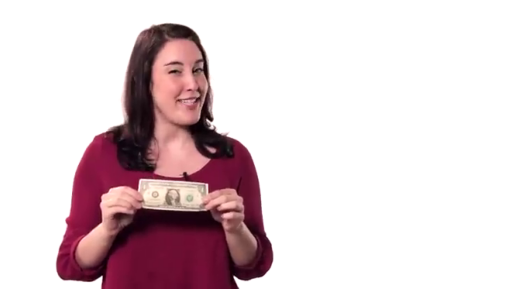

Timestamp: 61.394666666666666


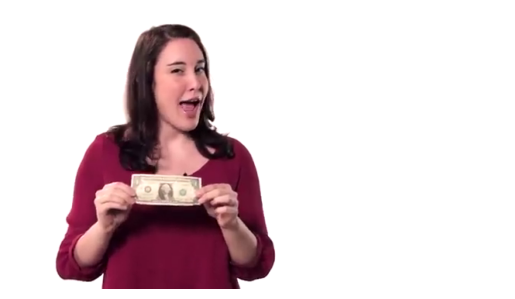

Timestamp: 86.33624999999998


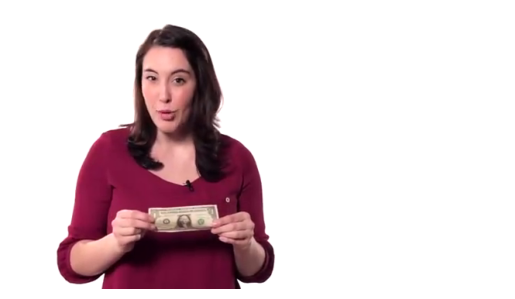

Timestamp: 85.37695833333333


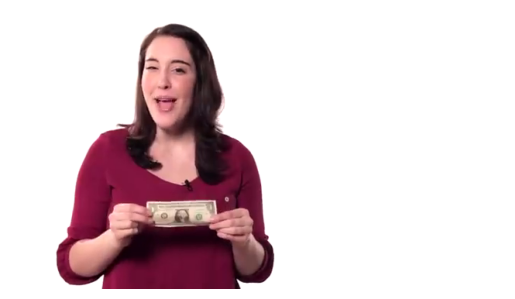

Timestamp: 87.29554166666667


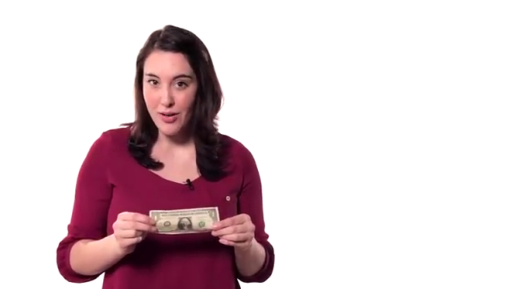

In [94]:

# Call the function
display_frames_matching_query(video_url, query)


In [90]:
dataset['val'][346]

{'video_id': 'video6859',
 'caption': 'a lady is explaining about a dollar',
 'sen_id': 52400,
 'category': 2,
 'url': 'https://www.youtube.com/watch?v=9bx7Vl6klmw',
 'start time': 59.23,
 'end time': 71.7,
 'split': 'validate',
 'id': 6859,
 '__index_level_0__': 6511}

In [91]:
from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)

Downloading...
Download completed.
Frames extracted: 219


100%|██████████| 219/219 [00:00<00:00, 18446.68it/s]


Frames matching the query 'a girl and man look at the sky in amazement':
Timestamp: 103.6035


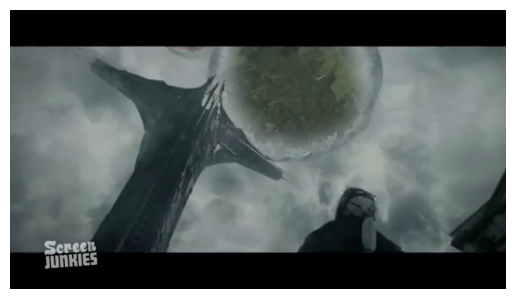

Timestamp: 121.83004166666666


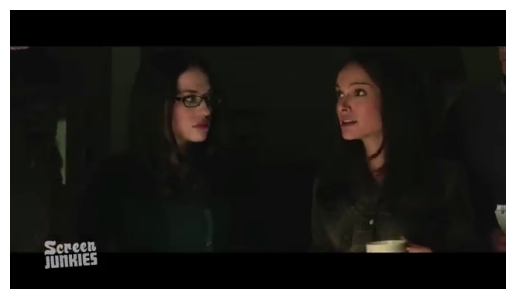

Timestamp: 120.87075


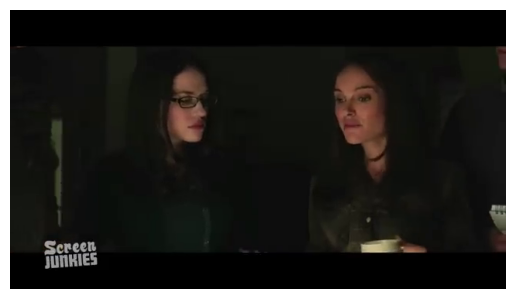

Timestamp: 59.47608333333333


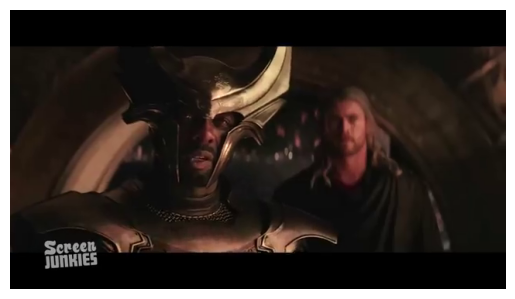

Timestamp: 118.95216666666666


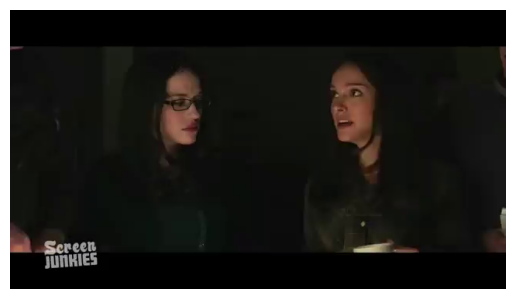

In [97]:
first_row = dataset['val'][4]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)

In [99]:
dataset['val'][4]

{'video_id': 'video6517',
 'caption': 'a girl and man look at the sky in amazement',
 'sen_id': 41200,
 'category': 7,
 'url': 'https://www.youtube.com/watch?v=4eAgsrEX_CA',
 'start time': 96.44,
 'end time': 107.07,
 'split': 'validate',
 'id': 6517,
 '__index_level_0__': 6132}

In [98]:
from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)

Downloading...
Download completed.
Frames extracted: 277


100%|██████████| 277/277 [00:00<00:00, 15946.39it/s]


Frames matching the query 'a boy plays with a toy figure while swiveling its head':
Timestamp: 44.0


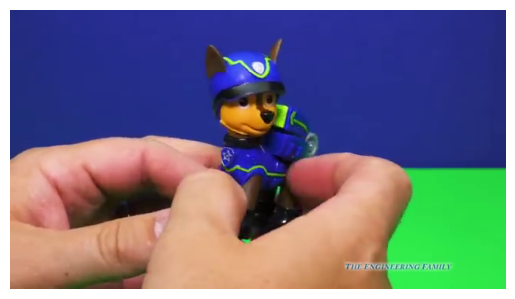

Timestamp: 86.0


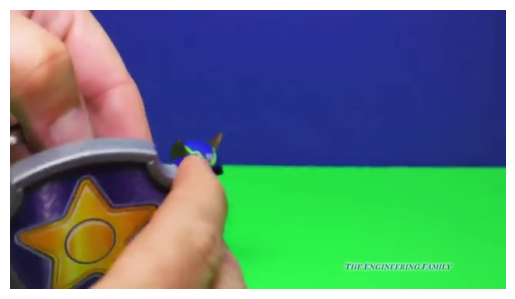

Timestamp: 60.0


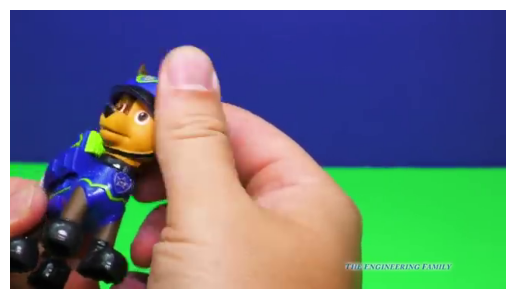

Timestamp: 46.0


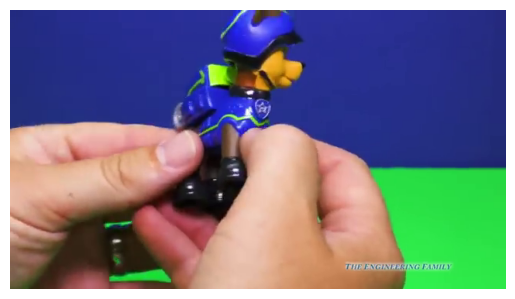

Timestamp: 59.0


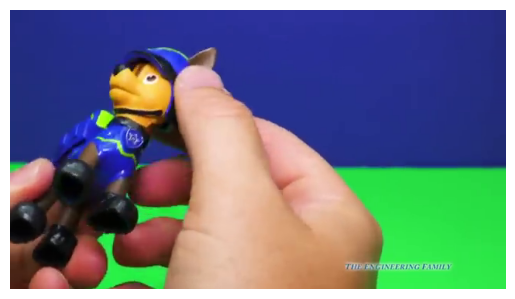

In [106]:
first_row = dataset['val'][344]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)

In [107]:
dataset['val'][344]

{'video_id': 'video6857',
 'caption': 'a boy plays with a toy figure while swiveling its head',
 'sen_id': 13640,
 'category': 10,
 'url': 'https://www.youtube.com/watch?v=8RJNtC0_Mpk',
 'start time': 58.01,
 'end time': 73.63,
 'split': 'validate',
 'id': 6857,
 '__index_level_0__': 6509}

In [108]:
from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)

Downloading...
Download completed.
Frames extracted: 341


100%|██████████| 341/341 [00:00<00:00, 17308.13it/s]


Frames matching the query 'a 16 bit video game character crossing a river and swinging a sword':
Timestamp: 274.0


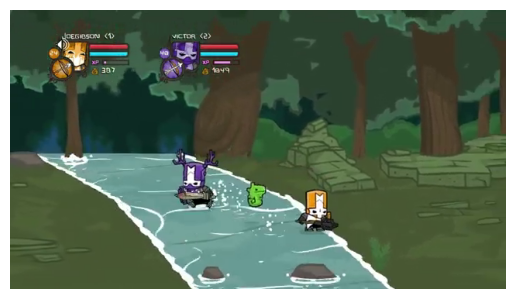

Timestamp: 133.0


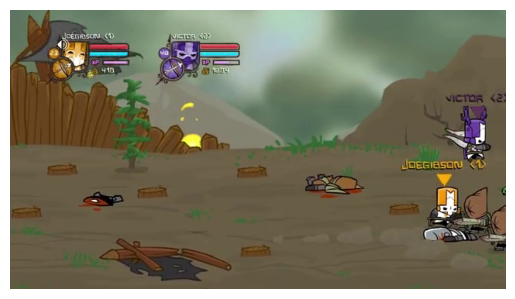

Timestamp: 177.0


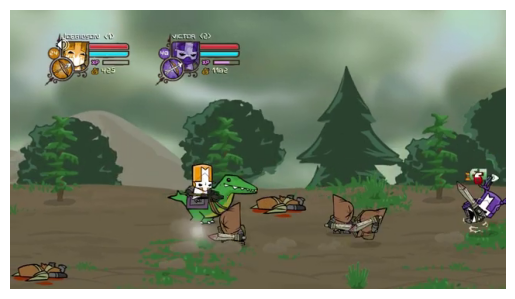

Timestamp: 275.0


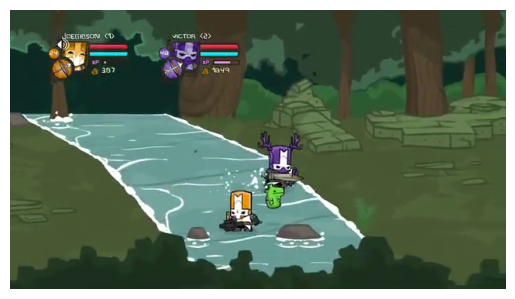

Timestamp: 188.0


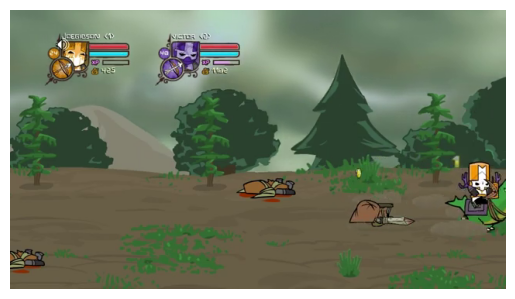

In [109]:
first_row = dataset['val'][343]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)

In [111]:
dataset['val'][343]

{'video_id': 'video6856',
 'caption': 'a 16 bit video game character crossing a river and swinging a sword',
 'sen_id': 1900,
 'category': 13,
 'url': 'https://www.youtube.com/watch?v=9p62la1eKbk',
 'start time': 258.25,
 'end time': 277.25,
 'split': 'validate',
 'id': 6856,
 '__index_level_0__': 6508}

Downloading...
Download completed.
Frames extracted: 32


100%|██████████| 32/32 [00:00<00:00, 12539.03it/s]


Frames matching the query 'a ad about an avengers video game':
Timestamp: 12.470791666666667


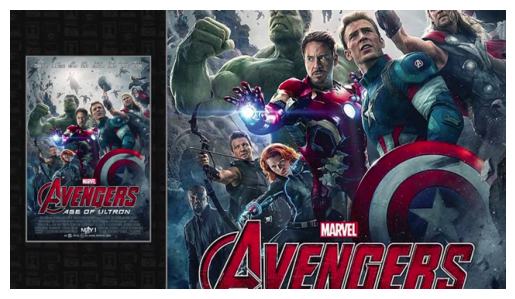

Timestamp: 9.592916666666666


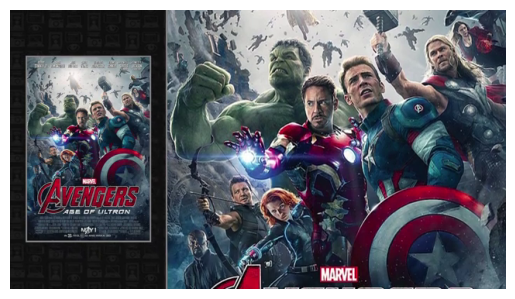

Timestamp: 13.430083333333332


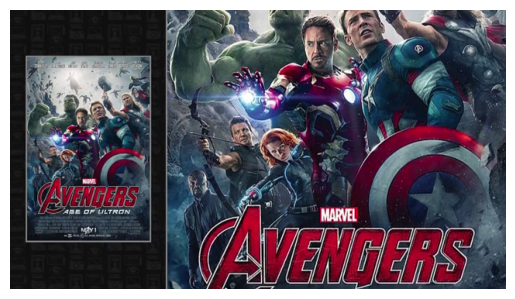

Timestamp: 7.674333333333333


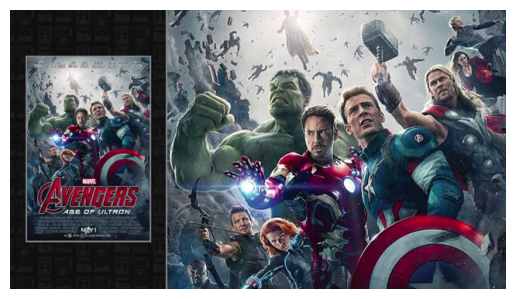

Timestamp: 16.307958333333332


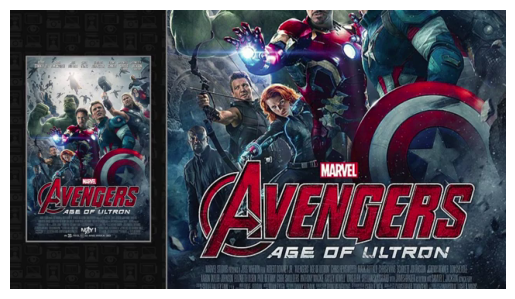

{'video_id': 'video6789', 'caption': 'a ad about an avengers video game', 'sen_id': 1560, 'category': 7, 'url': 'https://www.youtube.com/watch?v=JqKap98KLsY', 'start time': 5.01, 'end time': 18.9, 'split': 'validate', 'id': 6789, '__index_level_0__': 6433}


In [125]:


first_row = dataset['val'][276]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)


print(dataset['val'][276])



from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)

Downloading...
Download completed.
Frames extracted: 338


100%|██████████| 338/338 [00:00<00:00, 18625.68it/s]


Frames matching the query 'a man adds ingredients to a mixer and mixes the ingredients':
Timestamp: 88.0


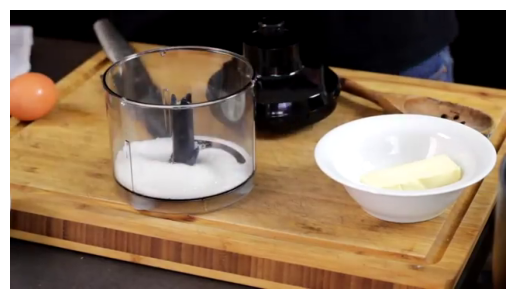

Timestamp: 92.0


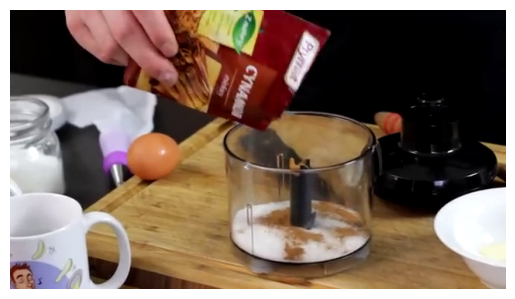

Timestamp: 87.0


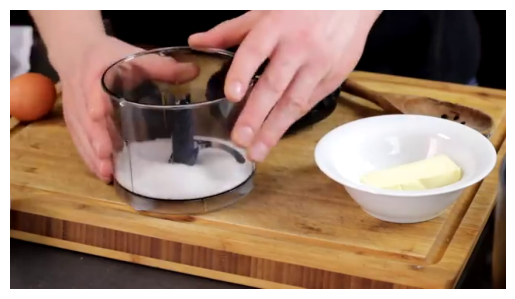

Timestamp: 89.0


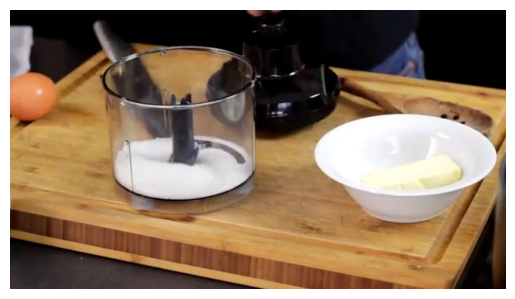

Timestamp: 95.0


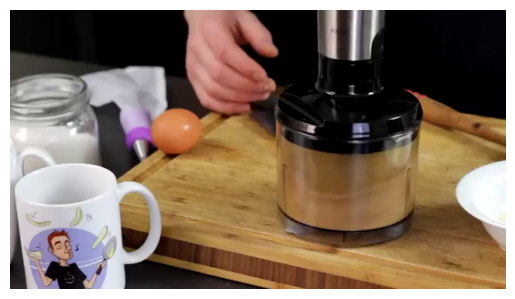

{'video_id': 'video6582',
 'caption': 'a man adds ingredients to a mixer and mixes the ingredients',
 'sen_id': 59640,
 'category': 17,
 'url': 'https://www.youtube.com/watch?v=hEbFWPTqJJ0',
 'start time': 89.37,
 'end time': 111.69,
 'split': 'validate',
 'id': 6582,
 '__index_level_0__': 6204}

In [118]:


first_row = dataset['val'][69]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)



dataset['val'][69]


Downloading...
Download completed.
Frames extracted: 116


100%|██████████| 116/116 [00:00<00:00, 15146.61it/s]


Frames matching the query 'a cnn news clip about terror threats':
Timestamp: 27.093733333333336


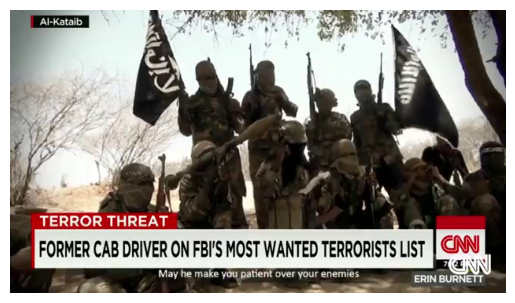

Timestamp: 21.287933333333335


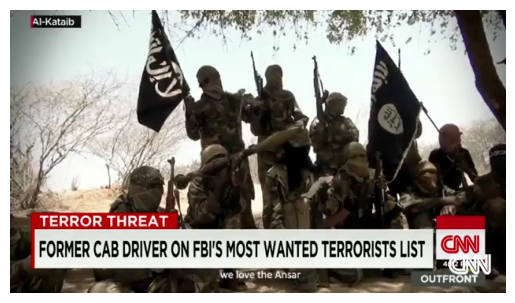

Timestamp: 26.1261


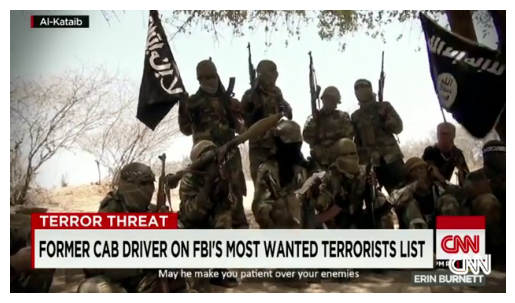

Timestamp: 25.15846666666667


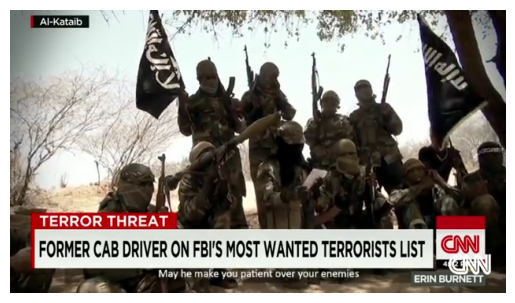

Timestamp: 28.061366666666668


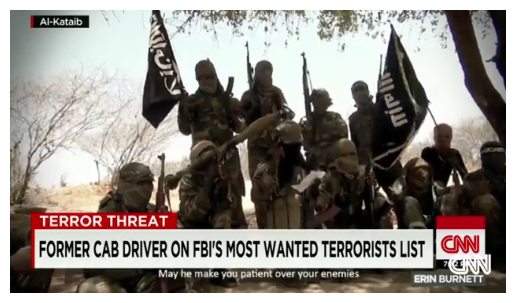

{'video_id': 'video6610',
 'caption': 'a cnn news clip about terror threats',
 'sen_id': 94000,
 'category': 4,
 'url': 'https://www.youtube.com/watch?v=0gWpIfXtpVo',
 'start time': 20.2,
 'end time': 31.57,
 'split': 'validate',
 'id': 6610,
 '__index_level_0__': 6236}

In [123]:


first_row = dataset['val'][97]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)


dataset['val'][97]


Downloading...
Download completed.
Frames extracted: 557


100%|██████████| 557/557 [00:00<00:00, 18303.83it/s]


Frames matching the query 'a group of military men cheering':
Timestamp: 15.482133333333334


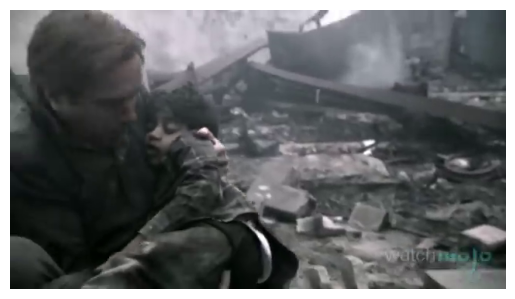

Timestamp: 141.27446666666668


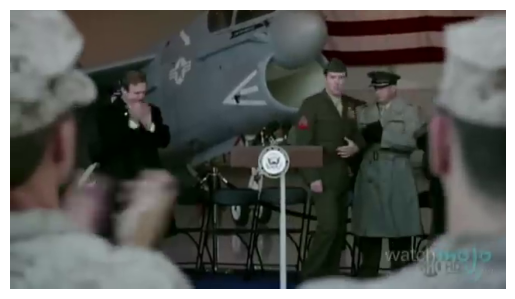

Timestamp: 16.44976666666667


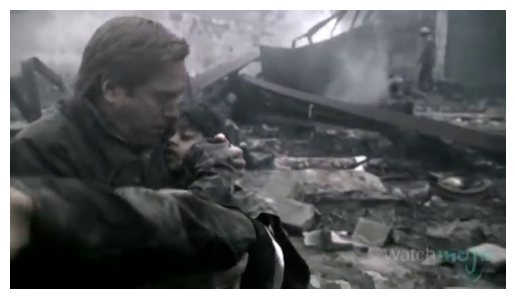

Timestamp: 185.78560000000002


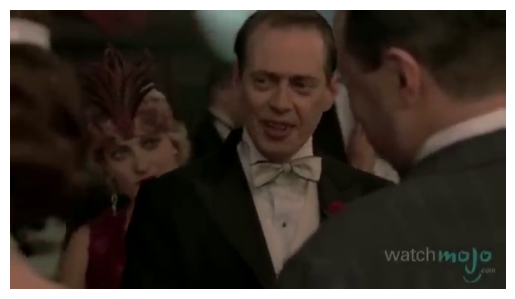

Timestamp: 440.27316666666667


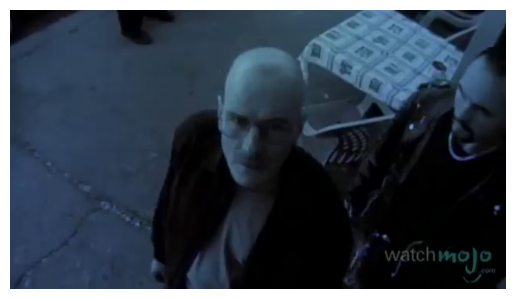

{'video_id': 'video6626',
 'caption': 'a group of military men cheering',
 'sen_id': 27540,
 'category': 6,
 'url': 'https://www.youtube.com/watch?v=9jCgPN7FJ4s',
 'start time': 131.63,
 'end time': 142.71,
 'split': 'validate',
 'id': 6626,
 '__index_level_0__': 6253}

In [128]:


first_row = dataset['val'][113]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)


dataset['val'][113]


Downloading...
Download completed.
Frames extracted: 157


100%|██████████| 157/157 [00:00<00:00, 16883.46it/s]


Frames matching the query 'a girls shows off her bag and sunglasses':
Timestamp: 128.69523333333333


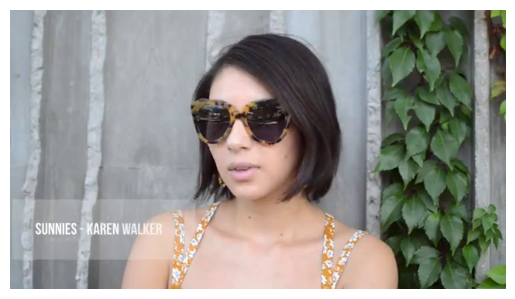

Timestamp: 127.72760000000001


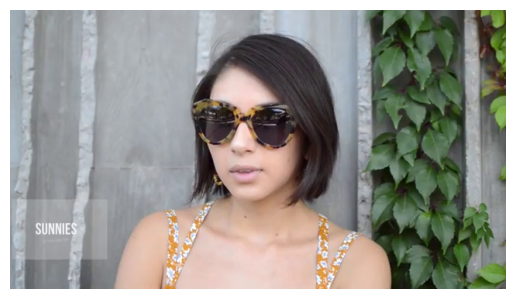

Timestamp: 141.27446666666668


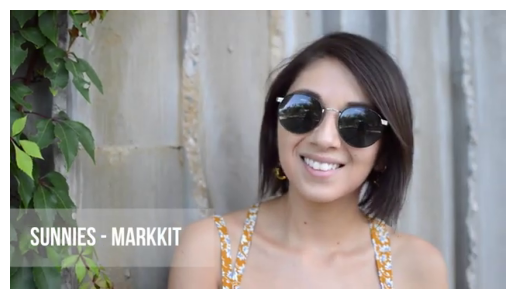

Timestamp: 143.20973333333333


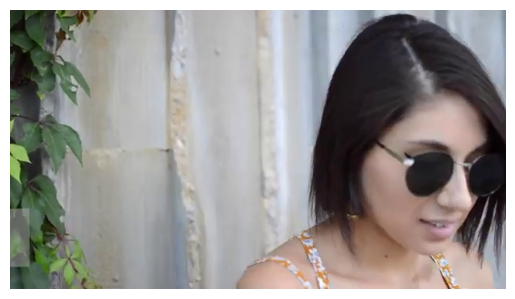

Timestamp: 133.5334


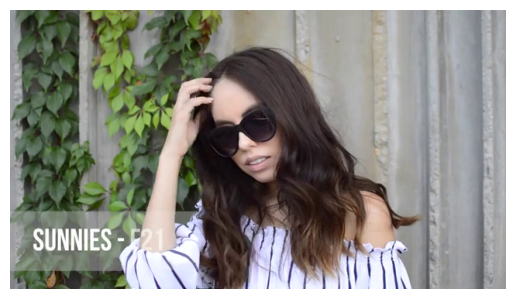

{'video_id': 'video6823',
 'caption': 'a girls shows off her bag and sunglasses',
 'sen_id': 29600,
 'category': 18,
 'url': 'https://www.youtube.com/watch?v=9kYQDuOVTOI',
 'start time': 110.96,
 'end time': 127.11,
 'split': 'validate',
 'id': 6823,
 '__index_level_0__': 6472}

In [130]:


first_row = dataset['val'][310]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)


dataset['val'][310]


In [131]:
from IPython.display import Video

output_filename = "video.mp4"
Video(output_filename)

Downloading...
Download completed.
Frames extracted: 1511


100%|██████████| 1511/1511 [00:00<00:00, 18805.08it/s]


Frames matching the query 'a woman in pink tries to make the most out of a nature trail':
Timestamp: 59.99326666666667


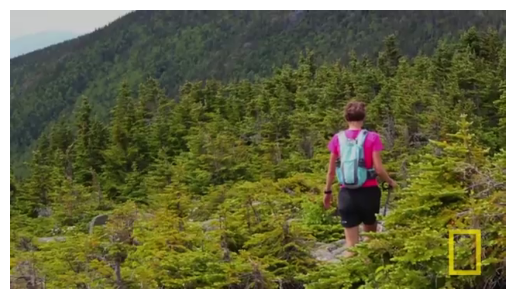

Timestamp: 60.9609


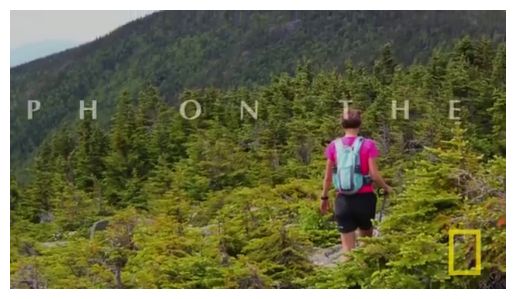

Timestamp: 41.60823333333334


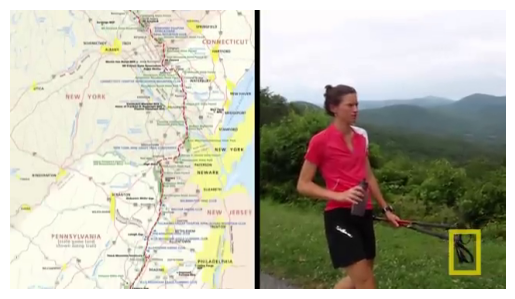

Timestamp: 34.8348


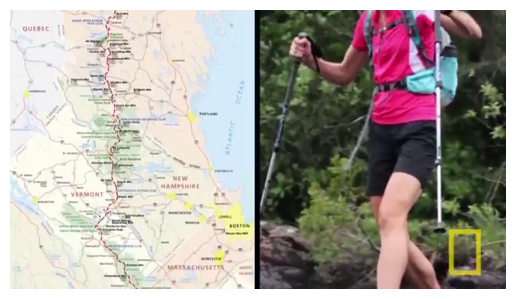

Timestamp: 1346.9456


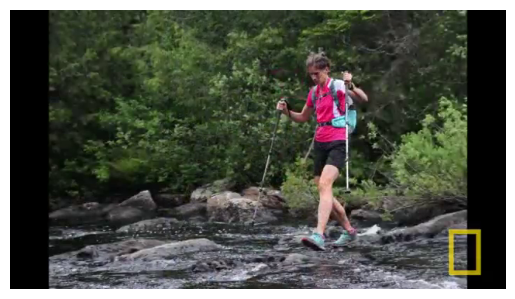

{'video_id': 'video6840',
 'caption': 'a woman in pink tries to make the most out of a nature trail',
 'sen_id': 127460,
 'category': 15,
 'url': 'https://www.youtube.com/watch?v=uzDdKbjto_8',
 'start time': 31.48,
 'end time': 59.87,
 'split': 'validate',
 'id': 6840,
 '__index_level_0__': 6491}

In [133]:


first_row = dataset['val'][327]
video_url = first_row['url']
start_time = first_row['start time']
end_time = first_row['end time']
query = first_row['caption']
# Call the function
display_frames_matching_query(video_url, query)


dataset['val'][327]
